In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pandas

In [ ]:
!pip install cartopy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 62.8 MB/s eta 0:00:00


In [ ]:
!pip install codecarbon

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.0/179.0 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 6.0 MB/s eta 0:00:00


In [ ]:
import pyproj
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import datetime
import geopandas as gpd
from shapely.geometry import Point
import math
import warnings
import time
from sklearn.neighbors import NearestNeighbors
import requests
from codecarbon import EmissionsTracker



In [ ]:
# Crear una instancia del rastreador de emisiones
tracker = EmissionsTracker()

[codecarbon INFO @ 12:39:36] [setup] RAM Tracking...
[codecarbon INFO @ 12:39:36] [setup] GPU Tracking...
[codecarbon INFO @ 12:39:36] No GPU found.
[codecarbon INFO @ 12:39:36] [setup] CPU Tracking...
[codecarbon WARNING @ 12:39:36] No CPU tracking mode found. Falling back on CPU constant mode.
[codecarbon WARNING @ 12:39:37] We saw that you have a Intel(R) Xeon(R) CPU @ 2.20GHz but we don't know it. Please contact us.
[codecarbon INFO @ 12:39:37] CPU Model on constant consumption mode: Intel(R) Xeon(R) CPU @ 2.20GHz
[codecarbon INFO @ 12:39:37] >>> Tracker's metadata:
[codecarbon INFO @ 12:39:37]   Platform system: Linux-6.1.58+-x86_64-with-glibc2.35
[codecarbon INFO @ 12:39:37]   Python version: 3.10.12
[codecarbon INFO @ 12:39:37]   CodeCarbon version: 2.3.2
[codecarbon INFO @ 12:39:37]   Available RAM : 50.994 GB
[codecarbon INFO @ 12:39:37]   CPU count: 8
[codecarbon INFO @ 12:39:37]   CPU model: Intel(R) Xeon(R) CPU @ 2.20GHz
[codecarbon INFO @ 12:39:37]   GPU count: None
[codec

# Importamos Datos

Importación de los datos de los terremotos pre-procesados en el notebook *1_preprocesado_terremotos.ipynb*

In [ ]:
# Iniciar el rastreador
tracker.start()

In [ ]:
# Ruta de la carpeta actual en Google Drive
path = '/content/drive/My Drive/Master ciencia de datos (Big Data & TFM)/TFM - tormentas solares/bases de datos - nuevo'

# Lista los archivos en la carpeta actual
files_in_drive = os.listdir(path)

# Muestra los archivos
print(files_in_drive)

['ACE_SWEPAM_Data_daily.txt', 'Copy of TERREMOTOS Y VOLCANES.xlsx', 'ACE_SWEPAM_info_sobre_updates.txt', 'TERREMOTOS.xlsx', 'dataframes_preprocesados', 'imagenes', 'ACE_SWEPAM_Data_Hour.txt', '2_tratamiento_bordes_tectonicos.ipynb', '1_preprocesado_terremotos.ipynb', '5_1_Modelo_Predictivo.ipynb', '4_variables_solares_y_unirlas_con_terremotos.ipynb', '3_terremotos_DBSCAN.ipynb', '5_2_Modelo_Predictivo_sesgo_magnitud.ipynb']


In [ ]:
# Ruta al archivo CSV en Google Drive
file_path = path + '/dataframes_preprocesados/terremotos_1.xlsx'

# Carga los datos en un DataFrame
df = pd.read_excel(file_path)

# Muestra las primeras filas del DataFrame
df.head()

[codecarbon INFO @ 12:39:59] Energy consumed for RAM : 0.000080 kWh. RAM Power : 19.122633934020996 W
[codecarbon INFO @ 12:39:59] Energy consumed for all CPUs : 0.000177 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 12:39:59] 0.000257 kWh of electricity used since the beginning.
[codecarbon INFO @ 12:40:14] Energy consumed for RAM : 0.000159 kWh. RAM Power : 19.122633934020996 W
[codecarbon INFO @ 12:40:14] Energy consumed for all CPUs : 0.000354 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 12:40:14] 0.000514 kWh of electricity used since the beginning.
[codecarbon INFO @ 12:40:29] Energy consumed for RAM : 0.000239 kWh. RAM Power : 19.122633934020996 W
[codecarbon INFO @ 12:40:29] Energy consumed for all CPUs : 0.000531 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 12:40:29] 0.000770 kWh of electricity used since the beginning.
[codecarbon INFO @ 12:40:44] Energy consumed for RAM : 0.000318 kWh. RAM Power : 19.122633934020996 W
[codecarbon INFO @ 12:40:44] Energy consumed f

,time.1,dia_total,dia_anual,hora,hora_total,latitude,longitude,depth,mag,magType,mag_common,place
0,1998-01-23,1,23,1,1,40.352,29.269,10.0,2.5,md,4.675,"10 km SE of Umurbey, Turkey"
1,1998-01-23,1,23,2,2,51.296,-178.152,33.0,4.9,mb,6.022,"123 km WSW of Adak, Alaska"
2,1998-01-23,1,23,2,2,-25.072,70.007,10.0,4.1,mb,5.238,Mid-Indian Ridge
3,1998-01-23,1,23,4,4,44.344,149.791,33.0,3.7,mb,4.846,"180 km ESE of Kuril’sk, Russia"
4,1998-01-23,1,23,5,5,14.484,146.986,33.0,4.1,mb,5.238,"155 km ESE of Saipan, Northern Mariana Islands"


In [ ]:
len(df)

650465

In [ ]:
# Escogemos los terremotos anteriores al 3 de junio de 2021 porque no disponemos tantos datos del sol. En futuros estudios este valor dependerá de la cantidad de datos solares que se disponga.
df = df[df["time.1"]<"2021-06-03"]

In [ ]:
len(df)

587838

In [ ]:
# Mostrar los tipos de columnas y registros para comprobar la correcta importación

print("Campos:", list(df.columns))
print("\nTipología:\n\n", df.dtypes, "\n")
print("Número de registros:", len(df))

Campos: ['time.1', 'dia_total', 'dia_anual', 'hora', 'hora_total', 'latitude', 'longitude', 'depth', 'mag', 'magType', 'mag_common', 'place']

Tipología:

 time.1        datetime64[ns]
dia_total              int64
dia_anual              int64
hora                   int64
hora_total             int64
latitude             float64
longitude            float64
depth                float64
mag                  float64
magType               object
mag_common           float64
place                 object
dtype: object 

Número de registros: 587838


# Abordemos las Réplicas

**Nos interesa hacer un DBSCAN para excluir las réplicas de terremotos**



1.   Agrupamos por semejanza de latitud + longitud + hora
2.   Agrupamos además por profundidad (después hemos decidido que esto lo descartamos para el proyecto)

In [ ]:
# Creamos nueva columna contando la cantidad de terremotos por día
df['cantidad_diaria'] = df.groupby('dia_total')['time.1'].transform('count')

# Muestra las primeras filas del DataFrame
df.head(300)

<ipython-input-13-cfcf8fe5ab96>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['cantidad_diaria'] = df.groupby('dia_total')['time.1'].transform('count')


,time.1,dia_total,dia_anual,hora,hora_total,latitude,longitude,depth,mag,magType,mag_common,place,cantidad_diaria
0,1998-01-23,1,23,1,1,40.352000,29.269000,10.000,2.5,md,4.675,"10 km SE of Umurbey, Turkey",56
1,1998-01-23,1,23,2,2,51.296000,-178.152000,33.000,4.9,mb,6.022,"123 km WSW of Adak, Alaska",56
2,1998-01-23,1,23,2,2,-25.072000,70.007000,10.000,4.1,mb,5.238,Mid-Indian Ridge,56
3,1998-01-23,1,23,4,4,44.344000,149.791000,33.000,3.7,mb,4.846,"180 km ESE of Kuril’sk, Russia",56
4,1998-01-23,1,23,5,5,14.484000,146.986000,33.000,4.1,mb,5.238,"155 km ESE of Saipan, Northern Mariana Islands",56
...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1998-01-28,6,28,7,127,19.420500,-155.317500,4.794,3.1,md,5.077,"9 km WSW of Volcano, Hawaii",68
296,1998-01-28,6,28,7,127,19.421000,-155.315333,3.901,4.1,md,5.747,"8 km WSW of Volcano, Hawaii",68
297,1998-01-28,6,28,7,127,19.417000,-155.317333,5.334,3.4,md,5.278,"9 km WSW of Volcano, Hawaii",68
298,1998-01-28,6,28,7,127,-33.701000,-70.854000,73.300,2.6,md,4.742,"7 km ESE of Talagante, Chile",68


In [ ]:
df.tail()

,time.1,dia_total,dia_anual,hora,hora_total,latitude,longitude,depth,mag,magType,mag_common,place,cantidad_diaria
587833,2021-06-02,8532,153,22,204766,65.1643,-165.3287,12.00,3.4,ml,4.070,"49 km ESE of Teller, Alaska",63
587834,2021-06-02,8532,153,22,204766,0.6683,122.5372,79.60,4.5,mb,5.630,"60 km WNW of Gorontalo, Indonesia",63
587835,2021-06-02,8532,153,22,204766,-17.9083,-178.5209,593.58,4.9,mb,6.022,"229 km E of Levuka, Fiji",63
587836,2021-06-02,8532,153,22,204766,36.8660,68.3333,10.00,4.2,mb,5.336,"47 km SSE of Shahritus, Tajikistan",63
587837,2021-06-02,8532,153,22,204766,-35.8897,-103.1263,10.00,4.6,mb,5.728,southeast of Easter Island,63


In [ ]:
tracker.stop()

[codecarbon INFO @ 12:42:02] Energy consumed for RAM : 0.000734 kWh. RAM Power : 19.122633934020996 W
[codecarbon INFO @ 12:42:02] Energy consumed for all CPUs : 0.001633 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 12:42:02] 0.002366 kWh of electricity used since the beginning.


0.0006756182968046355

# Tanteamos con el Top 10


---

**Haremos un pequeño estudio de agrupación con los 10 días con más terremotos que hubo**

---

In [ ]:
# Iniciar el rastreador
tracker.start()

[codecarbon WARNING @ 12:42:02] Already started tracking


In [ ]:
# Creamos lista con los distintos valores de cantidad_diaria y nos quedamos con los 10 más altos

cantidades_diarias = sorted(list(set(list(df["cantidad_diaria"]))), reverse=True)

cantidades_diarias_top10 = cantidades_diarias[:10]

print(cantidades_diarias)
print(cantidades_diarias_top10)

# Por curiosidad veremos cuáles fueron estos días

dias_potentes = []

for n in list(cantidades_diarias_top10):
  dias_potentes.append(list(df["time.1"][df["cantidad_diaria"]==n])[0])

print("\nLos días con mayor actividad sísmica fueron:\n")

for dia in dias_potentes:
  print(dia.strftime('%Y-%m-%d'))

[1277, 716, 619, 554, 543, 436, 430, 423, 401, 398, 394, 355, 341, 330, 327, 325, 323, 320, 317, 315, 308, 303, 301, 300, 298, 297, 295, 294, 293, 290, 288, 287, 286, 284, 281, 279, 277, 276, 273, 272, 268, 266, 265, 263, 262, 260, 259, 250, 248, 247, 244, 242, 238, 236, 234, 233, 232, 231, 230, 226, 225, 223, 221, 219, 218, 210, 209, 207, 206, 205, 203, 202, 201, 200, 199, 197, 196, 193, 190, 189, 187, 186, 185, 183, 182, 181, 180, 179, 177, 176, 175, 174, 173, 172, 171, 170, 169, 168, 167, 166, 165, 164, 162, 161, 160, 159, 158, 157, 156, 155, 154, 153, 152, 151, 150, 148, 147, 146, 145, 144, 143, 142, 141, 140, 139, 138, 137, 136, 135, 134, 133, 132, 131, 130, 129, 128, 127, 126, 125, 124, 123, 122, 121, 120, 119, 118, 117, 116, 115, 114, 113, 112, 111, 110, 109, 108, 107, 106, 105, 104, 103, 102, 101, 100, 99, 98, 97, 96, 95, 94, 93, 92, 91, 90, 89, 88, 87, 86, 85, 84, 83, 82, 81, 80, 79, 78, 77, 76, 75, 74, 73, 72, 71, 70, 69, 68, 67, 66, 65, 64, 63, 62, 61, 60, 59, 58, 57, 56, 55

In [ ]:
# Nos quedamos con los 10 días más activos y lo llamamos df_top10

df_top10 = df[df["cantidad_diaria"] > 390]

print(len(df_top10), sum(cantidades_diarias_top10))
df_top10.head()

6191 5797


,time.1,dia_total,dia_anual,hora,hora_total,latitude,longitude,depth,mag,magType,mag_common,place,cantidad_diaria
92452,2002-11-04,1747,308,0,41904,63.2457,-145.530700,0.30,4.3,ml,4.970,"17 km NNE of Paxson, Alaska",619
92453,2002-11-04,1747,308,0,41904,63.5486,-147.617300,2.00,4.0,mb,5.140,"67 km ESE of McKinley Park, Alaska",619
92454,2002-11-04,1747,308,0,41904,63.4577,-147.770500,5.60,3.0,ml,3.670,"59 km E of Cantwell, Alaska",619
92455,2002-11-04,1747,308,0,41904,32.6275,-118.028667,6.84,2.5,mh,4.675,"36km SE of San Clemente Is. (SE tip), California",619
92456,2002-11-04,1747,308,0,41904,62.8084,-143.688200,2.50,4.9,mb,6.022,"13 km SSE of Mentasta Lake, Alaska",619


---

**LAS LONGITUDES Y LATITUDES LAS PASAMOS A COORDENADAS ESFÉRICAS**

x = R cos(phy) cos(theta)

y = R sin(phy) cos(theta)

z = R sin(theta)


**Agrupaciones en superficie:**

In [ ]:
df_top10['c.x'] = np.cos(np.radians(df_top10['longitude'])) * np.cos(np.radians(df_top10['latitude']))
df_top10['c.y'] = np.sin(np.radians(df_top10['longitude'])) * np.cos(np.radians(df_top10['latitude']))
df_top10['c.z'] = np.sin(np.radians(df_top10['latitude']))


# Mostrar las primeras filas del DataFrame actualizado
df_top10[['longitude', 'latitude', 'c.x', 'c.y', 'c.z']].head()

<ipython-input-19-c66083b3ae5e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top10['c.x'] = np.cos(np.radians(df_top10['longitude'])) * np.cos(np.radians(df_top10['latitude']))
<ipython-input-19-c66083b3ae5e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top10['c.y'] = np.sin(np.radians(df_top10['longitude'])) * np.cos(np.radians(df_top10['latitude']))
<ipython-input-19-c66083b3ae5e>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[ro

,longitude,latitude,c.x,c.y,c.z
92452,-145.530700,63.2457,-0.371130,-0.254778,0.892945
92453,-147.617300,63.5486,-0.376168,-0.238564,0.895313
92454,-147.770500,63.4577,-0.378006,-0.238315,0.894605
92455,-118.028667,32.6275,-0.395758,-0.743415,0.539175
92456,-143.688200,62.8084,-0.368227,-0.270607,0.889483


Creamos el primer modelo de clusterización para comprobar su buen funcionamiento con las coordenadas esféricas. Hemos optado por ellas porque queremos evitar que las longitudes cercanas a +180º y -180º las considere lejanas entre ellas cuando realmente están cerca.

Consideramos min_samples = 2 porque dado la naturaleza de nuestros datos consideramos que el *terremoto padre* es aquel que ha ocasionado una réplica como mínimo.

In [ ]:
# Seleccionar las variables para el clustering
df_clustering = df_top10[['hora_total', 'c.x', 'c.y', 'c.z']]

# Estandarizar las variables numéricas para que tengan media 0 y desviación estándar 1
scaler = StandardScaler()
df_clustering_scaled = scaler.fit_transform(df_clustering)

# Aplicar DBSCAN
eps_value = 0.1  # Para tantear un poco los datos
min_samples_value = 2  # Solo hay un vecino en el radio de epsilon

dbscan = DBSCAN(eps=eps_value, min_samples=min_samples_value)
df_top10['cluster'] = dbscan.fit_predict(df_clustering_scaled)

<ipython-input-20-285f1116c185>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top10['cluster'] = dbscan.fit_predict(df_clustering_scaled)


In [ ]:
# Mostrar los resultados
df_top10[['hora_total', 'latitude', 'longitude', 'cluster']].head(1000)

,hora_total,latitude,longitude,cluster
92452,41904,63.245700,-145.530700,0
92453,41904,63.548600,-147.617300,0
92454,41904,63.457700,-147.770500,0
92455,41904,32.627500,-118.028667,-1
92456,41904,62.808400,-143.688200,0
...,...,...,...,...
297118,106929,32.110333,-115.254667,9
297119,106929,32.115667,-115.092000,9
297120,106930,32.401167,-115.608000,9
297121,106930,32.279833,-115.462000,9


In [ ]:
tracker.stop()

[codecarbon WARNING @ 12:42:02] Tracker already stopped !
[codecarbon INFO @ 12:42:02] Energy consumed for RAM : 0.000736 kWh. RAM Power : 19.122633934020996 W
[codecarbon INFO @ 12:42:02] Energy consumed for all CPUs : 0.001637 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 12:42:02] 0.002373 kWh of electricity used since the beginning.


0.0006775014500636538

Nombramos **Terremotos Padre** a aquellos que se hallan al inicio a una secuencia de réplicas sísmicas, pues supondremos que son los causantes de estas.

Los **Terremotos Individuales** son aquellos que no originan réplicas y, por tanto, en nuestro modelo DBSCAN no han podido ser agrupados en ningún cluster.

In [ ]:
print("número total de clusters:" ,len(set(list(df_top10['cluster'])))-1)

número total de clusters: 83


In [ ]:
print("número total de terremotos padre + individuales:" ,len(set(list(df_top10['cluster']))) -1 + len(df_top10[(df_top10['cluster']==-1)]))

número total de terremotos padre + individuales: 292


In [ ]:
print("inicialmente teníamos un total de estos terremotos:", len(df_top10))

inicialmente teníamos un total de estos terremotos: 6191


In [ ]:
def graficar_clusters(data, etiqueta=0, leyenda=0, mapa=0, eje_x=16, eje_y=16, titulo='DBSCAN Clustering Results'):

  # Filtrar los clústeres diferentes de -1
  df_clustered = data[data['cluster'] != -1]

  # Crear una figura 3D
  fig = plt.figure(figsize=(eje_x, eje_y))
  ax = fig.add_subplot(111, projection='3d')

  # Colores para los diferentes clústeres (utilizamos 'rainbow' para una paleta de colores completa)
  scatter = ax.scatter(
      df_clustered['dia_total'],
      df_clustered['longitude'],
      df_clustered['latitude'],
      c=df_clustered['cluster'],
      cmap='rainbow',
      s=20
  )

  if etiqueta != 0:
    # Etiquetar cada punto con el número de clúster
    for i, txt in enumerate(df_clustered['cluster']):
        ax.text(df_clustered['dia_total'].iloc[i], df_clustered['longitude'].iloc[i], df_clustered['latitude'].iloc[i], str(txt), color='black', alpha=0.4)

  if leyenda != 0:
    # Crear una leyenda personalizada con todos los clústeres
    unique_clusters = df_clustered['cluster'].unique()
    handles = [plt.Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=plt.cm.rainbow(cluster / len(unique_clusters)), markersize=5) for cluster in unique_clusters]

    # Configurar la leyenda personalizada
    ax.legend(handles=handles, title='Clusters', ncol=2)

  # Etiquetas de los ejes
  ax.set_xlabel('Día total')
  ax.set_ylabel('Longitud')
  ax.set_zlabel('Latitud')

  # Título del gráfico
  ax.set_title(titulo)

  print("número total de clusters:" ,"\t\t\t\t" ,len(set(list(df_clustered['cluster']))))
  print("número total de terremotos padre + individuales:\t" ,len(set(list(df_clustered['cluster']))) + len( data[data['cluster'] == -1] ) )
  print("inicialmente teníamos un total de estos terremotos:\t", len(data), "\n\n")

  # Guardar la gráfica

  # Verificar si el archivo ya existe
  nombre_archivo = "grafica_0.png"
  ruta_carpeta = "/content/drive/My Drive/Master ciencia de datos (Big Data & TFM)/TFM - tormentas solares/bases de datos - nuevo/imagenes/"
  ruta_archivo = os.path.join(ruta_carpeta, nombre_archivo)

  contador = 1
  while os.path.exists(ruta_archivo):
      # Si el archivo ya existe, cambiar el nombre agregando un número al final
      nombre_archivo = f"grafica_{contador}.png"
      ruta_archivo = os.path.join(ruta_carpeta, nombre_archivo)
      contador += 1

  # Guardar la gráfica
  plt.savefig(ruta_archivo)

  # Mostrar el gráfico
  plt.show()


  # ______________ MAPA _______________


  if mapa != 0:

    # Crear un GeoDataFrame para representar la Tierra
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

    # Crear un GeoDataFrame con los terremotos
    geometry = [Point(xy) for xy in zip(df_clustered['longitude'], df_clustered['latitude'])]
    gdf_terremotos = gpd.GeoDataFrame(df_clustered, geometry=geometry)

    # Configurar la figura y el eje
    fig, ax = plt.subplots(figsize=(12, 8))
    world.boundary.plot(ax=ax, linewidth=1, color='black')

    # Graficar los terremotos sobre el plano 2D
    scatter = ax.scatter(
        gdf_terremotos.geometry.x,
        gdf_terremotos.geometry.y,
        c=df_clustered['dia_total'],
        cmap='rainbow',
        s=20,
        alpha=0.5
    )

    # Configurar el colorbar
    cb = plt.colorbar(scatter, orientation='vertical')
    cb.set_label('Día total')
    if titulo == 'DBSCAN Clustering Results':
      titulo = ''
    ax.set_title(f'Terremotos en un plano 2D (Latitud vs. Longitud) - {titulo}')

    # Mostrar la gráfica
    plt.show()



número total de clusters: 				 83
número total de terremotos padre + individuales:	 292
inicialmente teníamos un total de estos terremotos:	 6191 




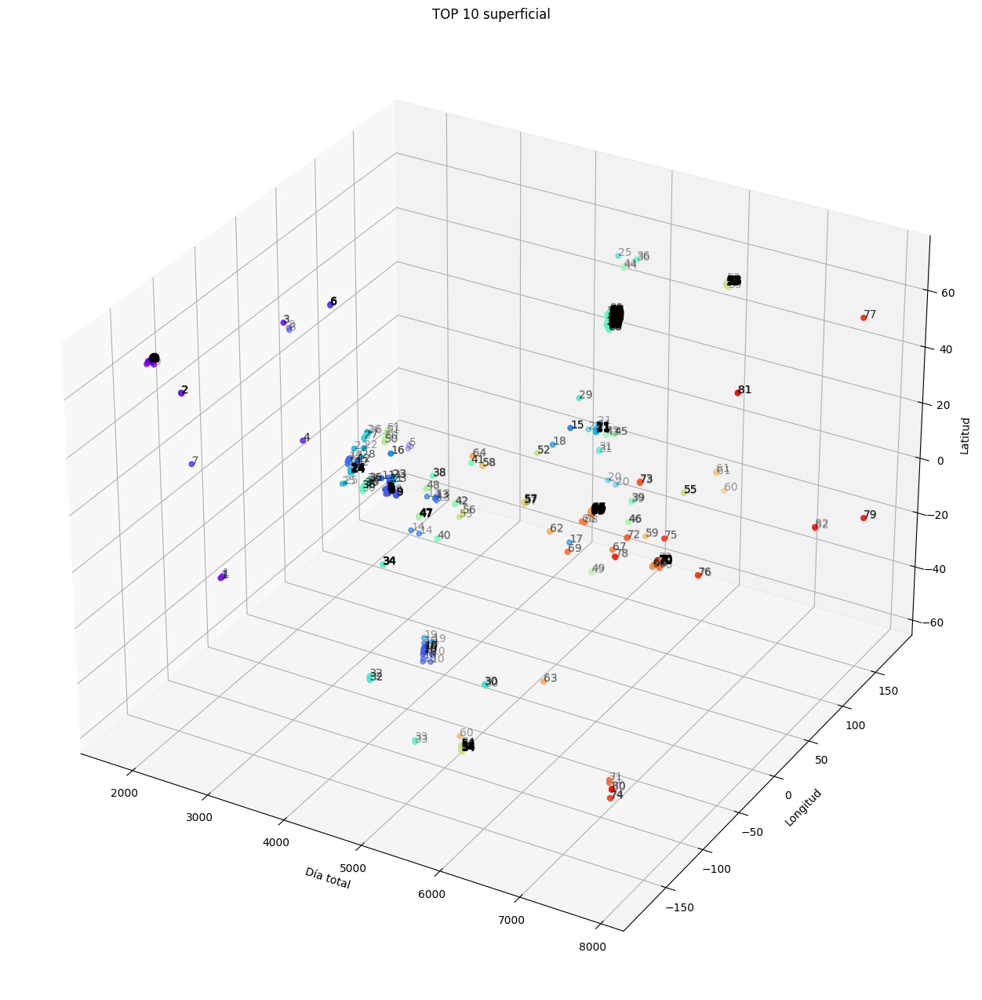

<ipython-input-53-e5d024cf5ecf>:73: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


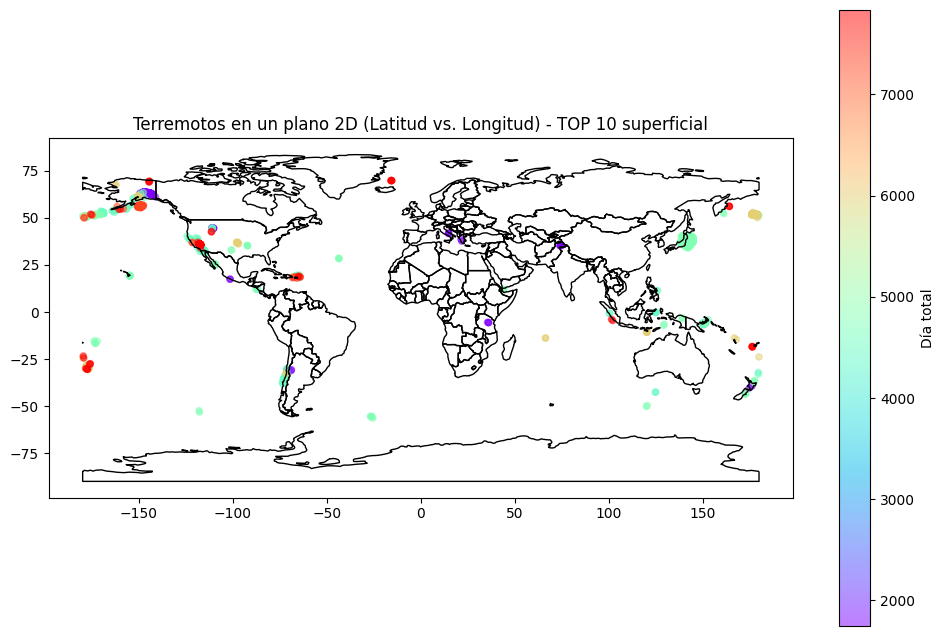

In [ ]:
graficar_clusters(df_top10, etiqueta=1, mapa=1, titulo='TOP 10 superficial')

---
---
**CONCLUSIONES TOP 10 superficial**



1.   Los mejores parámetros de comparación son **eps** = 0.1 y **min_samples** = 2
2.   **NO** estamos considerando __profundidad__

---
---

# TOP 10 con profundidad

Esto se puede ignorar, no hemos considerado las profundidades en ningún momento de nuestro estudio más allá de un breve muestreo aquí.

Ahora vamos a tener en cuenta la profundidad, de tal manera que se compararán "esferas" de proximidad en el interior de la Tierra. Consideraremos mismos parámetros inicialmente.

**TOP 10 con profundidad**

In [ ]:
# Mostramos primeras filas de TOP_10 con los campos que vamos a usar:

df_top10[['hora_total' ,'longitude', 'latitude', 'c.x', 'c.y', 'c.z', 'depth']].head()

In [ ]:
# Seleccionar las variables para el clustering
df_clustering = df_top10[['hora_total', 'c.x', 'c.y', 'c.z', 'depth']]

# Estandarizar las variables numéricas para que tengan media 0 y desviación estándar 1
scaler = StandardScaler()
df_clustering_scaled = scaler.fit_transform(df_clustering)

# Aplicar DBSCAN
eps_value = 0.1          # Radio de comparación
min_samples_value = 2    # Consideramos mínimo 1 terremoto padre que origina 1 hijo

dbscan = DBSCAN(eps=eps_value, min_samples=min_samples_value)
df_top10['cluster_depth'] = dbscan.fit_predict(df_clustering_scaled)

In [ ]:
# Mostrar los resultados
df_top10[['hora_total', 'latitude', 'longitude', 'cluster', 'cluster_depth']].head(1000)

In [ ]:
print("número total de clusters CON profundidad:" ,"\t\t\t\t" ,len(set(list(df_top10['cluster_depth'])))-1, "\t(depth)")
print("número total de terremotos padre + individuales CON profundidad:\t" ,len(set(list(df_top10['cluster_depth']))) -1 + len(df_top10[(df_top10['cluster_depth']==-1)]), "\t(depth)")
print("inicialmente teníamos un total de estos terremotos:\t\t\t", len(df_top10))

In [ ]:
print("número total de clusters SIN profundidad:" ,"\t\t\t\t" ,len(set(list(df_top10['cluster'])))-1)
print("número total de terremotos padre + individuales SIN profundidad:\t" ,len(set(list(df_top10['cluster']))) -1 + len(df_top10[(df_top10['cluster']==-1)]))
print("inicialmente teníamos un total de estos terremotos:\t\t\t", len(df_top10))

**Graficamos con profundidad**

In [ ]:
# Filtrar los clústeres diferentes de -1
df_clustered = df_top10[df_top10['cluster_depth'] != -1]

# Crear una figura 3D
fig = plt.figure(figsize=(20, 16))
ax = fig.add_subplot(111, projection='3d')

# Colores para los diferentes clústeres (utilizamos 'rainbow' para una paleta de colores completa)
scatter = ax.scatter(
    df_clustered['dia_total'],
    df_clustered['latitude'],
    df_clustered['longitude'],
    c=df_clustered['cluster_depth'],
    cmap='rainbow',
    s=20
)

# Etiquetar cada punto con el número de clúster
for i, txt in enumerate(df_clustered['cluster_depth']):
    ax.text(df_clustered['dia_total'].iloc[i], df_clustered['latitude'].iloc[i], df_clustered['longitude'].iloc[i], str(txt), color='black', alpha=0.25)

# Crear una leyenda personalizada con todos los clústeres
unique_clusters = df_clustered['cluster_depth'].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                      markerfacecolor=plt.cm.rainbow(cluster / len(unique_clusters)), markersize=5) for cluster in unique_clusters]

# Configurar la leyenda personalizada
ax.legend(handles=handles, title='Clusters', ncol=2)

# Etiquetas de los ejes
ax.set_xlabel('Día total')
ax.set_ylabel('Latitude')
ax.set_zlabel('Longitude')

# Título del gráfico
ax.set_title('DBSCAN Clustering Results with Depth')

# Mostrar el gráfico
plt.show()

In [ ]:
# Crear un GeoDataFrame para representar la Tierra
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Crear un GeoDataFrame con los terremotos
geometry = [Point(xy) for xy in zip(df_clustered['longitude'], df_clustered['latitude'])]
gdf_terremotos = gpd.GeoDataFrame(df_clustered, geometry=geometry)

# Configurar la figura y el eje
fig, ax = plt.subplots(figsize=(12, 8))
world.boundary.plot(ax=ax, linewidth=1, color='black')

# Graficar los terremotos sobre el plano 2D
scatter = ax.scatter(
    gdf_terremotos.geometry.x,
    gdf_terremotos.geometry.y,
    c=df_clustered['dia_total'],
    cmap='rainbow',
    s=20,
    alpha=0.5
)

# Configurar el colorbar
cb = plt.colorbar(scatter, orientation='vertical')
cb.set_label('Día total')
ax.set_title('Terremotos en un plano 2D (Latitud vs. Longitud) agrupados con profundidad')

# Mostrar la gráfica
plt.show()

Lo malo de tener en cuenta las profundidades es que **perdemos info** sobre cuál ha sido el primer terremoto generado de un conjunto grande de terremotos, pues el primero en ocurrir puede haber sido más profundo y desatar una cadena en la superficie. Teniendo en cuenta las profundidades, generaríamos 2 clústers distintos con sus 2 respectivos terremotos padre cuando realmente debería ser 1 que ha causado el resto.



---



---



---



---



---



---



# Clústers Superficiales TODO el Dataset

Hemos llamado **superficiales** por decir algo, ya que simplemente no estamos considerando la profundidad. La etiqueta de "superficial" es porque lo que estamos comparando es la proximidad del epicentro del terremoto padre respecto al epicentro de los demás terremotos réplica, siendo estos supuestos a una misma profundidad (o *superficie* de la proyección esférica).



**Clústers SUPERFICIALES de TODO el Dataset**



---



---



1.   Eps = 0.1
2.   min_samples_value = 2



---



---



---





In [ ]:
# Iniciar el rastreador
tracker.start()

[codecarbon WARNING @ 12:42:17] Already started tracking


Usamos estos valores para ir tanteando

In [ ]:
df['c.x'] = np.cos(np.radians(df['longitude'])) * np.cos(np.radians(df['latitude']))
df['c.y'] = np.sin(np.radians(df['longitude'])) * np.cos(np.radians(df['latitude']))
df['c.z'] = np.sin(np.radians(df['latitude']))


# Mostrar las primeras filas del DataFrame actualizado
df.head()

,time.1,dia_total,dia_anual,hora,hora_total,latitude,longitude,depth,mag,magType,mag_common,place,cantidad_diaria,c.x,c.y,c.z
0,1998-01-23,1,23,1,1,40.352,29.269,10.0,2.5,md,4.675,"10 km SE of Umurbey, Turkey",56,0.664789,0.372589,0.647482
1,1998-01-23,1,23,2,2,51.296,-178.152,33.0,4.9,mb,6.022,"123 km WSW of Adak, Alaska",56,-0.624972,-0.020165,0.780387
2,1998-01-23,1,23,2,2,-25.072,70.007,10.0,4.1,mb,5.238,Mid-Indian Ridge,56,0.309690,0.851189,-0.423757
3,1998-01-23,1,23,4,4,44.344,149.791,33.0,3.7,mb,4.846,"180 km ESE of Kuril’sk, Russia",56,-0.618035,0.359835,0.698965
4,1998-01-23,1,23,5,5,14.484,146.986,33.0,4.1,mb,5.238,"155 km ESE of Saipan, Northern Mariana Islands",56,-0.811887,0.527527,0.250110


In [ ]:
# Seleccionar las variables para el clustering
df_clustering = df[['hora_total', 'c.x', 'c.y', 'c.z']]

# Estandarizar las variables numéricas para que tengan media 0 y desviación estándar 1
scaler = StandardScaler()
df_clustering_scaled = scaler.fit_transform(df_clustering)

# Aplicar DBSCAN
eps_value = 0.1  # Puedes ajustar este valor según tus necesidades
min_samples_value = 2  # Puedes ajustar este valor según tus necesidades

dbscan = DBSCAN(eps=eps_value, min_samples=min_samples_value)
df['cluster'] = dbscan.fit_predict(df_clustering_scaled)

In [ ]:
tracker.stop()

[codecarbon WARNING @ 12:43:01] Tracker already stopped !
[codecarbon WARNING @ 12:43:01] Background scheduler didn't run for a long period (58s), results might be inaccurate
[codecarbon INFO @ 12:43:01] Energy consumed for RAM : 0.001048 kWh. RAM Power : 19.122633934020996 W
[codecarbon INFO @ 12:43:01] Energy consumed for all CPUs : 0.002331 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 12:43:01] 0.003379 kWh of electricity used since the beginning.


0.0009645982149037626

In [ ]:
# Mostrar los resultados
df[['hora_total', 'latitude', 'longitude', 'cluster']].head(1000)

,hora_total,latitude,longitude,cluster
0,1,40.352000,29.269000,0
1,2,51.296000,-178.152000,0
2,2,-25.072000,70.007000,1
3,4,44.344000,149.791000,0
4,5,14.484000,146.986000,0
...,...,...,...,...
995,460,36.374167,-120.310833,0
996,461,44.388000,17.351000,0
997,461,-15.704000,-178.076000,0
998,461,63.289700,-149.246000,0


In [ ]:
print("número total de clusters superficiales totales:" ,"\t\t\t" ,len(set(list(df['cluster'])))-1)
print("número total de terremotos padre + individuales superficiales:\t\t" ,len(set(list(df['cluster']))) -1 + len(df[(df['cluster']==-1)]))
print("inicialmente teníamos un total de estos terremotos:\t\t\t", len(df))

número total de clusters superficiales totales: 			 886
número total de terremotos padre + individuales superficiales:		 2684
inicialmente teníamos un total de estos terremotos:			 587838


número total de clusters: 				 886
número total de terremotos padre + individuales:	 2684
inicialmente teníamos un total de estos terremotos:	 587838 




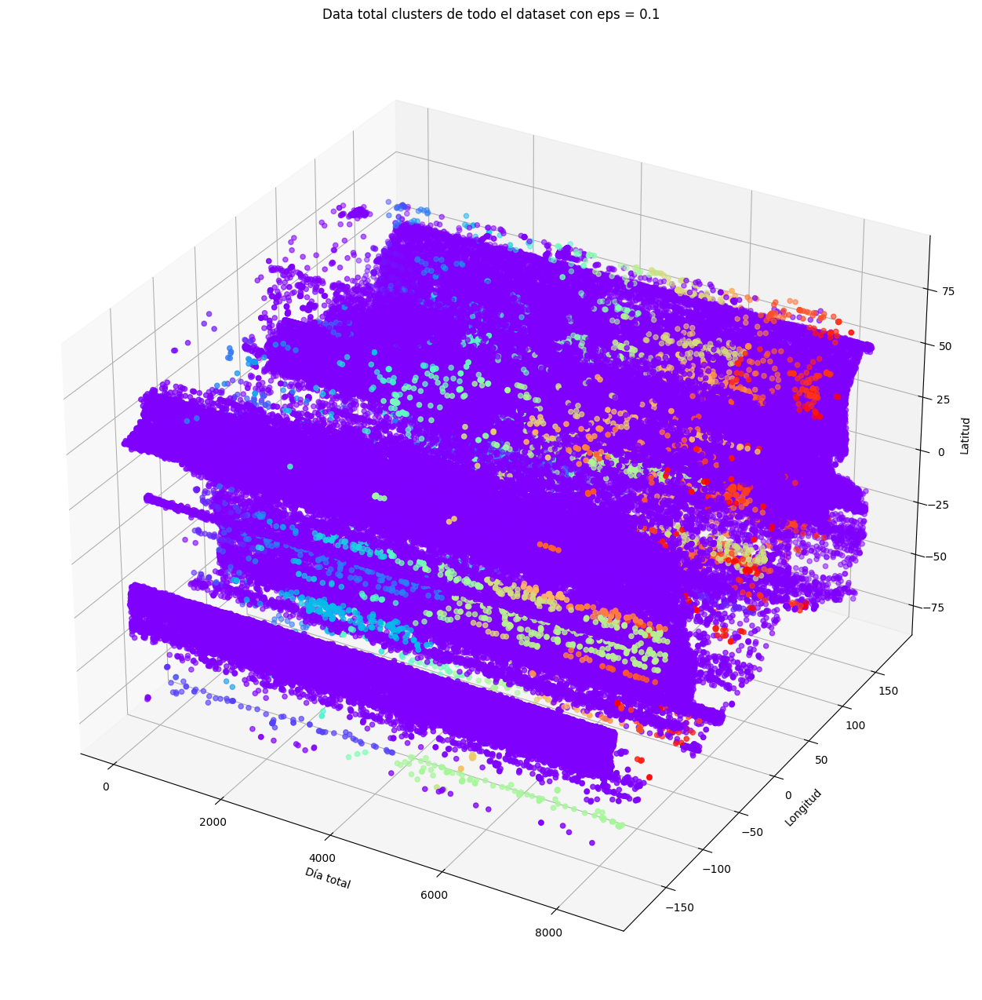

<ipython-input-26-e5d024cf5ecf>:73: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


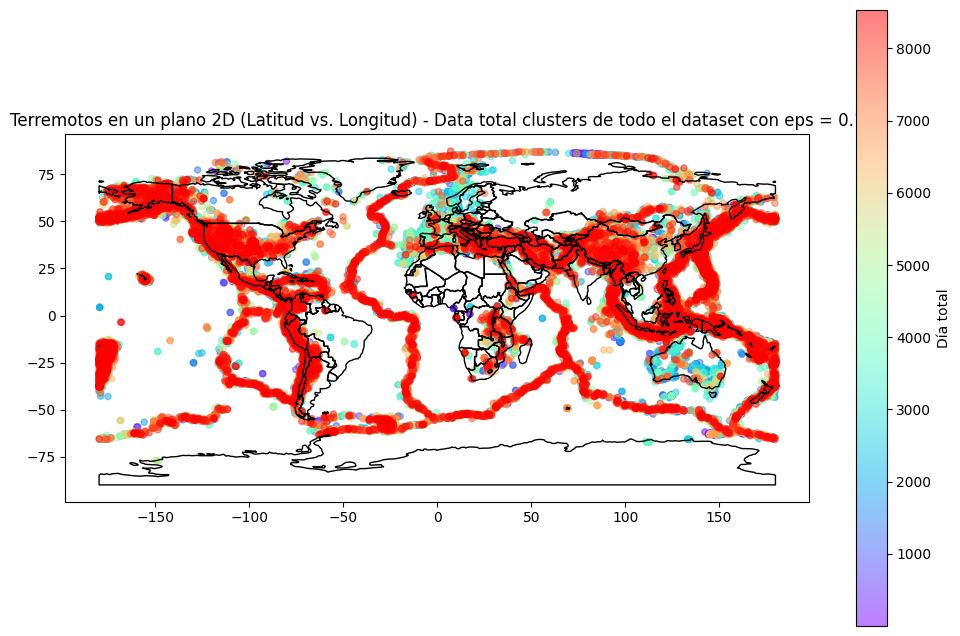

In [ ]:
graficar_clusters(df, mapa = 1, titulo='Data total clusters de todo el dataset con eps = 0.1')



---



---



---



Se ve claramente que usando el mismo eps que en el top_10 nuestro modelo generaliza demasiado. De lo contrario, cabría esperar una distribución más heterogénea de colores.

# Intento de minimizar Epsilon

**Esta parte se podría ignorar**, pues se pretende hallar una eps que minimice la cantidad de terremotos agrupados en df_top10 y df_top10_total, pero los resultados arrojados de la eps en este apartado NO son satisfactorios.



---



---

Creamos una función para minimizar las diferencias entre los clústers generados entre los dos métodos a fin de optimizar epsilon y min_samples



---



---



---



In [ ]:
def comparacion_eps(data1, data2, inicio, fin, paso):

  # Data1 es el dataset con epsilon "fijo" y Data2 es con el que compararemos para minimizar estos parámetros

  # Estandarizar
  scaler = StandardScaler()
  df_clustering_scaled = scaler.fit_transform(data2[['hora_total', 'c.x', 'c.y', 'c.z']])

  # Creamos la lista dist para comparar los valores (num_clusters, num_terremotos_padre_hijo) de data1, data2

  dist = []
  dist_dict = {}
  num_clusters_1 = len(set(list(data1['cluster'])))-1
  num_terremotos_padre_hijo_1 = num_clusters_1 + len( data1[data1['cluster'] == -1] )

  # Definir los límites y el paso de los valores que tomará eps
  inicio = inicio
  fin = fin
  paso = paso

  # Aplicar DBSCAN

  eps_value = list(np.arange(inicio, fin + paso, paso))
  min_samples_value = 2

  for eps in eps_value:

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")

        dbscan = DBSCAN(eps=eps, min_samples=min_samples_value)
        data2['cluster'] = dbscan.fit_predict(df_clustering_scaled)

        # Aquí es donde contaremos el número de clusters generados dentro del sub-dataset de data2 en el que cantidad_diaria > n

        data2_top = data2[data2['cantidad_diaria'] > 390]


        num_clusters_2 = len(set(list( data2_top['cluster'] )))-1
        num_terremotos_padre_hijo_2 = num_clusters_2 + len( data2_top[data2_top['cluster'] == -1] )

        dist.append( math.sqrt((num_clusters_2 - num_clusters_1)**2 + (num_terremotos_padre_hijo_2 - num_terremotos_padre_hijo_1)**2) )

        dist_dict[eps] = dist[-1]


  # Encuentra el valor de epsilon asociado al menor valor en el diccionario
  eps_min = min(dist_dict, key=dist_dict.get)

  print(f"El menor valor de eps_min es {eps_min}")
  print(f"Número de clusters usando la data total:{num_clusters_2}\tUsando la data TOP10\t{num_clusters_1}")
  print(f"Número padre-hijo usando la data total:\t{num_terremotos_padre_hijo_2}\tUsando la data TOP10\t{num_terremotos_padre_hijo_1}\n\n")


  # Representación gráfica
  plt.plot(list(dist_dict.keys()), list(dist_dict.values()), markersize=3, marker='o', linestyle='-', label='Distancia')
  plt.scatter([eps_min], [dist_dict[eps_min]], color='red', s=150, label=f'Menor valor: {eps_min}')

  # Línea vertical en el lugar del mínimo valor de epsilon
  plt.axvline(x=eps_min, color='red', linestyle='--')

  plt.xlabel('Epsilon')
  plt.ylabel('Distancia')
  plt.title('Distancia en función de Epsilon')
  plt.legend()
  plt.show()

  # Aplicamos el CLUSTER definitivo

  dbscan = DBSCAN(eps=eps_min, min_samples=min_samples_value)
  data2['cluster'] = dbscan.fit_predict(df_clustering_scaled)

  return data2

El menor valor de eps_min es 0.014999999999999987
Número de clusters usando la data total:166	Usando la data TOP10	83
Número padre-hijo usando la data total:	235	Usando la data TOP10	292




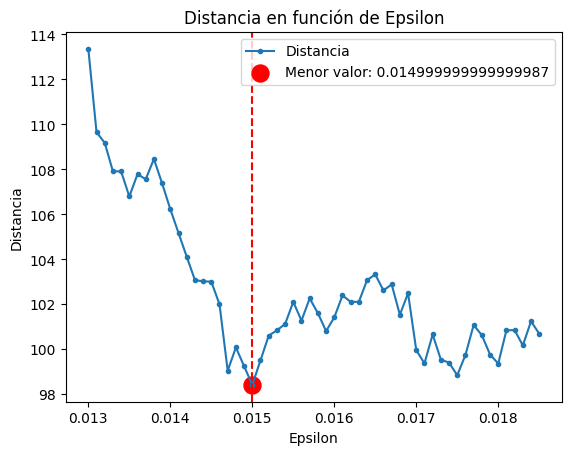

In [ ]:
df_definitivo = comparacion_eps(df_top10, df, 0.0130, 0.0185, 0.0001)

El menor valor de eps_min es 0.015
Número de clusters usando la data total:4	Usando la data TOP10	83
Número padre-hijo usando la data total:	5	Usando la data TOP10	292




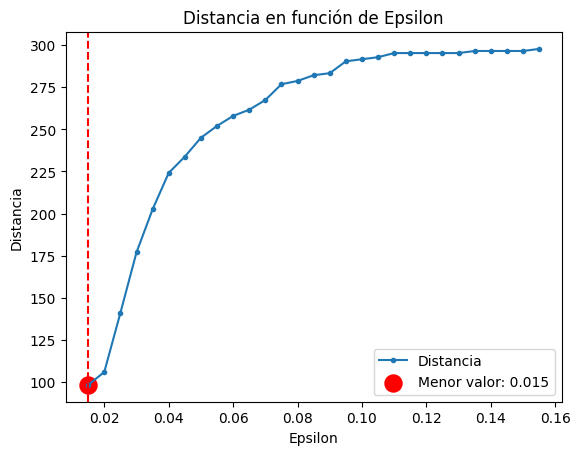

<ipython-input-27-2b881599436e>:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2['cluster'] = dbscan.fit_predict(df_clustering_scaled)


In [ ]:
df_definitivo_2 = comparacion_eps(df_top10, df, 0.015, 0.150, 0.005)

El menor valor de eps_min es 0.015
Número de clusters usando la data total:181	Usando la data TOP10	83
Número padre-hijo usando la data total:	283	Usando la data TOP10	292




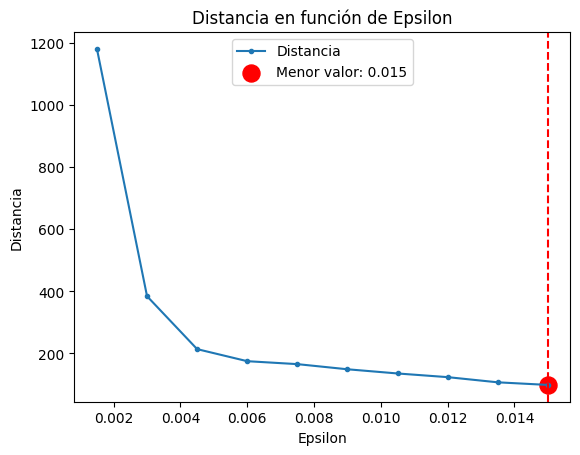

In [ ]:
df_definitivo_3 = comparacion_eps(df_top10, df, 0.0015, 0.0150, 0.0015)

In [ ]:
df_definitivo_top10 = df_definitivo[df_definitivo['cantidad_diaria'] > 390]

número total de clusters: 				 181
número total de terremotos padre + individuales:	 283
inicialmente teníamos un total de estos terremotos:	 6191 




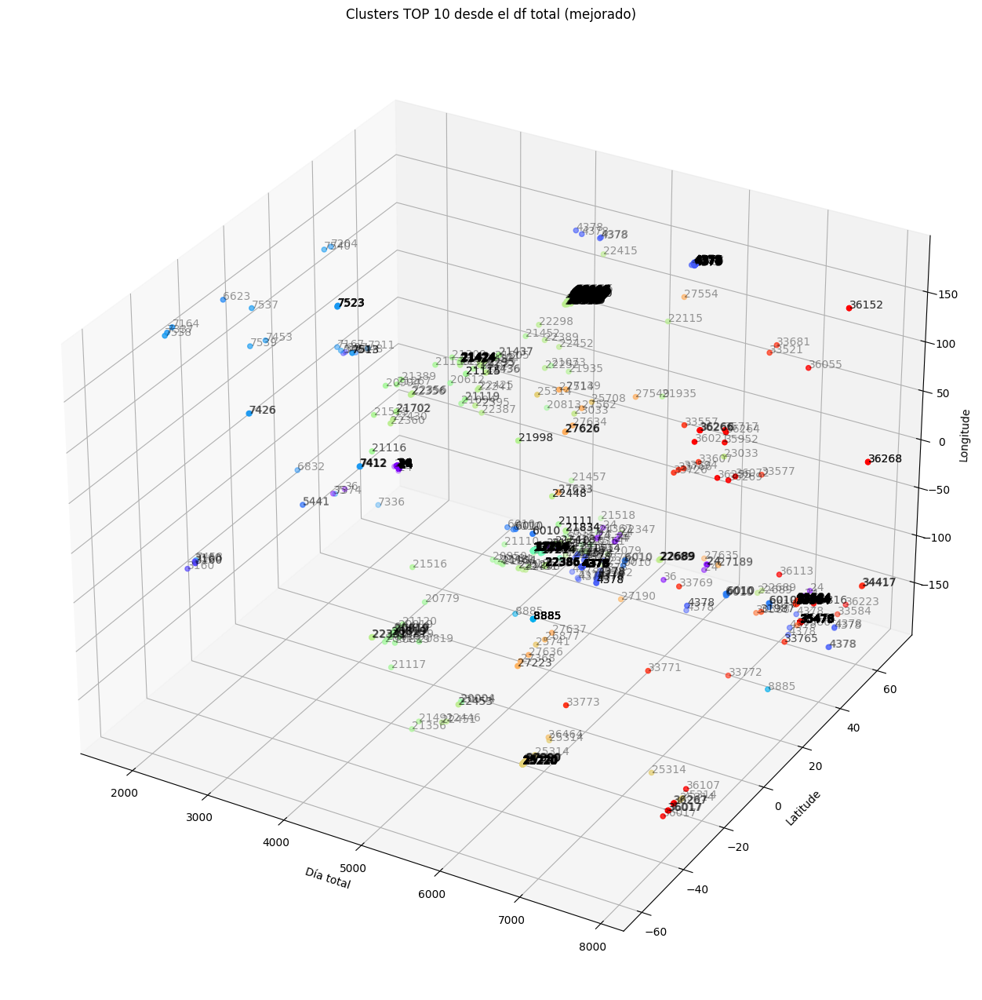

número total de clusters: 				 83
número total de terremotos padre + individuales:	 292
inicialmente teníamos un total de estos terremotos:	 6191 




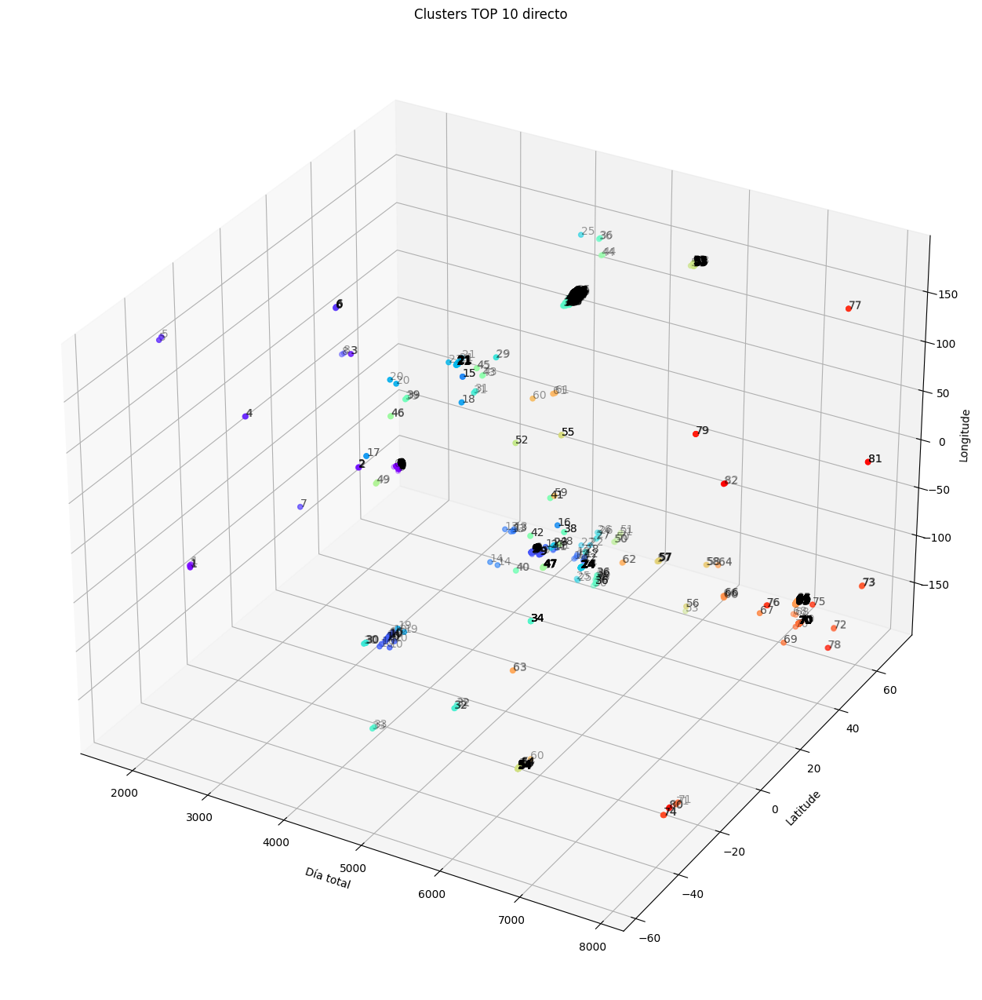

In [ ]:
# Graficamos df_top10_total

graficar_clusters(df_definitivo_top10, titulo = 'Clusters TOP 10 desde el df total (mejorado)', etiqueta=1)
graficar_clusters(df_top10, titulo = 'Clusters TOP 10 directo', etiqueta=1)

número total de clusters: 				 181
número total de terremotos padre + individuales:	 283
inicialmente teníamos un total de estos terremotos:	 6191 




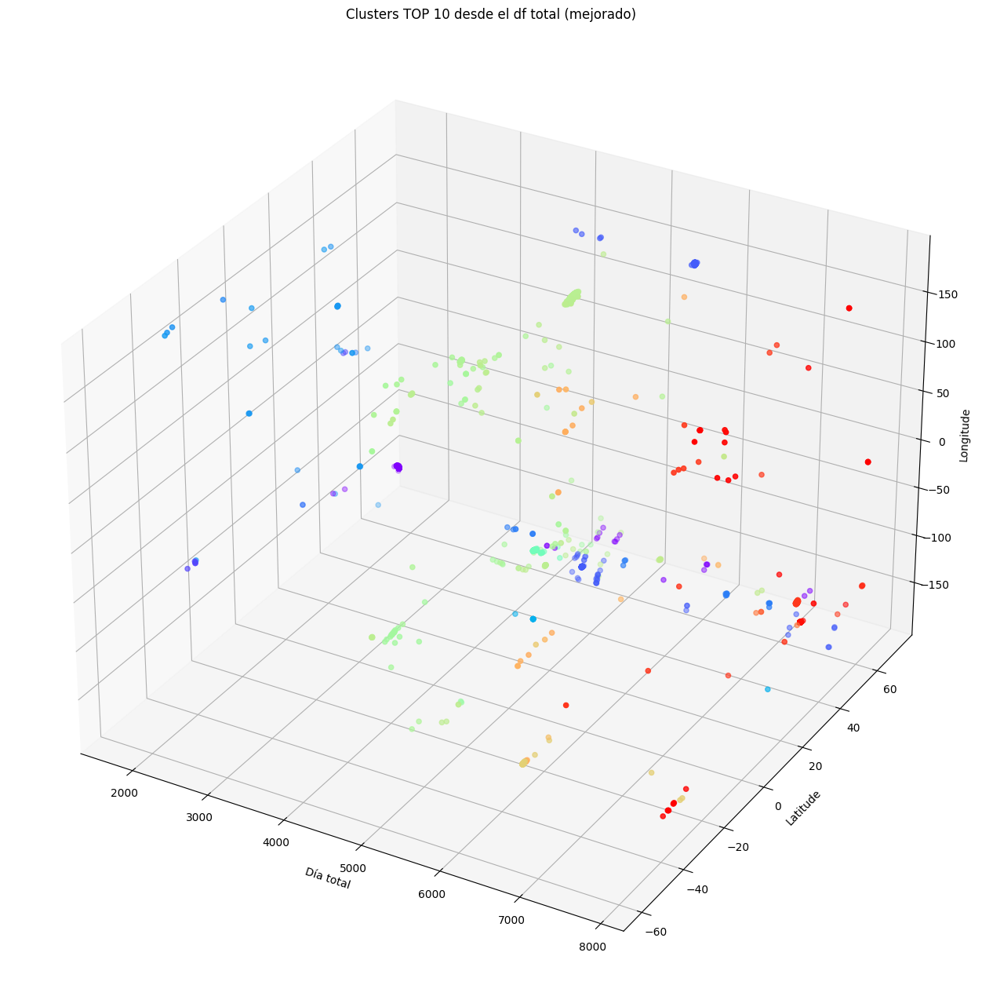

número total de clusters: 				 83
número total de terremotos padre + individuales:	 292
inicialmente teníamos un total de estos terremotos:	 6191 




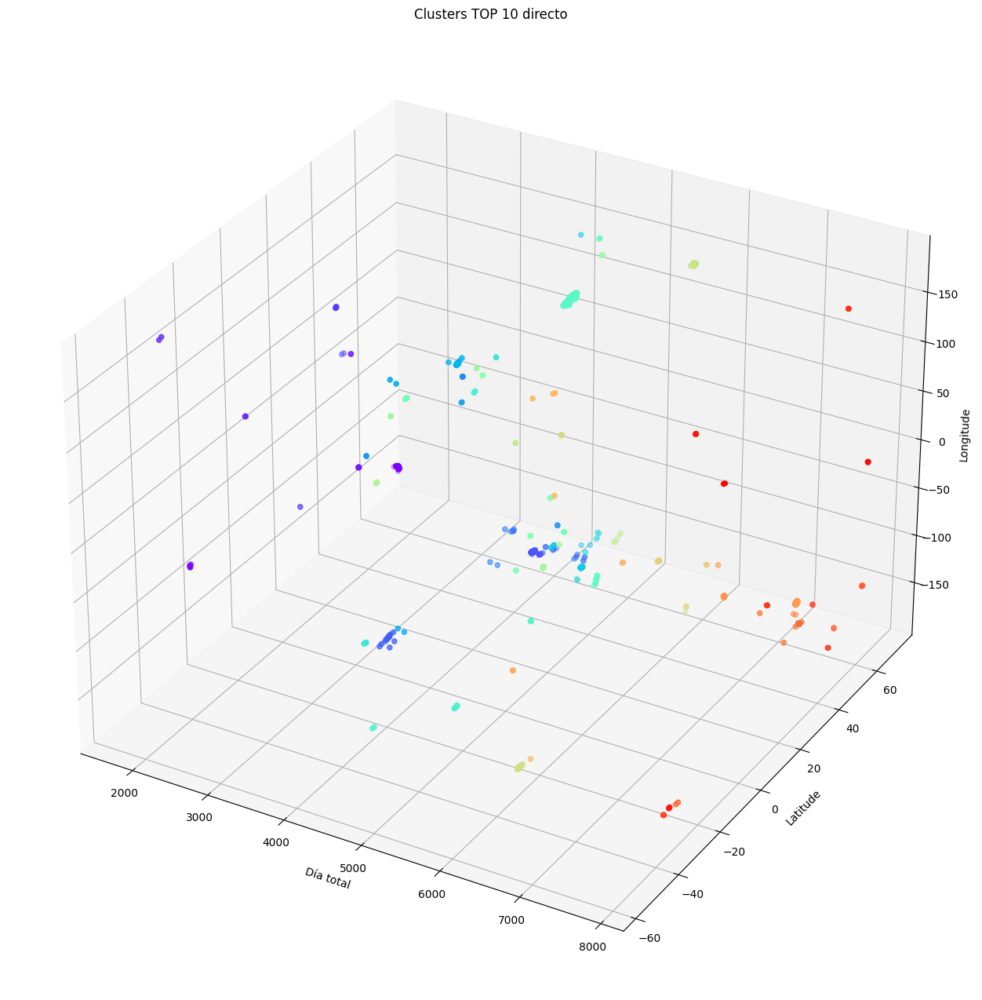

In [ ]:
# Graficamos df_top10_total

graficar_clusters(df_definitivo_top10, titulo = 'Clusters TOP 10 desde el df total (mejorado)')
graficar_clusters(df_top10, titulo = 'Clusters TOP 10 directo')

Guardamos la distribución de clusters con el eps hallado con nuestra función.

In [ ]:
# Vamos a guardar el dataframe definitivo con los clusters bien definidos

df_definitivo.to_excel(path+'/dataframes_preprocesados/terremotos_clusterizados_1.xlsx', index=False)



---

---



---



---





# Refinar valor de epsilon para el dataset total (método de comparación)

Como tenemos un montón de clústers y no podemos determinar fiablemnete el grado de comparación con tantos registros, usaremos un dataframe reducido con el TOP 10 de este dataframe total clusterizado a fin de compararlo con el dataframe clusterizado del TOP 10 terremotos.

- Es decir, antes habíamos seleccionado los 10 días con más terremotos y después agrupamos las réplicas en diferentes glústers (**df_top10**)

- Ahora hemos agrupado primero las réplicas del dataset total df y a continuación seleccionaremos los registros con los 10 días con más actividad sísmica, cuyos registros ya tienen información de los clústeres en los que se ha separado y lo llamaremos **df_top10_total**

Comparando las dos distribuciones tendremos una mejor idea del valor que debería tener eps cuanod aplicamos el DBSCAN sobre el dataframe total df.

In [1]:
# Seleccionar las variables para el clustering
df_clustering = df[['hora_total', 'c.x', 'c.y', 'c.z']]

# Estandarizar las variables numéricas para que tengan media 0 y desviación estándar 1
scaler = StandardScaler()
df_clustering_scaled = scaler.fit_transform(df_clustering)

# Aplicar DBSCAN
eps_value = 0.004  # Para tantear terreno
min_samples_value = 2

dbscan = DBSCAN(eps=eps_value, min_samples=min_samples_value)
df['cluster'] = dbscan.fit_predict(df_clustering_scaled)

NameError: ignored

Inspeccionamos rápidamente los registros y agrupación de df_top10 y de df_top10_total.

In [ ]:
df_top10_total = df[df['cantidad_diaria'] > 390]

In [ ]:
# Graficamos df con eps = 0.004

graficar_clusters(df, titulo = f'Todos los Clusters con eps = {eps_value}')

número total de clusters: 				 143
número total de terremotos padre + individuales:	 539
inicialmente teníamos un total de estos terremotos:	 6191 




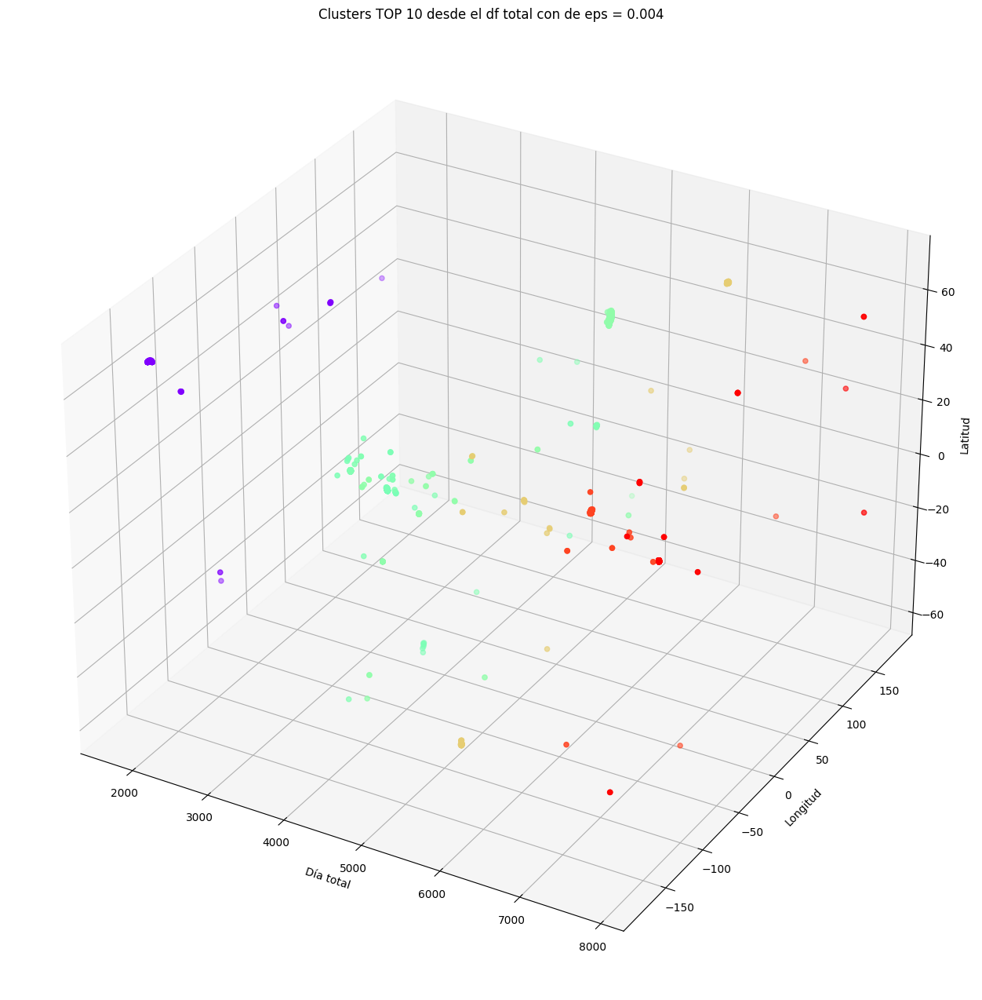

In [ ]:
# Graficamos df_top10_total

graficar_clusters(df_top10_total, titulo = f'Clusters TOP 10 desde el df total con de eps = {eps_value}')

número total de clusters: 				 83
número total de terremotos padre + individuales:	 292
inicialmente teníamos un total de estos terremotos:	 6191 




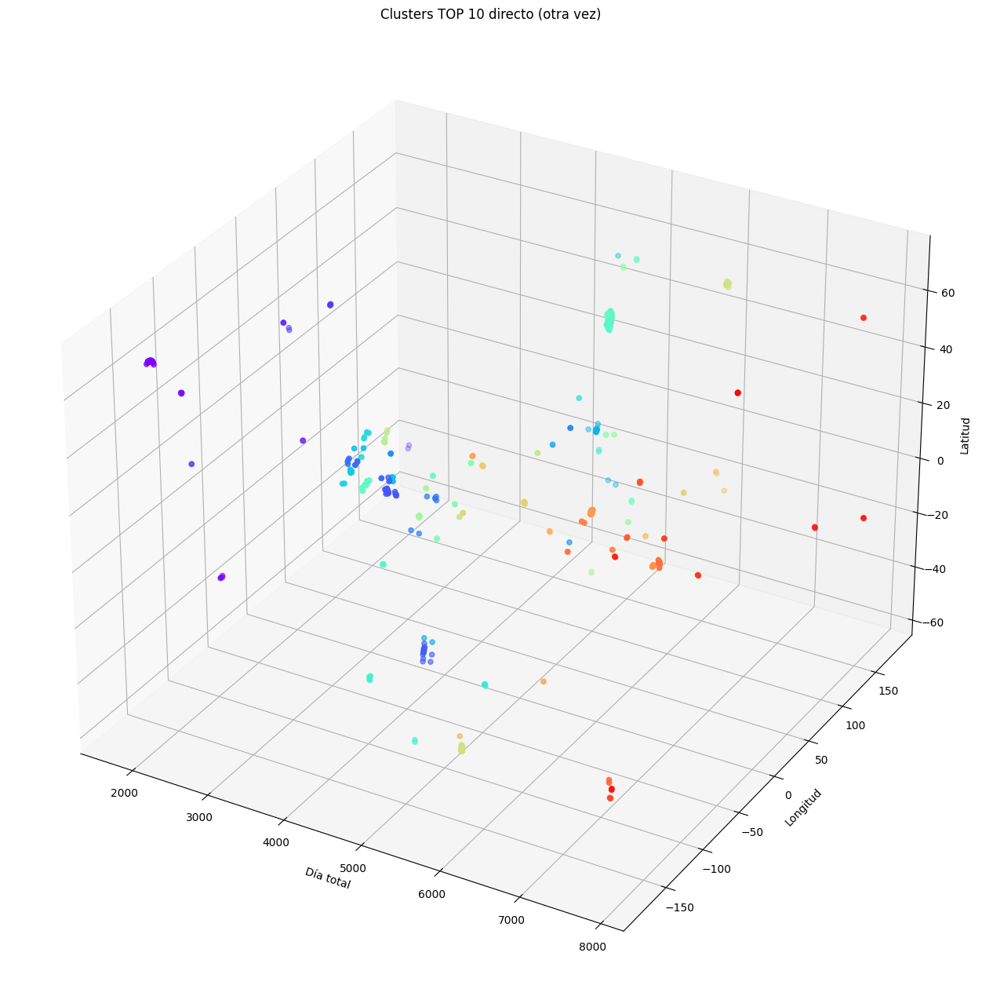

In [ ]:
# Graficamos df_top10 (ya hecho anteriormente)

graficar_clusters(df_top10, titulo = 'Clusters TOP 10 directo (otra vez)')

Más o menos son comparables ambas distribuciones, pero podemos mejorarlo.

# Intento de minimizar Epsilon (II) - K-Neighbors

**Esto es otra prueba más para crear el dataframe definitivo mediante comparación directa df_TOP10 y df_total_TOP10**

El que se creó con df_definitivo con eps = 0.015 parece generalizar demasiado. Por lo que haremos un K-Neighbors y a ver qué sale. Veremos que un valor óptimo es eps = 0.004



---



---



**APLICACIÓN K-NEIGHBORS**



---



In [ ]:
tracker.start()

[codecarbon WARNING @ 12:52:23] Already started tracking


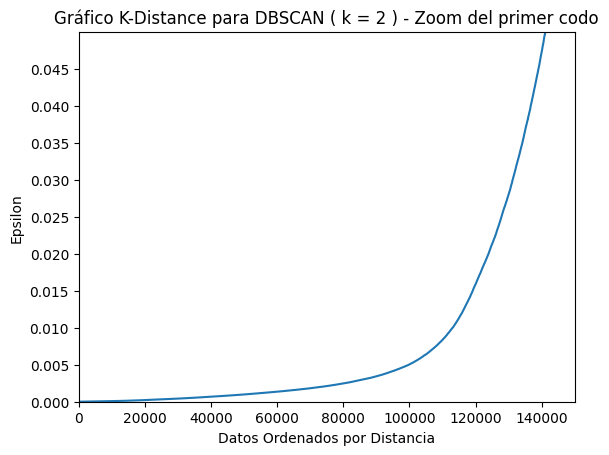

In [ ]:
# Selecciona las columnas relevantes para DBSCAN
X = df[['hora_total', 'c.x', 'c.y', 'c.z']]

# Calcula las distancias al k-ésimo vecino más cercano
k = 2
nbrs = NearestNeighbors(n_neighbors=k).fit(X)
distances, indices = nbrs.kneighbors(X)

# Ordena las distancias y selecciona la k-ésima distancia
k_distances = np.sort(distances[:, -1])

# Grafica la distancia del k-ésimo vecino más cercano en función del índice
plt.plot(np.arange(1, len(k_distances) + 1), k_distances)
plt.xlabel('Datos Ordenados por Distancia')
plt.ylabel(f'Epsilon')

plt.ylim(0, 0.05)
plt.xlim(0, 150000)

y_ticks = np.arange(0, 0.05, 0.005)
plt.yticks(y_ticks)

plt.title(f'Gráfico K-Distance para DBSCAN ( k = 2 ) - Zoom del primer codo')
plt.savefig(path + '/imagenes/grafico_k_distance_zoom.png')
plt.show()

In [55]:
# Seleccionar las variables para el clustering
df_clustering = df[['hora_total', 'c.x', 'c.y', 'c.z']]

# Estandarizar las variables numéricas para que tengan media 0 y desviación estándar 1
scaler = StandardScaler()
df_clustering_scaled = scaler.fit_transform(df_clustering)

# Aplicar DBSCAN
eps_value = 0.004  # Para tantear terreno
min_samples_value = 2

dbscan = DBSCAN(eps=eps_value, min_samples=min_samples_value)
df['cluster'] = dbscan.fit_predict(df_clustering_scaled)

In [56]:

df_top10_prueba = df[df['cantidad_diaria'] > 390]

número total de clusters: 				 143
número total de terremotos padre + individuales:	 539
inicialmente teníamos un total de estos terremotos:	 6191 




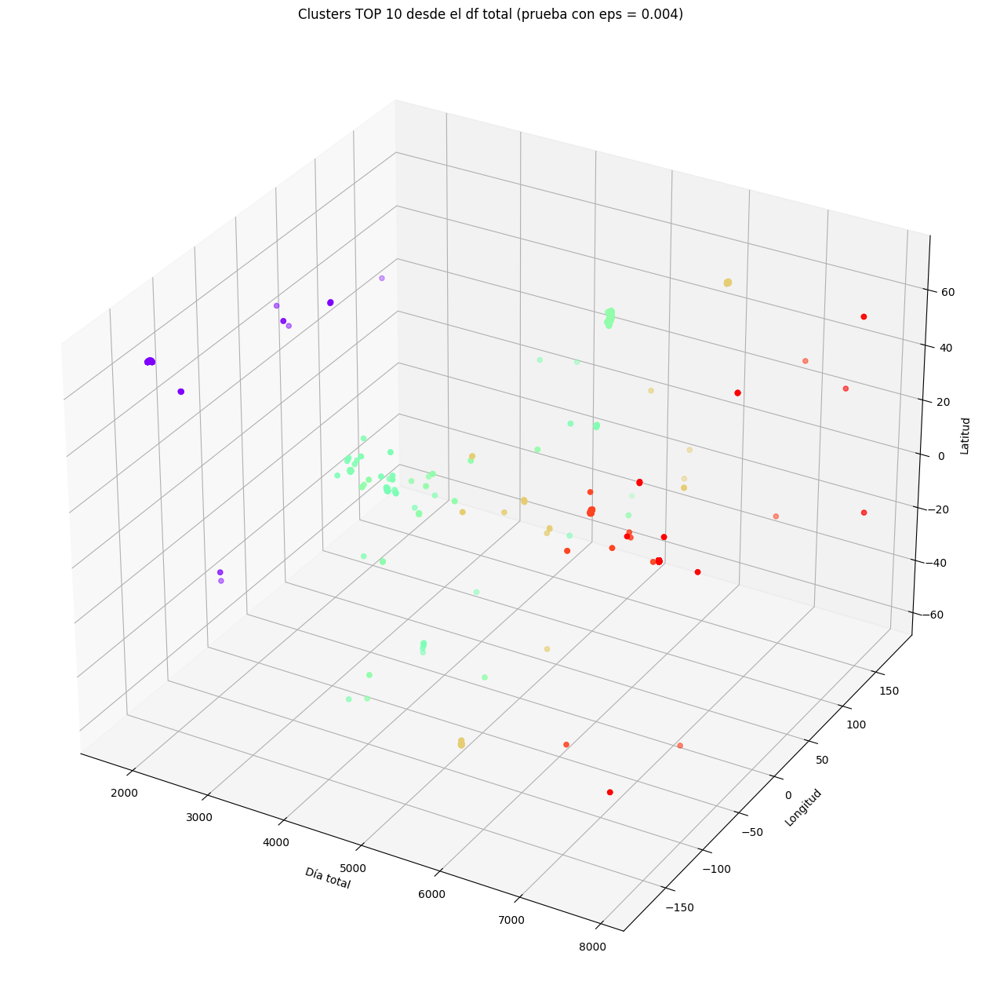

número total de clusters: 				 83
número total de terremotos padre + individuales:	 292
inicialmente teníamos un total de estos terremotos:	 6191 




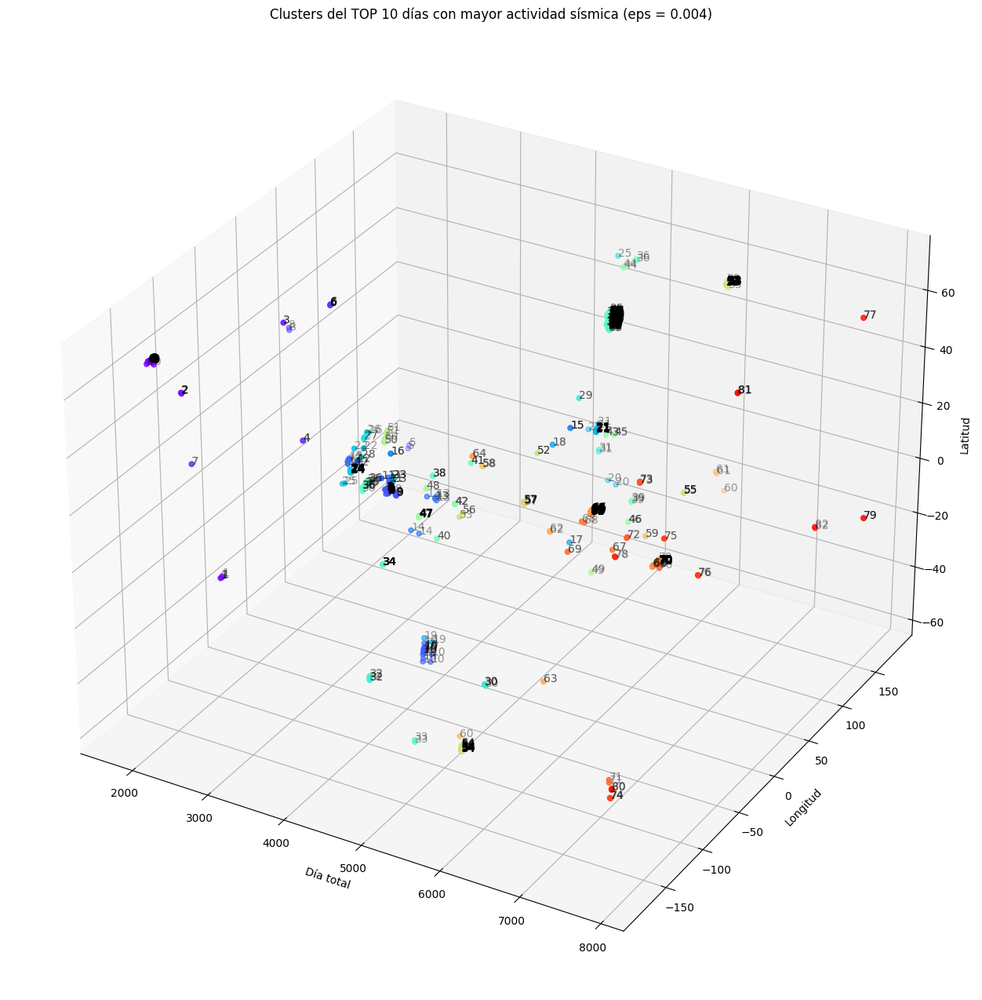

In [57]:
# Graficamos df_top10_total

graficar_clusters(df_top10_prueba, titulo = f'Clusters TOP 10 desde el df total (prueba con eps = {eps_value})', etiqueta=0)
graficar_clusters(df_top10, titulo = 'Clusters del TOP 10 días con mayor actividad sísmica (eps = 0.004)', etiqueta=1)

número total de clusters: 				 143
número total de terremotos padre + individuales:	 539
inicialmente teníamos un total de estos terremotos:	 6191 




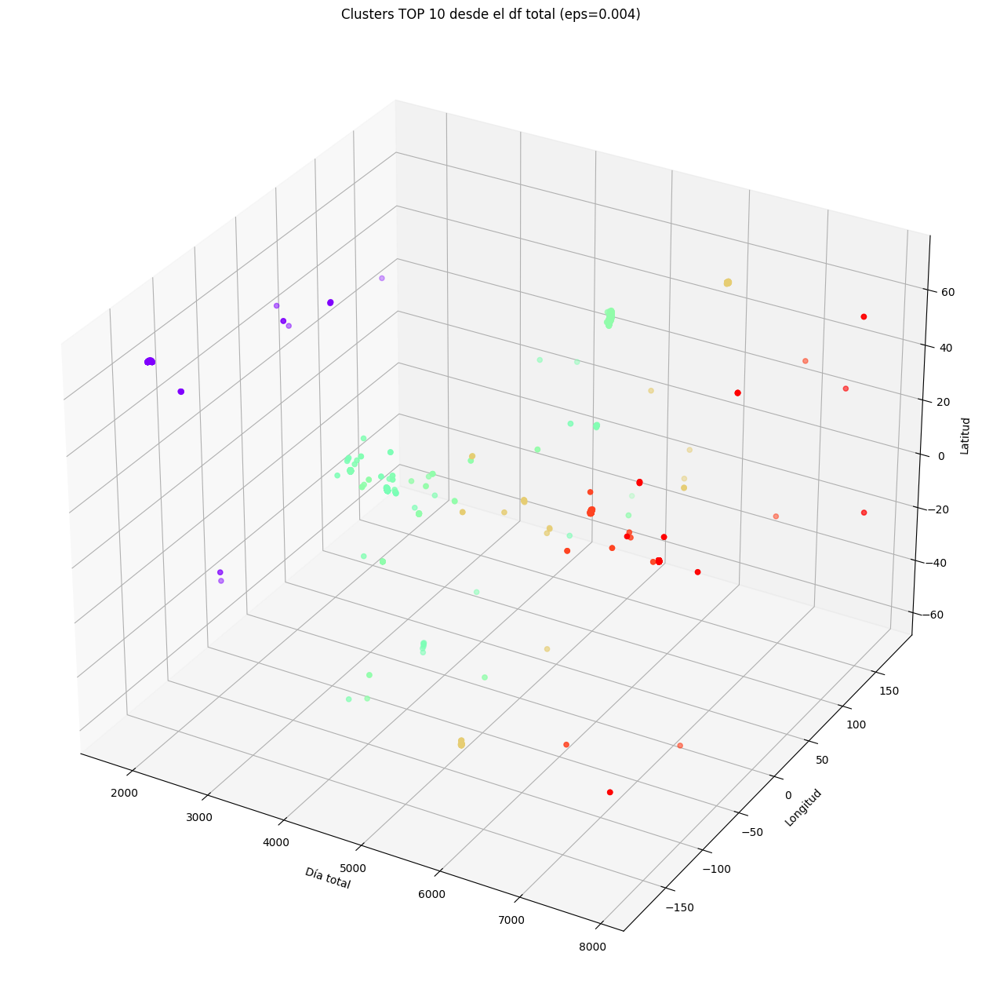

número total de clusters: 				 83
número total de terremotos padre + individuales:	 292
inicialmente teníamos un total de estos terremotos:	 6191 




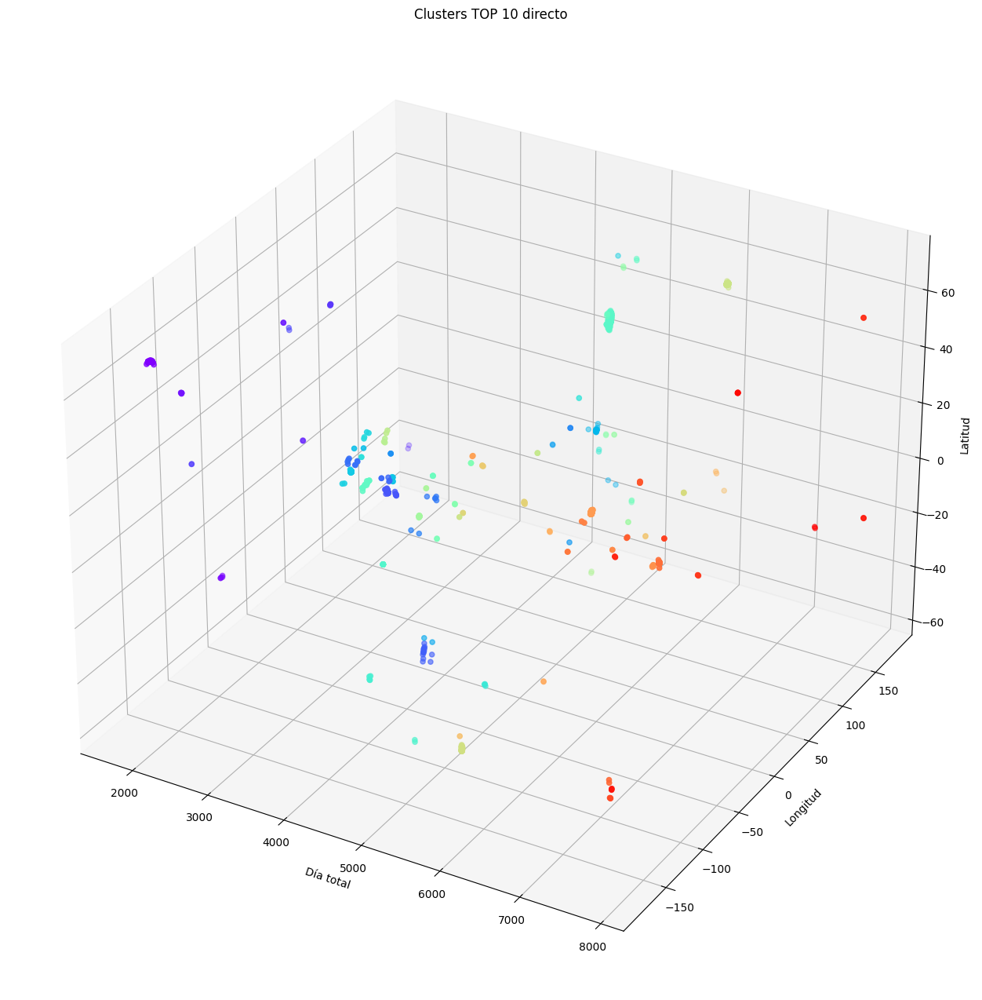

In [ ]:
# Graficamos df_top10_total

graficar_clusters(df_top10_prueba, titulo = f'Clusters TOP 10 desde el df total (eps={eps_value})')
graficar_clusters(df_top10, titulo = 'Clusters TOP 10 directo')

Ahora hay más semejanza entre top_10 y top_10_total. Como veremos más adelante, un valor de eps = 0.0004 arroja mejores resultados.

In [ ]:
# Vamos a guardar el dataframe definitivo final habiendo tanteado que eps = 0.0004 con los clusters bien definidos

print(eps_value)

df.to_excel(path+'/dataframes_preprocesados/terremotos_clusterizados_9.xlsx', index=False)

0.004




---



---



---



# CHECKPOINT - cogiendo df clusterizado con eps = 0.004

Ya hemos clusterizado correctamente los terremotos de todo el dataframe original y lo hemos guardado como terremotos_clusterizados_1.xlsx habiendo usado que eps = 0.015

Después, hemos creado otro llamado terremotos_clusterizados_9.xlsx habiendo usado que eps = 0.004.

A continuación, trabajaremos con el segundo (eps = 0.004) y lo reduciremos para que en el dataset final de terremotos solo haya un registro por hora referido a la **cantidad total de terremotos padre** que ocurre en ese instante. Posteriormente haremos subsets para indicar la cantidad total de terremotos que hay cada hora dados distintos filtros (coordenadas, magnitud, profundidad).

**Análisis del dataframe definitivo**

In [ ]:
# Ruta de la carpeta actual en Google Drive
path = '/content/drive/My Drive/Master ciencia de datos (Big Data & TFM)/TFM - tormentas solares/bases de datos - nuevo'

# Ruta al archivo CSV en Google Drive
file_path = path + '/dataframes_preprocesados/terremotos_clusterizados_9.xlsx'

# Carga los datos en un DataFrame
df_agrupado = pd.read_excel(file_path)

# Muestra las primeras filas del DataFrame
df_agrupado.head()

,time.1,dia_total,dia_anual,hora,hora_total,latitude,longitude,depth,mag,magType,mag_common,place,cantidad_diaria,c.x,c.y,c.z,cluster
0,1998-01-23,1,23,1,1,40.352,29.269,10.0,2.5,md,4.675,"10 km SE of Umurbey, Turkey",56,0.664789,0.372589,0.647482,-1
1,1998-01-23,1,23,2,2,51.296,-178.152,33.0,4.9,mb,6.022,"123 km WSW of Adak, Alaska",56,-0.624972,-0.020165,0.780387,-1
2,1998-01-23,1,23,2,2,-25.072,70.007,10.0,4.1,mb,5.238,Mid-Indian Ridge,56,0.309690,0.851189,-0.423757,-1
3,1998-01-23,1,23,4,4,44.344,149.791,33.0,3.7,mb,4.846,"180 km ESE of Kuril’sk, Russia",56,-0.618035,0.359835,0.698965,-1
4,1998-01-23,1,23,5,5,14.484,146.986,33.0,4.1,mb,5.238,"155 km ESE of Saipan, Northern Mariana Islands",56,-0.811887,0.527527,0.250110,-1


In [ ]:
##############################################################################################################
## Nos va a interesar también el minuto y la hora. O bien cogemos time2 o bien nos quedamos con el primer   ##
## registro de df_agrupado de cada clúster, ya que estaban ordenados temporalmente según hora-miuto-segundo ##
##############################################################################################################

número total de clusters: 				 42607
número total de terremotos padre + individuales:	 378069
inicialmente teníamos un total de estos terremotos:	 587838 




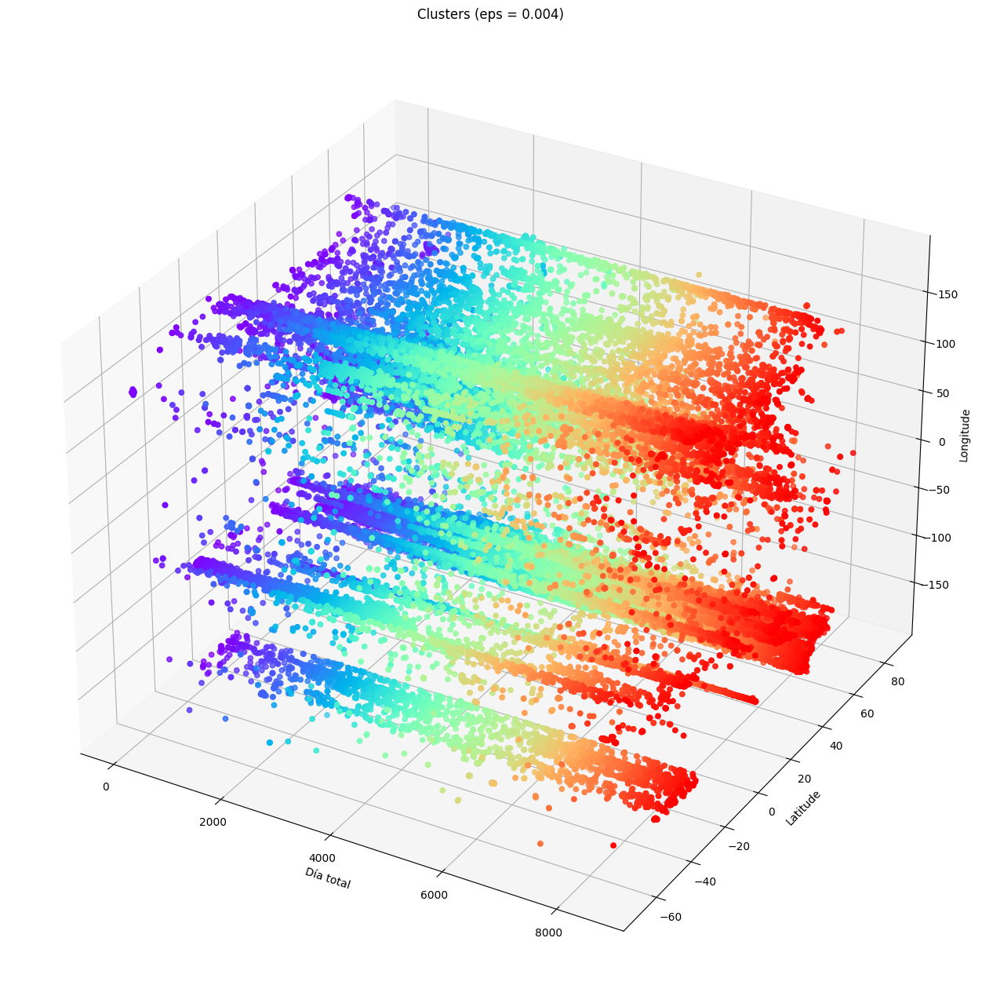

In [ ]:
# Graficamos df_agrupado

eps_value = 0.004

graficar_clusters(df_agrupado, titulo = f'Clusters (eps = {eps_value})')

Vemos una distribución más heterogénea de agrupaciones. Tengamos en cuenta que los terremotos individuales no se han graficado.

# Comprobación de la Clusterización

Analizaremos si tiene sentido nuestra agrupación.

Vemos cuántos clústers tenemos (42607) y jugamos un poco con ellos para ver que lo obtenido tiene sentido.

In [ ]:
clusters = sorted(list(set(df_agrupado["cluster"])))
print(clusters)
print(len(clusters))
print(min(clusters), max(clusters))

[-1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 

In [ ]:
# Creamos nueva columna para mag_mean, depth_mean, cantidad_cluster

df_agrupado = df_agrupado.drop(['depth_mean', 'mag_mean', 'cantidad_cluster'], axis=1, errors='ignore')

# Creacion de depth_mean

df_agrupado.insert(df_agrupado.columns.get_loc('depth') + 1, 'depth_mean', df_agrupado.groupby('cluster')['depth'].transform('mean'))
df_agrupado.loc[df_agrupado['cluster'] == -1, 'depth_mean'] = df_agrupado.loc[df_agrupado['cluster'] == -1, 'depth']

# Creacion de mag_common

df_agrupado.insert(df_agrupado.columns.get_loc('mag_common') + 1, 'mag_mean', df_agrupado.groupby('cluster')['mag_common'].transform('mean'))
df_agrupado.loc[df_agrupado['cluster'] == -1, 'mag_mean'] = df_agrupado.loc[df_agrupado['cluster'] == -1, 'mag_common']

# Creacion cantidad_cluster

df_agrupado.insert(df_agrupado.columns.get_loc('cantidad_diaria'), 'cantidad_cluster', df_agrupado.groupby('cluster')['cluster'].transform('count'))
df_agrupado.loc[df_agrupado['cluster'] == -1, 'cantidad_cluster'] = 1

df_agrupado.head(500)

,time.1,dia_total,dia_anual,hora,hora_total,latitude,longitude,depth,depth_mean,mag,magType,mag_common,mag_mean,place,cantidad_cluster,cantidad_diaria,c.x,c.y,c.z,cluster
0,1998-01-23,1,23,1,1,40.352,29.269,10.0,10.0,2.5,md,4.675,4.675,"10 km SE of Umurbey, Turkey",1,56,0.664789,0.372589,0.647482,-1
1,1998-01-23,1,23,2,2,51.296,-178.152,33.0,33.0,4.9,mb,6.022,6.022,"123 km WSW of Adak, Alaska",1,56,-0.624972,-0.020165,0.780387,-1
2,1998-01-23,1,23,2,2,-25.072,70.007,10.0,10.0,4.1,mb,5.238,5.238,Mid-Indian Ridge,1,56,0.309690,0.851189,-0.423757,-1
3,1998-01-23,1,23,4,4,44.344,149.791,33.0,33.0,3.7,mb,4.846,4.846,"180 km ESE of Kuril’sk, Russia",1,56,-0.618035,0.359835,0.698965,-1
4,1998-01-23,1,23,5,5,14.484,146.986,33.0,33.0,4.1,mb,5.238,5.238,"155 km ESE of Saipan, Northern Mariana Islands",1,56,-0.811887,0.527527,0.250110,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,1998-01-31,9,31,23,215,-11.487,165.574,33.0,33.0,4.0,mb,5.140,5.336,"87 km SSW of Lata, Solomon Islands",2,42,-0.949072,0.244139,-0.199146,42
496,1998-02-01,10,32,0,216,-35.763,-97.058,10.0,10.0,6.0,mwc,6.000,6.000,West Chile Rise,1,48,-0.099705,-0.805293,-0.584434,-1
497,1998-02-01,10,32,0,216,15.959,-99.404,20.0,20.0,3.6,mb,4.748,4.748,84 km SSE of San Andrés Playa Encantada (El Po...,1,48,-0.157097,-0.948537,0.274949,-1
498,1998-02-01,10,32,1,217,-6.450,130.085,133.5,133.5,3.8,mb,4.944,4.944,Banda Sea,1,48,-0.639847,0.760247,-0.112336,-1


In [ ]:
df_agrupado[ (df_agrupado["cantidad_cluster"] > 1) & (df_agrupado["cantidad_cluster"] < 433000)  ]

,time.1,dia_total,dia_anual,hora,hora_total,latitude,longitude,depth,depth_mean,mag,magType,mag_common,mag_mean,place,c.x,c.y,c.z,cluster,cantidad_cluster,cantidad_diaria
6,1998-01-23,1,23,6,6,-31.885000,-71.973000,22.300,24.600000,4.00,md,5.6800,5.713500,"81 km WSW of Illapel, Chile",0.262770,-0.807428,-0.528216,0,2,56
7,1998-01-23,1,23,6,6,-31.890000,-71.955000,26.900,24.600000,4.10,md,5.7470,5.713500,"79 km WSW of Illapel, Chile",0.263009,-0.807301,-0.528290,0,2,56
9,1998-01-23,1,23,6,6,19.418667,-155.273167,9.743,6.835888,2.70,md,4.8090,4.972312,"4 km WSW of Volcano, Hawaii",-0.856642,-0.394498,0.332468,1,80,56
15,1998-01-23,1,23,10,10,52.379000,-168.643000,33.000,33.000000,5.90,mwc,5.9000,5.602286,"64 km SSE of Nikolski, Alaska",-0.598483,-0.120208,0.792066,2,14,56
16,1998-01-23,1,23,10,10,52.308000,-168.668000,33.000,33.000000,5.20,mb,6.3160,5.602286,"71 km S of Nikolski, Alaska",-0.599497,-0.120140,0.791309,2,14,56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
650438,2023-09-30,9382,273,11,225155,18.008667,-66.749167,14.810,10.362372,2.84,md,4.9028,4.767350,"2 km ESE of Magas Arriba, Puerto Rico",0.375418,-0.873774,0.309161,40344,8927,54
650447,2023-09-30,9382,273,16,225160,38.304667,-119.367833,5.850,6.375000,2.69,md,4.8023,4.785550,"13 km WNW of Bridgeport, CA",-0.384841,-0.683880,0.619843,48106,2,54
650451,2023-09-30,9382,273,19,225163,40.501000,-124.438500,29.090,29.355000,4.22,mw,4.2200,4.494400,"17 km WSW of Ferndale, CA",-0.430019,-0.627123,0.649461,48108,2,54
650452,2023-09-30,9382,273,19,225163,40.507667,-124.443000,29.620,29.355000,2.64,md,4.7688,4.494400,"17 km WSW of Ferndale, CA",-0.430026,-0.627027,0.649550,48108,2,54


Para comprobar la validez de nuestras suposiciones, veremos las secuencias de terremotos más largas que han existido en nuestro rango de tiempo.

In [ ]:
# Por curiosidad, vemos la secuencia de terremotos más larga que hubo

mas_terremotos_clusterizados = sorted(list(set(df_agrupado["cantidad_cluster"])))[-1]
cluster_mas_cantidad = list(df_agrupado[ df_agrupado["cantidad_cluster"]==sorted(list(set(df_agrupado["cantidad_cluster"])))[-1] ]["cluster"])[0]


print(mas_terremotos_clusterizados)
print(cluster_mas_cantidad)

7214
36772


In [ ]:
df_agrupado[df_agrupado["cluster"]==cluster_mas_cantidad]

,time.1,dia_total,dia_anual,hora,hora_total,latitude,longitude,depth,depth_mean,mag,magType,mag_common,mag_mean,place,cantidad_cluster,cantidad_diaria,c.x,c.y,c.z,cluster
490861,2018-04-12,7385,102,5,177221,19.382900,-155.255600,15.39,1.118242,2.60,ml,3.27,3.551198,"7 km SSW of Volcano, Hawaii",7214,71,-0.856710,-0.394847,0.331880,36772
491109,2018-04-15,7388,105,19,177307,19.389167,-155.246167,1.44,1.118242,2.67,ml,3.34,3.551198,"6 km SSW of Volcano, Hawaii",7214,59,-0.856612,-0.394973,0.331983,36772
491189,2018-04-16,7389,106,20,177332,19.390000,-155.277333,1.47,1.118242,2.61,ml,3.28,3.551198,"7 km SW of Volcano, Hawaii",7214,77,-0.856822,-0.394505,0.331997,36772
491496,2018-04-21,7394,111,16,177448,19.383833,-155.240833,1.90,1.118242,2.68,ml,3.35,3.551198,"6 km S of Volcano, Hawaii",7214,57,-0.856603,-0.395066,0.331895,36772
491531,2018-04-22,7395,112,6,177462,19.385833,-155.244167,1.43,1.118242,2.57,ml,3.24,3.551198,"6 km S of Volcano, Hawaii",7214,63,-0.856616,-0.395011,0.331928,36772
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
507604,2018-08-24,7519,236,16,180448,19.327833,-155.193333,7.06,1.118242,2.70,ml,3.37,3.551198,"13 km SSE of Volcano, Hawaii",7214,90,-0.856569,-0.395912,0.330973,36772
507680,2018-08-25,7520,237,20,180476,19.345000,-155.182333,6.28,1.118242,2.89,ml,3.56,3.551198,"12 km SSE of Volcano, Hawaii",7214,73,-0.856403,-0.396034,0.331256,36772
507706,2018-08-26,7521,238,0,180480,19.328167,-155.142333,5.91,1.118242,3.14,ml,3.81,3.551198,"15 km S of Fern Forest, Hawaii",7214,106,-0.856215,-0.396673,0.330978,36772
507744,2018-08-26,7521,238,9,180489,19.354167,-155.127833,7.07,1.118242,2.72,ml,3.39,3.551198,"12 km S of Fern Forest, Hawaii",7214,106,-0.855978,-0.396826,0.331407,36772


La secuencia de terremotos más intensa detectada hasta 2021 es en Hawaii desde el 12-04-2018 hasta el 26-08-2018 con 7214 registros

In [ ]:
# Por curiosidad, vemos la secuencia de terremotos de la segunda más larga que hubo

mas_terremotos_clusterizados = sorted(list(set(df_agrupado["cantidad_cluster"])))[-2]
cluster_mas_cantidad = list(df_agrupado[ df_agrupado["cantidad_cluster"]==sorted(list(set(df_agrupado["cantidad_cluster"])))[-2] ]["cluster"])[0]


print(mas_terremotos_clusterizados)
print(cluster_mas_cantidad)

6784
39892


In [ ]:
df_agrupado[df_agrupado["cluster"]==cluster_mas_cantidad]

,time.1,dia_total,dia_anual,hora,hora_total,latitude,longitude,depth,depth_mean,mag,magType,mag_common,mag_mean,place,cantidad_cluster,cantidad_diaria,c.x,c.y,c.z,cluster
542384,2019-12-09,7991,343,14,191774,17.9078,-66.5930,11.0,9.880156,2.66,md,4.7822,4.736111,"11 km SSE of Ponce, Puerto Rico",6784,76,0.378014,-0.873246,0.307486,39892
542447,2019-12-10,7992,344,9,191793,17.9053,-66.5805,12.0,9.880156,2.57,md,4.7219,4.736111,"12 km SSE of Ponce, Puerto Rico",6784,67,0.378210,-0.873175,0.307445,39892
542674,2019-12-14,7996,348,4,191884,17.9038,-66.5898,7.0,9.880156,2.95,md,4.9765,4.736111,"12 km SSE of Ponce, Puerto Rico",6784,52,0.378071,-0.873244,0.307420,39892
543128,2019-12-18,8000,352,22,191998,17.8996,-66.5806,8.0,9.880156,2.91,md,4.9497,4.736111,"13 km SSE of Ponce, Puerto Rico",6784,77,0.378220,-0.873204,0.307350,39892
543135,2019-12-19,8001,353,0,192000,17.9081,-66.5885,11.0,9.880156,2.50,md,4.6750,4.736111,"11 km SSE of Ponce, Puerto Rico",6784,85,0.378082,-0.873214,0.307491,39892
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
587718,2021-06-01,8531,152,1,204721,18.0051,-67.0625,6.0,9.880156,3.42,md,5.2914,4.736111,"3 km NNW of La Parguera, Puerto Rico",6784,61,0.370641,-0.875832,0.309102,39892
587758,2021-06-01,8531,152,18,204738,17.9210,-66.8645,12.0,9.880156,2.87,md,4.9229,4.736111,"6 km SSE of Maria Antonia, Puerto Rico",6784,61,0.373844,-0.874962,0.307705,39892
587765,2021-06-01,8531,152,20,204740,17.9771,-66.9588,8.0,9.880156,2.89,md,4.9363,4.736111,"4 km WSW of Fuig, Puerto Rico",6784,61,0.372285,-0.875298,0.308637,39892
587775,2021-06-02,8532,153,0,204744,17.9598,-67.0010,7.0,9.880156,3.00,md,5.0100,4.736111,"5 km ESE of La Parguera, Puerto Rico",6784,63,0.371677,-0.875658,0.308350,39892


La segunda secuencia más larga de terremotos detectados es en Puerto Rico desde el 09-12-2019 hasta el 02-06-2021 con un total de 6784 registros (sabemos que hasta 2023 este número podría haber aumentado)

# Quitamos réplicas y Creación Dataset

***FILTRAMOS QUITANDO REPLICAS***

In [ ]:
# AGRUPAMOS

# Filtrar los registros donde 'cluster' no es -1
df_filtrado = df_agrupado[df_agrupado['cluster'] != -1]

# Conservar el primer registro de cada clúster (excepto -1) mientras se mantiene el orden original
df_nuevo = df_filtrado.drop_duplicates(subset='cluster', keep='first').reset_index(drop=True)

# Filtrar los registros donde 'cluster' es -1 y mantener el orden original
df_cluster_negativo = df_agrupado[df_agrupado['cluster'] == -1]

# Concatenar ambos DataFrames
df_filtrado = pd.concat([df_nuevo, df_cluster_negativo])

# Ordenar df_filtrado según los valores de 'hora_actual'
df_filtrado = df_filtrado.sort_values(by='hora_total')


In [ ]:
df_nuevo

,time.1,dia_total,dia_anual,hora,hora_total,latitude,longitude,depth,depth_mean,mag,magType,mag_common,mag_mean,place,cantidad_cluster,cantidad_diaria,c.x,c.y,c.z,cluster
0,1998-01-23,1,23,6,6,-31.885000,-71.973000,22.300000,24.600000,4.00,md,5.6800,5.713500,"81 km WSW of Illapel, Chile",2,56,0.262770,-0.807428,-0.528216,0
1,1998-01-23,1,23,6,6,19.418667,-155.273167,9.743000,6.754595,2.70,md,4.8090,4.973784,"4 km WSW of Volcano, Hawaii",74,56,-0.856642,-0.394498,0.332468,1
2,1998-01-23,1,23,10,10,52.379000,-168.643000,33.000000,33.000000,5.90,mwc,5.9000,5.602286,"64 km SSE of Nikolski, Alaska",14,56,-0.598483,-0.120208,0.792066,2
3,1998-01-23,1,23,13,13,33.802000,-117.810000,8.946000,9.221000,2.90,ml,3.5700,3.590000,"1km SSE of Villa Park, California",2,56,-0.387679,-0.734988,0.556325,3
4,1998-01-23,1,23,14,14,-31.144000,-71.610000,27.700000,35.200000,4.00,md,5.6800,5.696750,"68 km NW of Illapel, Chile",4,56,0.270013,-0.812162,-0.517191,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42602,2021-05-31,8530,151,16,204712,31.727056,-104.571508,6.157275,6.105859,2.80,ml,3.4700,3.570000,"53 km SSW of Whites City, New Mexico",2,85,-0.213991,-0.823204,0.525873,42602
42603,2021-06-01,8531,152,22,204742,44.301300,-114.792000,10.000000,10.000000,3.00,ml,3.6700,3.470000,"14 km NE of Stanley, Idaho",2,61,-0.300101,-0.649717,0.698432,42603
42604,2021-06-01,8531,152,23,204743,33.459667,-116.891667,12.830000,13.235000,3.16,ml,3.8300,3.620000,"3km NW of Aguanga, CA",2,61,-0.377346,-0.744059,0.551350,42604
42605,2021-06-02,8532,153,6,204750,18.867833,-155.235833,9.890000,17.570000,2.51,md,4.6817,4.023900,"42 km ESE of Naalehu, Hawaii",3,63,-0.859248,-0.396376,0.323386,42605


In [ ]:
df_filtrado

,time.1,dia_total,dia_anual,hora,hora_total,latitude,longitude,depth,depth_mean,mag,magType,mag_common,mag_mean,place,cantidad_cluster,cantidad_diaria,c.x,c.y,c.z,cluster
0,1998-01-23,1,23,1,1,40.3520,29.2690,10.0,10.0,2.5,md,4.675,4.675,"10 km SE of Umurbey, Turkey",1,56,0.664789,0.372589,0.647482,-1
1,1998-01-23,1,23,2,2,51.2960,-178.1520,33.0,33.0,4.9,mb,6.022,6.022,"123 km WSW of Adak, Alaska",1,56,-0.624972,-0.020165,0.780387,-1
2,1998-01-23,1,23,2,2,-25.0720,70.0070,10.0,10.0,4.1,mb,5.238,5.238,Mid-Indian Ridge,1,56,0.309690,0.851189,-0.423757,-1
3,1998-01-23,1,23,4,4,44.3440,149.7910,33.0,33.0,3.7,mb,4.846,4.846,"180 km ESE of Kuril’sk, Russia",1,56,-0.618035,0.359835,0.698965,-1
5,1998-01-23,1,23,5,5,-16.8630,-173.1690,33.0,33.0,4.1,mb,5.238,5.238,"120 km SE of Hihifo, Tonga",1,56,-0.950208,-0.113827,-0.290084,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
587830,2021-06-02,8532,153,21,204765,38.8209,-108.3608,4.7,4.7,2.5,ml,3.170,3.170,"26 km WNW of Delta, Colorado",1,63,-0.245419,-0.739446,0.626888,-1
587831,2021-06-02,8532,153,21,204765,10.2844,91.5670,10.0,10.0,4.6,mb,5.728,5.728,"199 km SW of Port Blair, India",1,63,-0.026907,0.983566,0.178534,-1
587834,2021-06-02,8532,153,22,204766,0.6683,122.5372,79.6,79.6,4.5,mb,5.630,5.630,"60 km WNW of Gorontalo, Indonesia",1,63,-0.537810,0.842985,0.011664,-1
587833,2021-06-02,8532,153,22,204766,65.1643,-165.3287,12.0,12.0,3.4,ml,4.070,4.070,"49 km ESE of Teller, Alaska",1,63,-0.406323,-0.106379,0.907516,-1


In [ ]:
print(f"Longitud del dataset sin reducir:\t{len(df_agrupado)}")
print(f"Longitud del dataset reducido:\t\t{len(df_filtrado)}")
print(f"Se han agrupado estos terremotos:\t{len(df_agrupado)-len(df_filtrado)}")

Longitud del dataset sin reducir:	587838
Longitud del dataset reducido:		378069
Se han agrupado estos terremotos:	209769


In [ ]:
# Ruta de la carpeta actual en Google Drive
path = '/content/drive/My Drive/Master ciencia de datos (Big Data & TFM)/TFM - tormentas solares/bases de datos - nuevo'

In [ ]:
# Vamos a guardar el dataframe definitivo final agrupado y filtrado

df_filtrado.to_excel(path+'/dataframes_preprocesados/terremotos_filtrados_1.xlsx', index=False)

# Checkpoint 2 - Análisis dataset reducido (solo terremotos padre)

A partir de aquí solo usaremos df_filtrado, que contendrá **únicamente la información de los terremotos padre**, pues son los únicos candidatos a ser originados por un terremoto.

In [ ]:
# Ruta de la carpeta actual en Google Drive
path = '/content/drive/My Drive/Master ciencia de datos (Big Data & TFM)/TFM - tormentas solares/bases de datos - nuevo'

# Ruta al archivo CSV en Google Drive
file_path = path + '/dataframes_preprocesados/terremotos_filtrados_1.xlsx'

Cogemos el dataframe con los terremotos etiquetados al clúster al que perteneces (sin filtrar) a fin de hacer comparaciones.

In [ ]:
# Carga los datos en un DataFrame
df_agrupado = pd.read_excel(path + '/dataframes_preprocesados/terremotos_clusterizados_9.xlsx')
df_filtrado = pd.read_excel(file_path)

# Muestra las primeras filas del DataFrame
df_filtrado.head()

,time.1,dia_total,dia_anual,hora,hora_total,latitude,longitude,depth,depth_mean,mag,magType,mag_common,mag_mean,place,cantidad_cluster,cantidad_diaria,c.x,c.y,c.z,cluster
0,1998-01-23,1,23,1,1,40.352,29.269,10.0,10.0,2.5,md,4.675,4.675,"10 km SE of Umurbey, Turkey",1,56,0.664789,0.372589,0.647482,-1
1,1998-01-23,1,23,2,2,51.296,-178.152,33.0,33.0,4.9,mb,6.022,6.022,"123 km WSW of Adak, Alaska",1,56,-0.624972,-0.020165,0.780387,-1
2,1998-01-23,1,23,2,2,-25.072,70.007,10.0,10.0,4.1,mb,5.238,5.238,Mid-Indian Ridge,1,56,0.309690,0.851189,-0.423757,-1
3,1998-01-23,1,23,4,4,44.344,149.791,33.0,33.0,3.7,mb,4.846,4.846,"180 km ESE of Kuril’sk, Russia",1,56,-0.618035,0.359835,0.698965,-1
4,1998-01-23,1,23,5,5,-16.863,-173.169,33.0,33.0,4.1,mb,5.238,5.238,"120 km SE of Hihifo, Tonga",1,56,-0.950208,-0.113827,-0.290084,-1


**Comparación df_agrupado y df_filtrado**

In [ ]:
def histogramas_terremotos(data1, data2=[], filtro="nada", filtro_valor=0, col1='orange', col2='blue', distr1='Terremotos padre', distr2='Terremotos totales', guardar = False):

  # Configurar el tamaño de la figura
  plt.figure(figsize=(15, 9))

  # FILTRADO

  if filtro!="nada":

    data1 = data1[data1[filtro]>filtro_valor]
    data2 = data2[data2[filtro]>filtro_valor]

  if len(data2) > 1:

    # Histograma para df_agrupado con color naranja
    plt.hist(data2['hora_total'], bins= 500, alpha=0.7, label=distr2, color=col2)

  # Histograma para df_filtrado con color azul
  plt.hist(data1['hora_total'], bins= 500, alpha=0.5, label=distr1, color=col1)

  # Configurar etiquetas y título
  plt.xlabel('Hora Total')
  plt.ylabel('Cantidad de Terremotos')

  if filtro == 'nada':
    plt.title(f'Distribución de todos los Terremotos según Hora Total')
  else:
    plt.title(f'Distribución de Terremotos con {filtro} > {filtro_valor}')
  plt.legend()

  # Guardar la gráfica

  # Verificar si el archivo ya existe
  nombre_archivo = "distribucion_terremotos_0.png"
  ruta_carpeta = "/content/drive/My Drive/Master ciencia de datos (Big Data & TFM)/TFM - tormentas solares/bases de datos - nuevo/imagenes/"
  ruta_archivo = os.path.join(ruta_carpeta, nombre_archivo)

  contador = 1
  while os.path.exists(ruta_archivo):
      # Si el archivo ya existe, cambiar el nombre agregando un número al final
      nombre_archivo = f"distribucion_terremotos_{contador}.png"
      ruta_archivo = os.path.join(ruta_carpeta, nombre_archivo)
      contador += 1

  if guardar == True:
    # Guardar la gráfica
    plt.savefig(ruta_archivo)

  # Mostrar el gráfico
  plt.show()

**Graficamos solo los terremotos filtrados con magnitud mayor a 5**

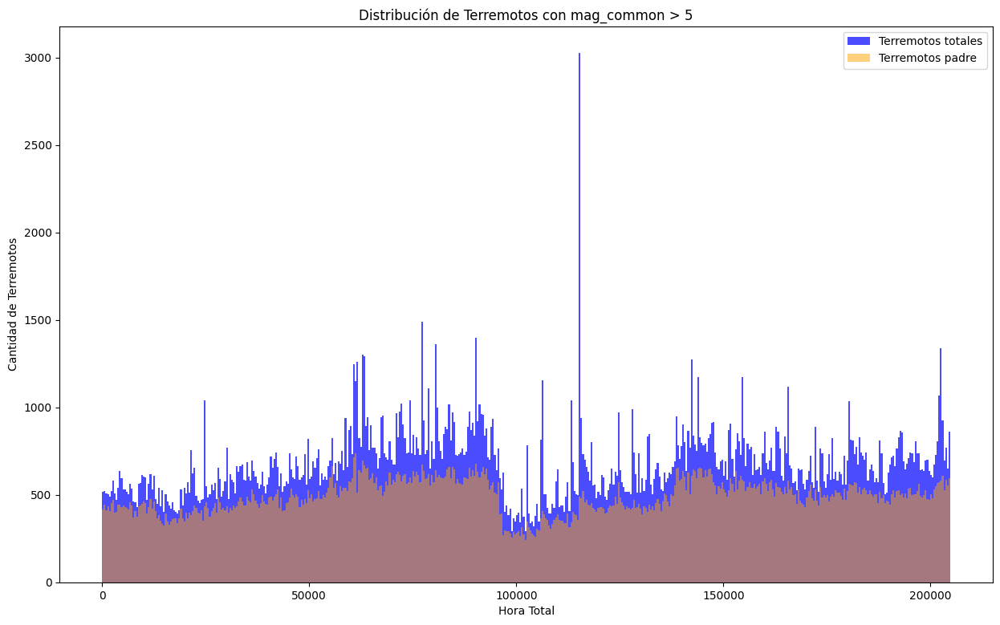

In [ ]:
histogramas_terremotos(data1= df_filtrado, data2= df_agrupado, filtro="mag_common", filtro_valor=5)

# Exclusión terremotos cercanos a fallas tectónicas

Vamos a utilizar el dataframe **placas_tectónicas** procesado en *tratamiento_placas*. Nos dice las coordenadas de todas las placas tectónicas y con su conocimiento excluiremos los terremotos cercanos a ellas, pues supondremos que se tratan de terremotos generados principalmente por la actividad terrestre.

In [ ]:
df_placas = pd.read_excel(path + '/dataframes_preprocesados/placas_tectonicas.xlsx')

In [ ]:
df_placas.head()

,Placa,Longitud,Latitud
0,AF-AN,-0.437900,-54.8518
1,AF-AN,-0.038826,-54.6772
2,AF-AN,0.443182,-54.4512
3,AF-AN,0.964534,-54.8322
4,AF-AN,1.694810,-54.3990


In [ ]:
import cartopy.crs as ccrs

In [ ]:
def graficar_mapa_fallas(df):

  # Crear un gráfico de dispersión con fondo de mapa mundi en Matplotlib
  fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})
  scatter = ax.scatter(df['Longitud'], df['Latitud'], c=df['Placa'].astype('category').cat.codes, cmap='plasma', s=10)

  # Configuraciones adicionales
  ax.set_title('Ubicación de Placas Tectónicas del Mundo\n')
  ax.coastlines()
  ax.gridlines(draw_labels=True)
  ax.set_xlabel('Longitud')
  ax.set_ylabel('Latitud')

  ax.text(0.5, -0.08, '\nLONGITUD', ha='center', va='center', transform=ax.transAxes)
  ax.text(-0.08, 0.5, 'LATITUD', ha='center', va='center', transform=ax.transAxes, rotation='vertical')


  # Guardar la figura como PNG
  fig.savefig(path + '/imagenes/mapa_tectonico.png', bbox_inches='tight', pad_inches=0.1)

  # Mostrar el gráfico
  plt.show()

/usr/local/lib/python3.10/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


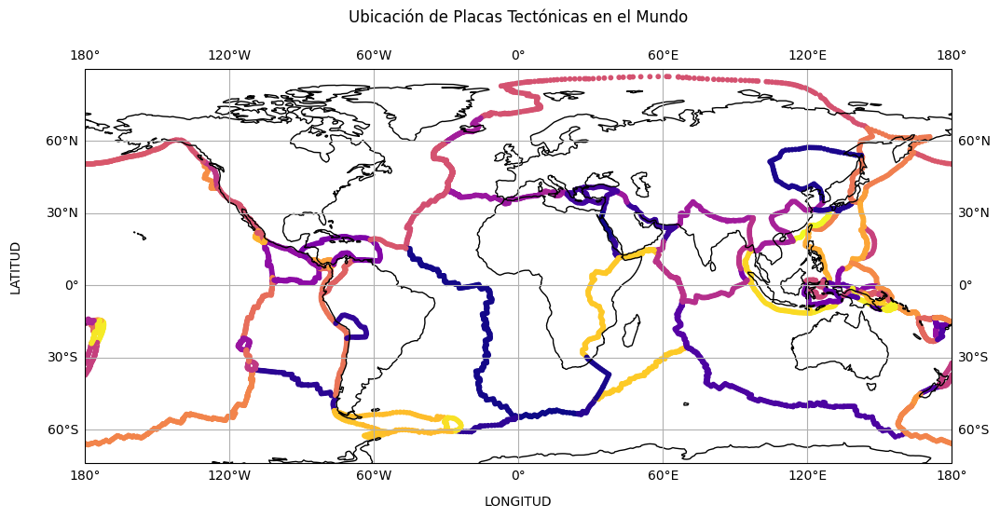

In [ ]:
graficar_mapa_fallas(df_placas)

Para empezar, vamos a ver las características del dataframe de las fallas

In [ ]:
df_placas.describe()

,Longitud,Latitud
count,6292.000000,6292.000000
mean,16.928723,2.233154
std,108.956354,36.480962
min,-180.000000,-66.163200
25%,-77.938825,-23.131700
50%,16.149550,1.161865
75%,126.104500,30.994375
max,180.000000,86.804900


In [ ]:
len(df_placas)

6292

In [ ]:
df_filtrado.describe()

,dia_total,dia_anual,hora,hora_total,latitude,longitude,depth,depth_mean,mag,mag_common,mag_mean,cantidad_cluster,cantidad_diaria,c.x,c.y,c.z,cluster
count,378069.000000,378069.000000,378069.000000,378069.000000,378069.000000,378069.000000,378069.000000,378069.000000,378069.000000,378069.000000,378069.000000,378069.000000,378069.000000,378069.000000,378069.000000,378069.000000,378069.000000
mean,4293.514985,181.308793,11.496653,103031.856301,15.001159,-7.232693,72.624839,72.605641,3.927011,4.974668,4.968213,1.554843,73.144074,-0.231187,-0.011583,0.229130,2399.883246
std,2412.142169,105.068288,6.966234,57891.438755,31.395508,122.674719,114.767200,114.678282,0.832746,0.879762,0.871862,22.293814,37.434711,0.532735,0.610148,0.487682,7901.456409
min,1.000000,1.000000,0.000000,1.000000,-84.422000,-179.999000,-3.480000,-3.480000,0.700000,1.370000,2.320000,1.000000,14.000000,-0.997327,-0.999935,-0.995265,-1.000000
25%,2350.000000,91.000000,5.000000,56380.000000,-8.921600,-117.789333,10.000000,10.000000,3.200000,4.600000,4.552000,1.000000,54.000000,-0.621744,-0.663767,-0.155083,-1.000000
50%,3974.000000,179.000000,12.000000,95375.000000,18.368000,-26.838200,33.000000,33.000000,4.100000,5.278000,5.278000,1.000000,67.000000,-0.404606,-0.018576,0.315119,-1.000000
75%,6417.000000,272.000000,18.000000,153991.000000,39.840000,125.697000,79.300000,79.000000,4.500000,5.630000,5.630000,1.000000,82.000000,0.274086,0.522834,0.640646,-1.000000
max,8532.000000,366.000000,23.000000,204766.000000,87.386000,180.000000,735.800000,735.800000,9.100000,9.100000,8.400000,7214.000000,1277.000000,0.998732,0.999975,0.998959,42606.000000


In [ ]:
def exclusion_terremotos_tectonicos(df, df_placas, r, graficar=True):
    '''
    r: radio de aproximación
    '''

    path = '/content/drive/My Drive/Master ciencia de datos (Big Data & TFM)/TFM - tormentas solares/bases de datos - nuevo'
    subconjuntos = {}
    exclusiones = []

    # Cargar datos del mapamundi
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

    if graficar == True:
      # Visualizar la distribución de coordenadas de df antes del bucle
      fig, ax = plt.subplots(figsize=(12, 8))
      world.plot(ax=ax, color='lightgray')
      ax.scatter(df['longitude'], df['latitude'], color='blue', s=10, label='Totales')
      ax.set_title('Distribución de Terremotos Totales')
      ax.set_xlabel('Longitud')
      ax.set_ylabel('Latitud')
      ax.legend()
      plt.savefig(path + '/imagenes/Terremotos_totales.png')
      plt.show()

    for i, row in df_placas.iterrows():  # Iterar sobre filas del DataFrame df_placas

        subconjuntos[i] = df[
            (df["latitude"] < row["Latitud"] + r) &
            (df["latitude"] > row["Latitud"] - r) &
            (df["longitude"] < row["Longitud"] + r) &
            (df["longitude"] > row["Longitud"] - r)
        ]

        # Excluir registros del DataFrame principal
        df = df[~df.index.isin(subconjuntos[i].index)]  # Corrección aquí
        exclusiones.append(len(subconjuntos[i]))

    df.to_excel(path + f'/dataframes_preprocesados/terremotos_tectonicos_{r}_grados.xlsx', index=False)

    # Visualizar la distribución de coordenadas de df después del bucle
    fig, ax = plt.subplots(figsize=(12, 8))
    world.plot(ax=ax, color='lightgray')
    ax.scatter(df['longitude'], df['latitude'], color='red', s=10, label='Terremotos No tectónicos')
    ax.set_title(f'Terremotos NO Tectónicos con separación de {r}º respecto a los Márgenes Tectónicos')
    ax.set_xlabel('Longitud')
    ax.set_ylabel('Latitud')
    ax.legend()
    plt.savefig(path + f'/imagenes/Terremotos_No_Tectonicos_{r}_grados.png')
    plt.show()

    if graficar == True:
      # Visualizar la distribución de coordenadas de df_placas
      fig, ax = plt.subplots(figsize=(12, 8))
      world.plot(ax=ax, color='lightgray')
      ax.scatter(df_placas['Longitud'], df_placas['Latitud'], color='green', s=10, label='Márgenes de Placas Tectónicas')
      ax.set_title('Márgenes Tectónicos')
      ax.set_xlabel('Longitud')
      ax.set_ylabel('Latitud')
      ax.legend()
      plt.savefig(path + f'/imagenes/Bordes_Tectonicos.png')
      plt.show()

    # Visualizar la distribución de coordenadas de df_placas junto con las de df después del bucle
    fig, ax = plt.subplots(figsize=(12, 8))
    world.plot(ax=ax, color='lightgray')
    ax.scatter(df['longitude'], df['latitude'], color='red', s=10, label='Terremotos NO Tectónicos')
    ax.scatter(df_placas['Longitud'], df_placas['Latitud'], color='green', s=10, label='Márgenes Tectónicos')
    ax.set_title(f'Márgenes Tectónicos y Terremotos NO Tectónicos con separación de {r}º respecto a los Márgenes Tectónicos')
    ax.set_xlabel('Longitud')
    ax.set_ylabel('Latitud')
    ax.legend()
    plt.savefig(path + f'/imagenes/Terremotos_NO_Tectonicos_con_bordes_{r}.png')
    plt.show()

    print(f'Excluidos (tectónicos):\t {sum(exclusiones)}\n', f'Terremotos no-tectónicos: {len(df)}')

    return [ sum(exclusiones), len(df), df ]


<ipython-input-14-bcf7f2e66e65>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


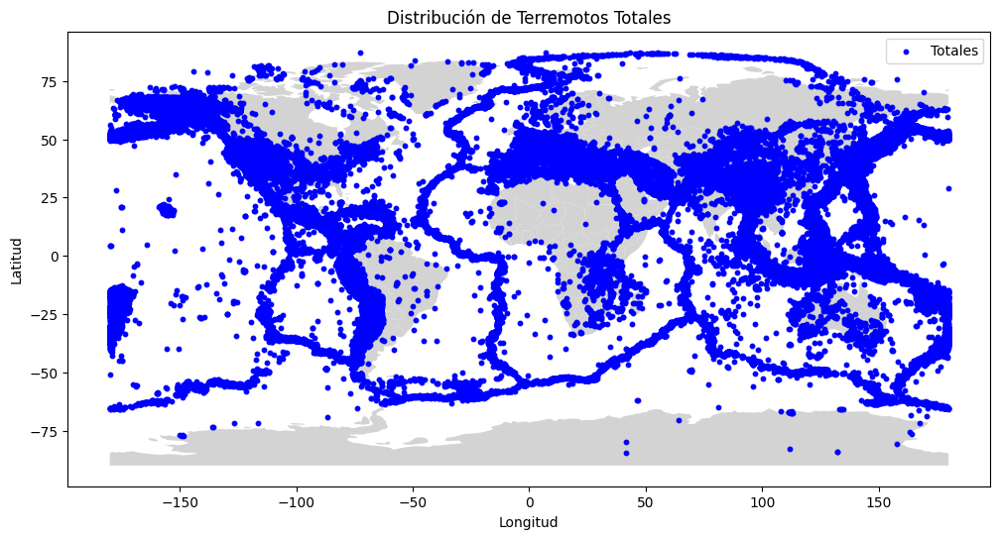

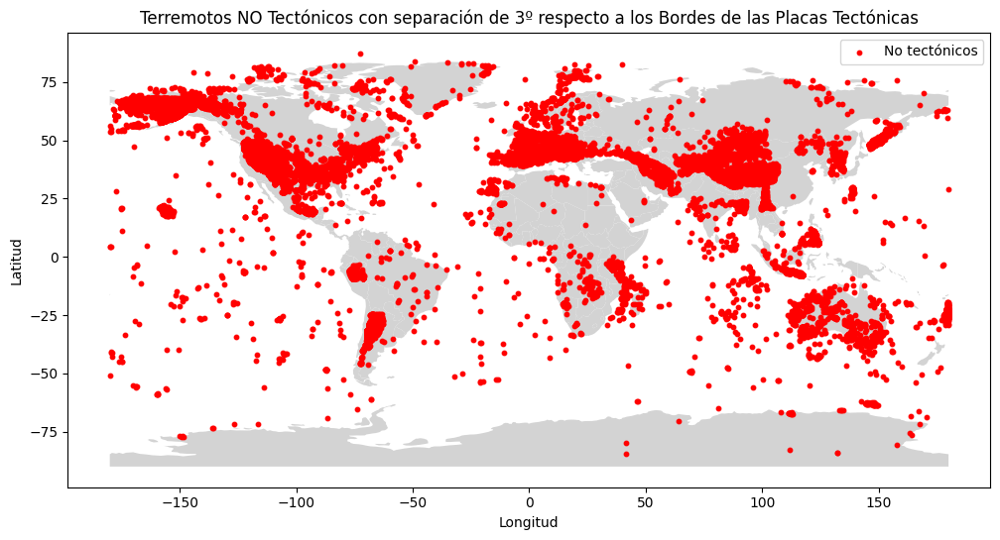

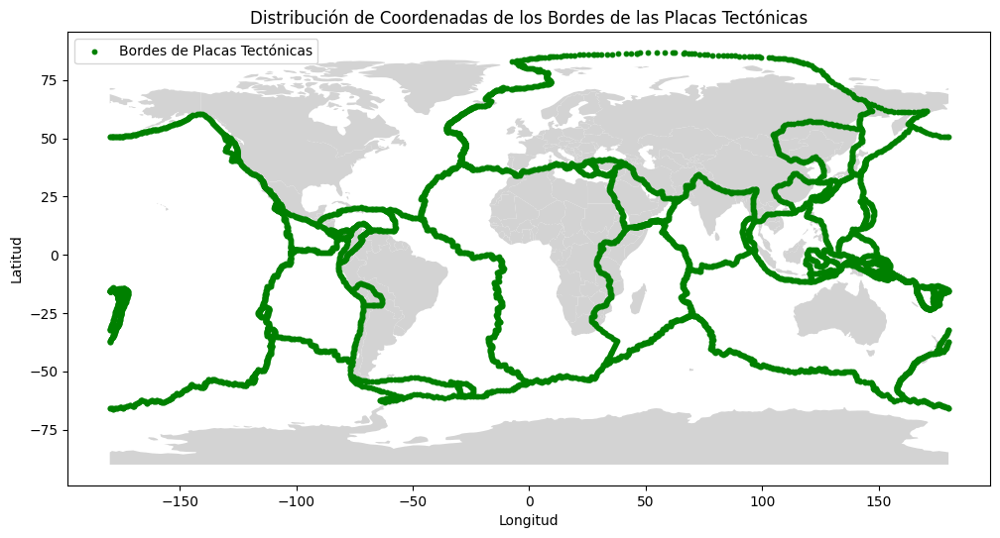

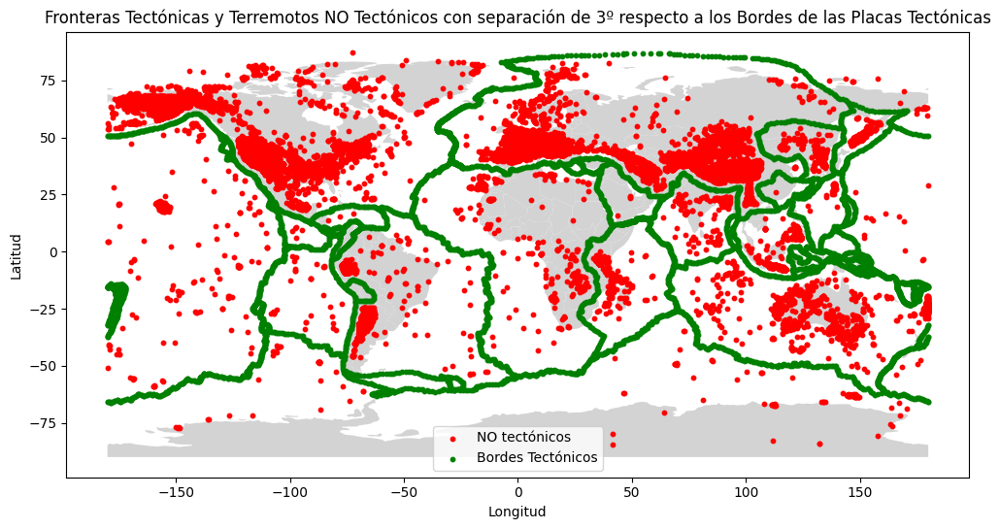

Excluidos:	 327469
 Terremotos no-tectónicos: 50600


[327469, 50600]

In [ ]:
exclusion_terremotos_tectonicos(df_filtrado, df_placas, 3)

Creamos un dataframe distinto según el grado de separación respecto a las placas tectónicas, lo que nos dará menos cantidad de terremotos conforme nos alejemos.

<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


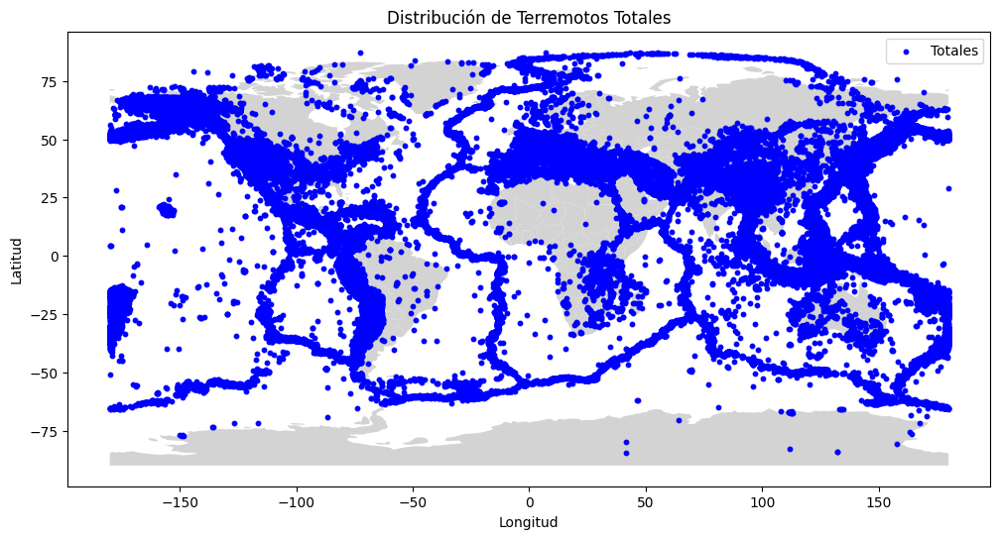

Exception ignored in: <function ZipFile.__del__ at 0x79e1601f1900>
Traceback (most recent call last):
  File "/usr/lib/python3.10/zipfile.py", line 1821, in __del__
    self.close()
  File "/usr/lib/python3.10/zipfile.py", line 1838, in close
    self.fp.seek(self.start_dir)
OSError: [Errno 107] Transport endpoint is not connected


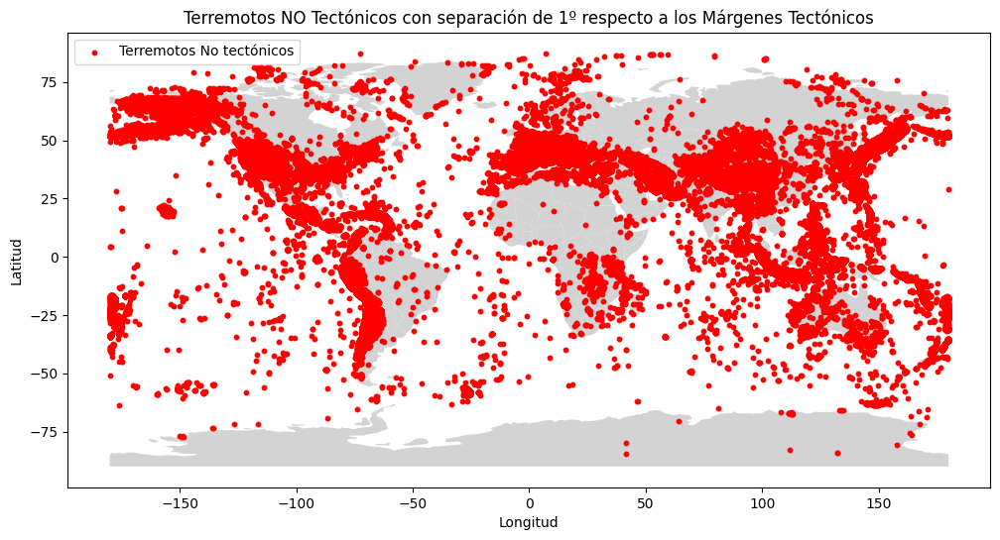

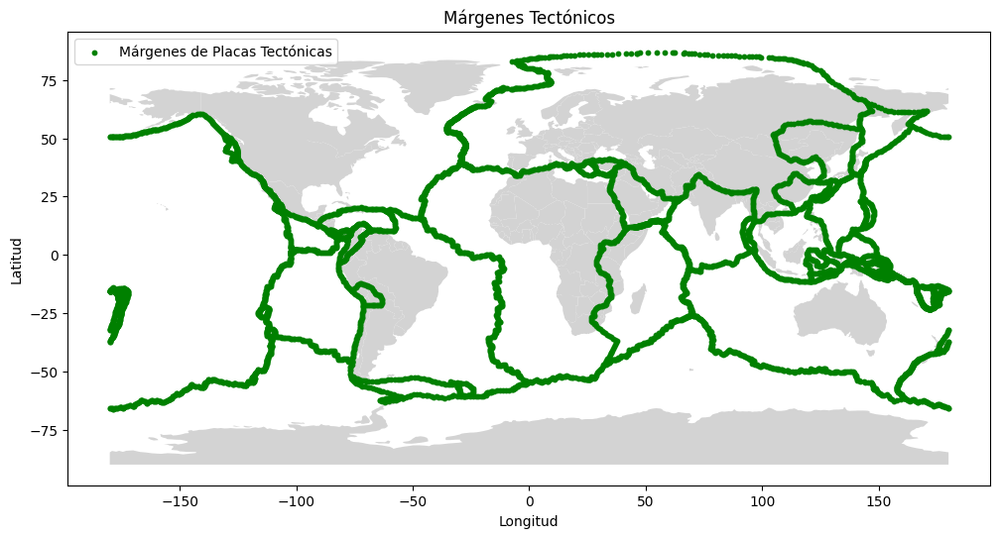

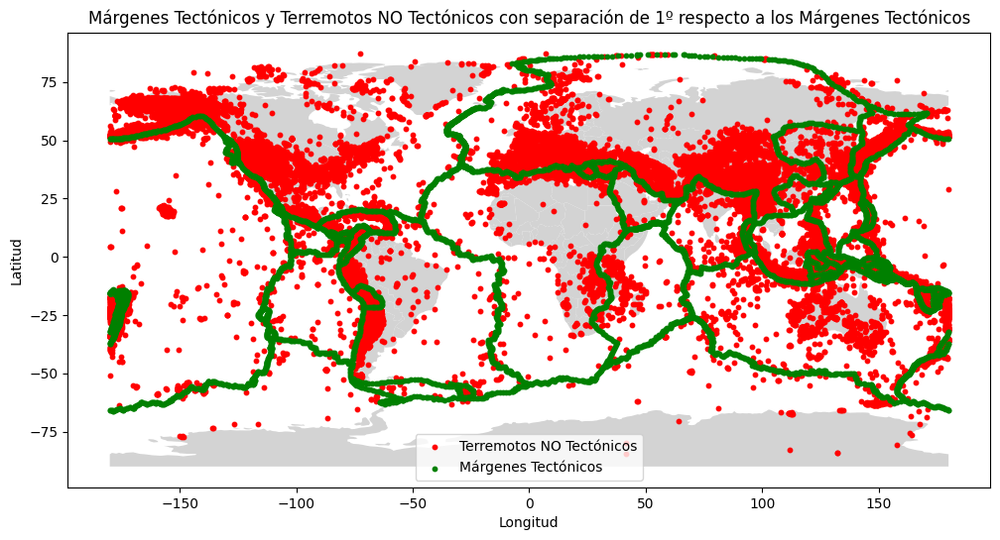

Excluidos (tectónicos):	 219421
 Terremotos no-tectónicos: 158648
El tiempo de ejecución con 1º es de 294.41788935661316 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


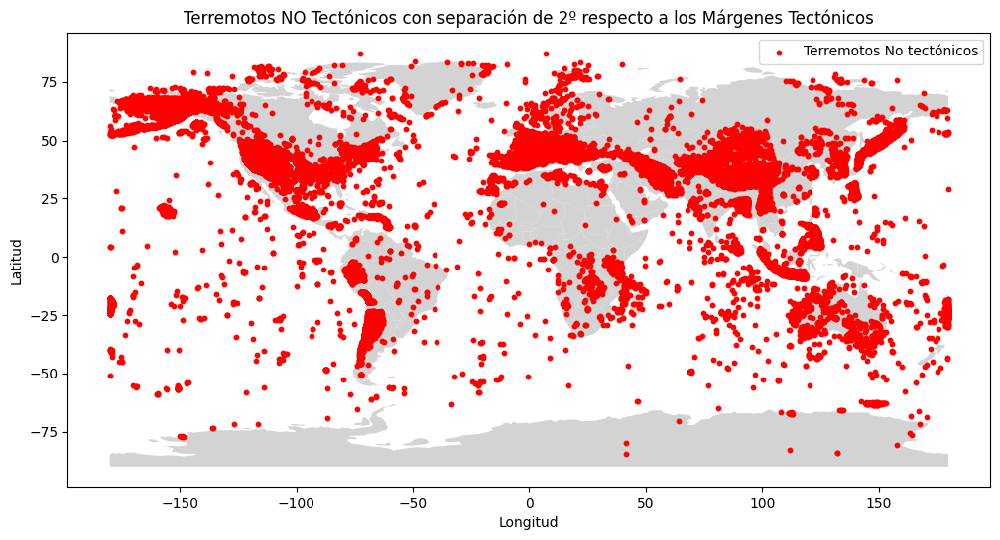

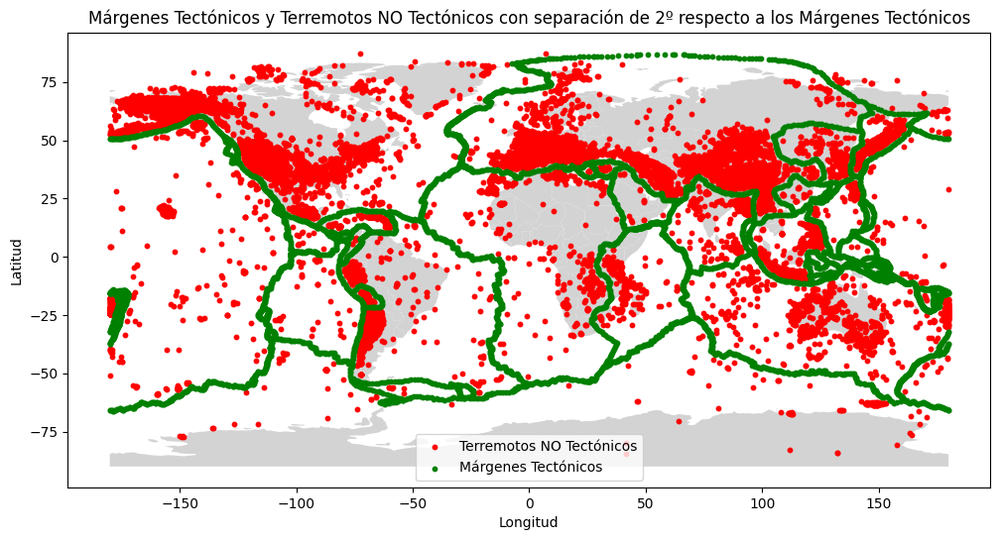

Excluidos (tectónicos):	 79554
 Terremotos no-tectónicos: 79094
El tiempo de ejecución con 2º es de 142.18270802497864 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


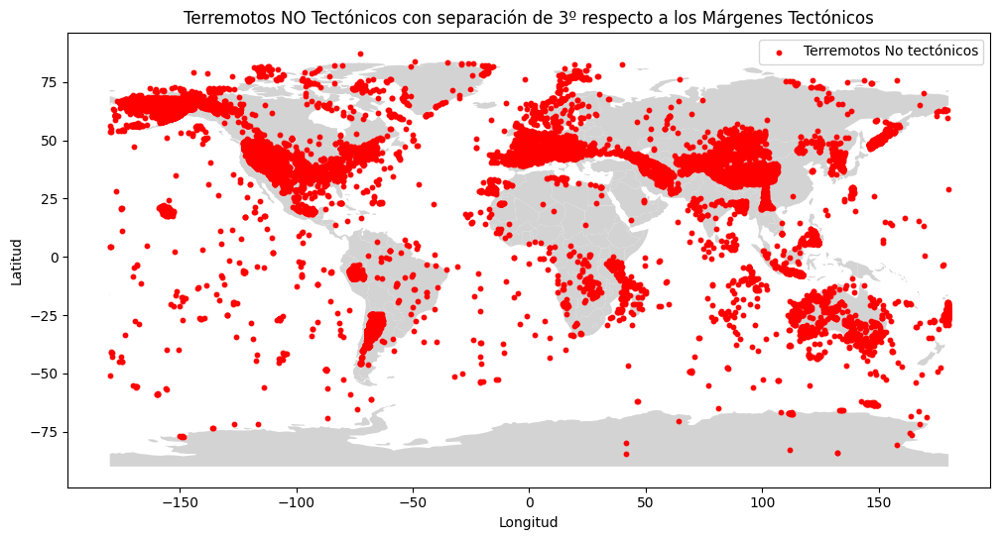

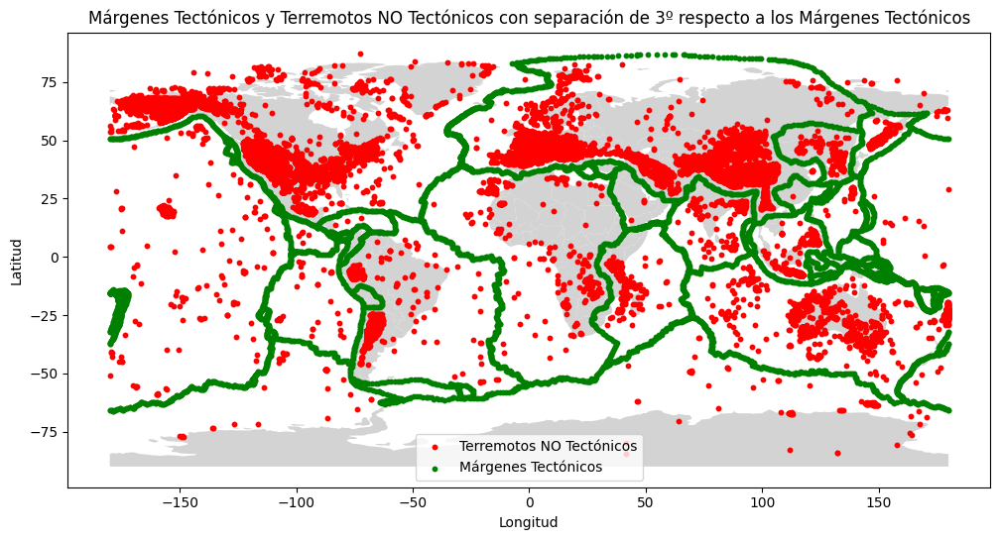

Excluidos (tectónicos):	 28494
 Terremotos no-tectónicos: 50600
El tiempo de ejecución con 3º es de 89.44544005393982 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


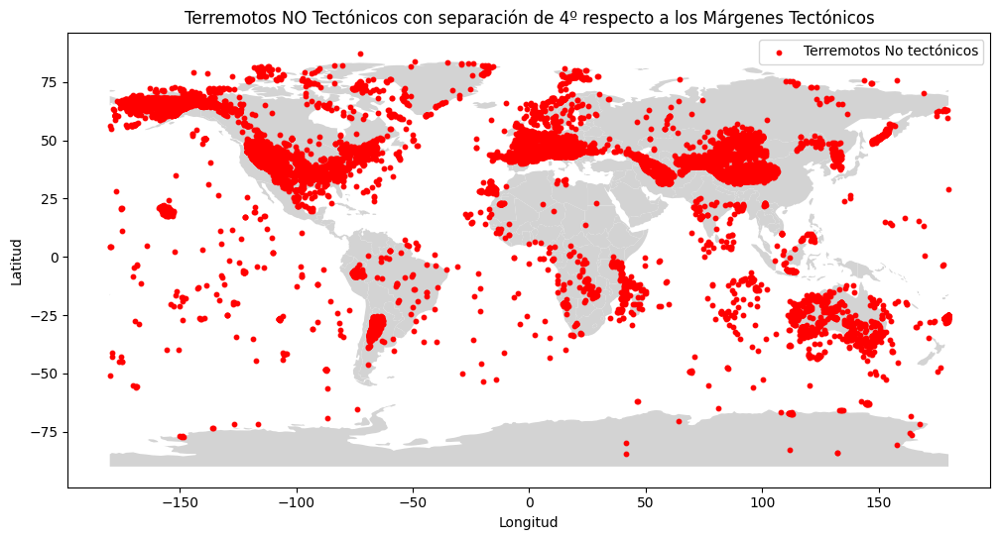

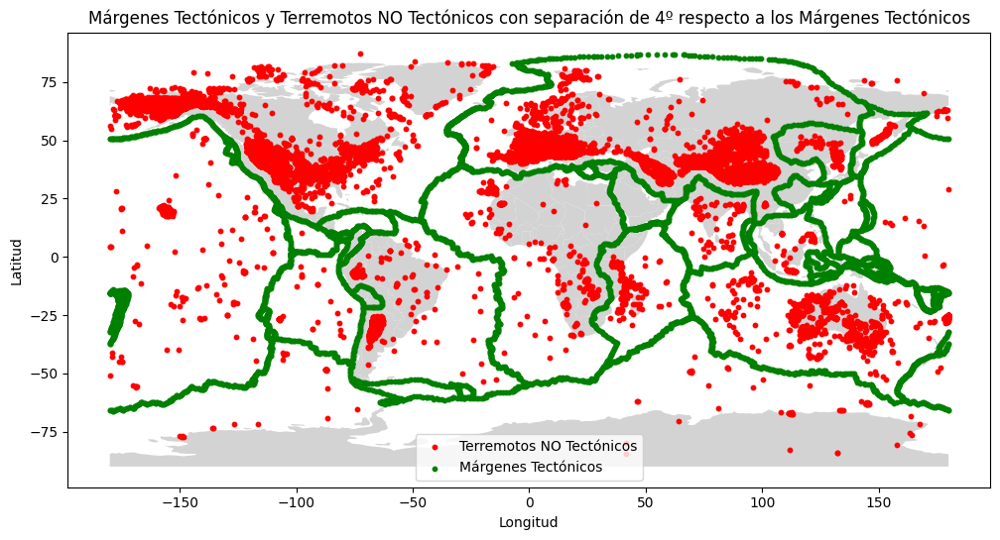

Excluidos (tectónicos):	 16289
 Terremotos no-tectónicos: 34311
El tiempo de ejecución con 4º es de 62.00074219703674 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


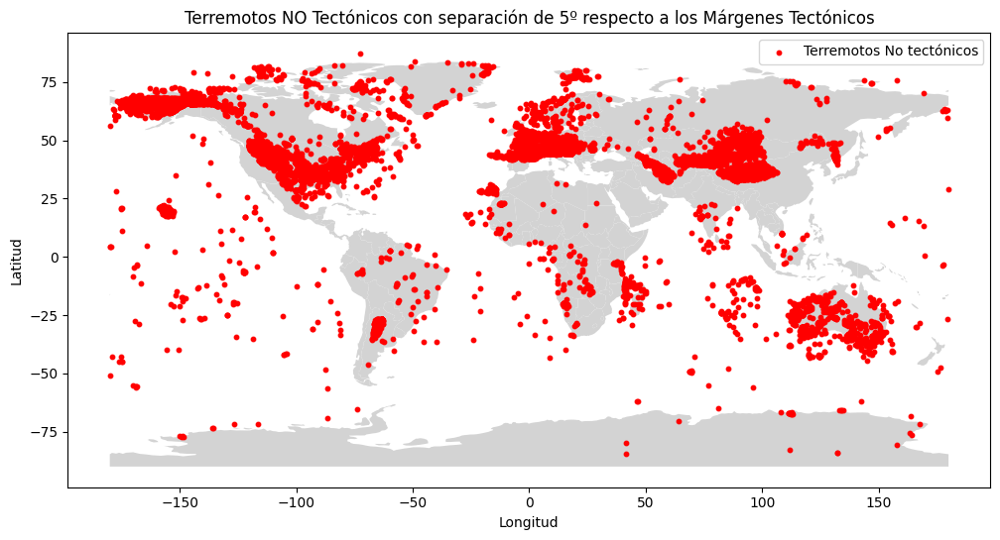

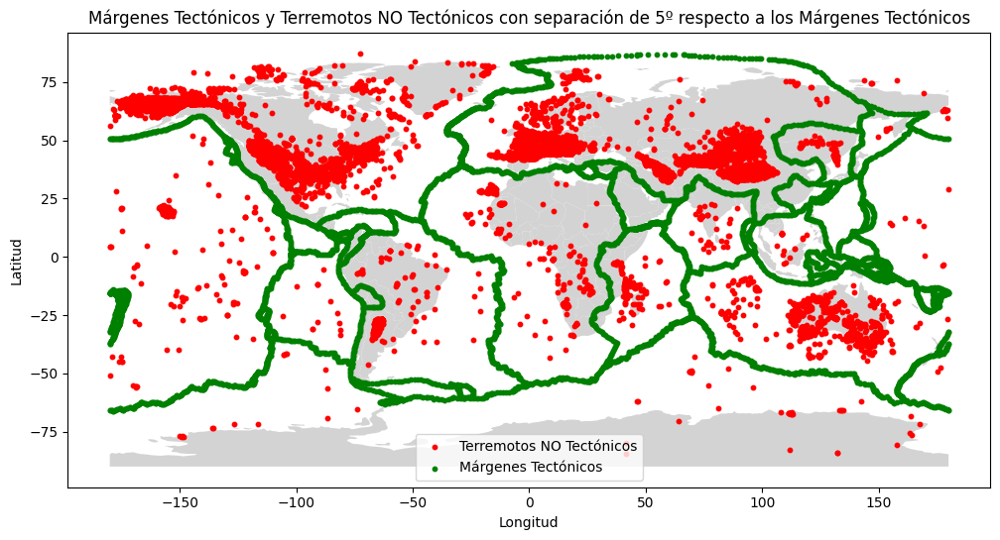

Excluidos (tectónicos):	 9008
 Terremotos no-tectónicos: 25303
El tiempo de ejecución con 5º es de 46.631417989730835 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


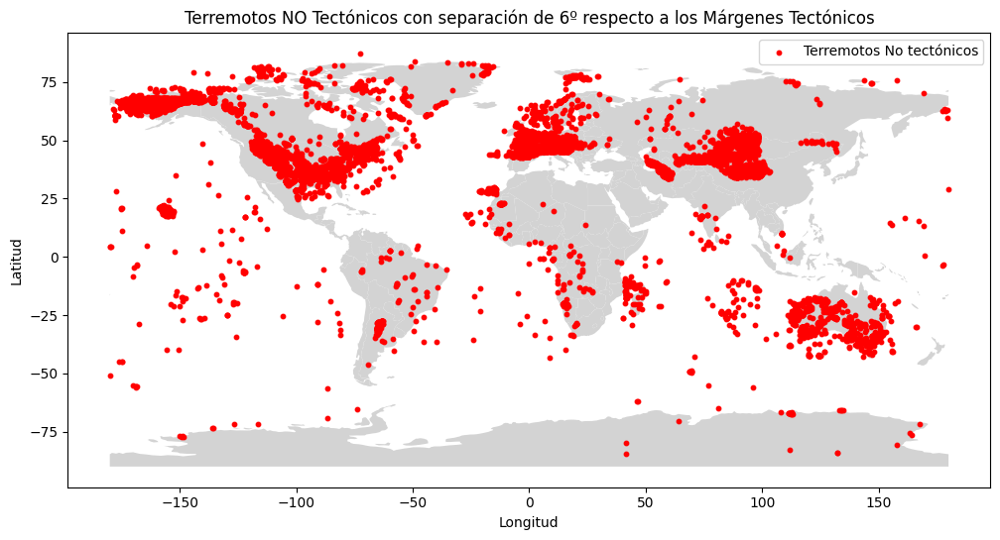

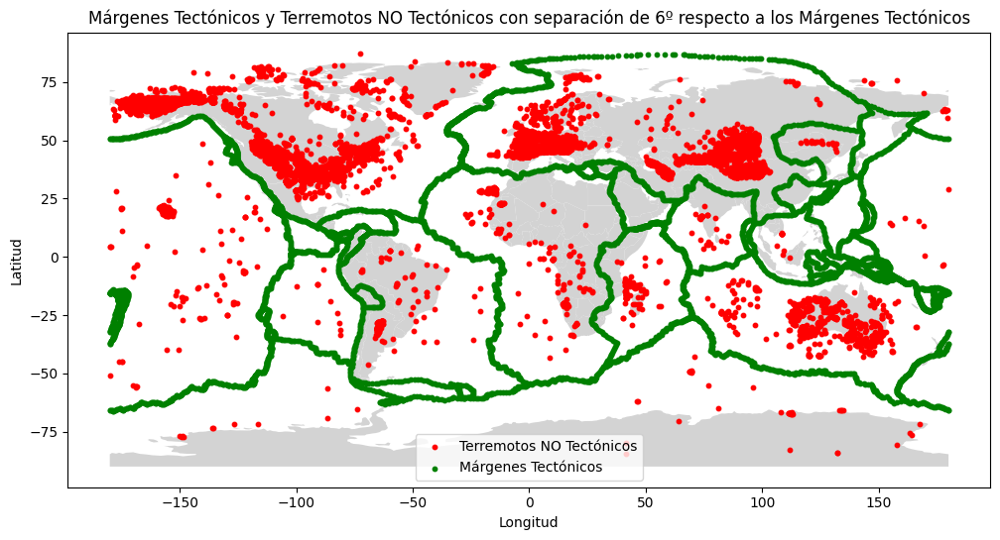

Excluidos (tectónicos):	 4730
 Terremotos no-tectónicos: 20573
El tiempo de ejecución con 6º es de 37.348206520080566 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


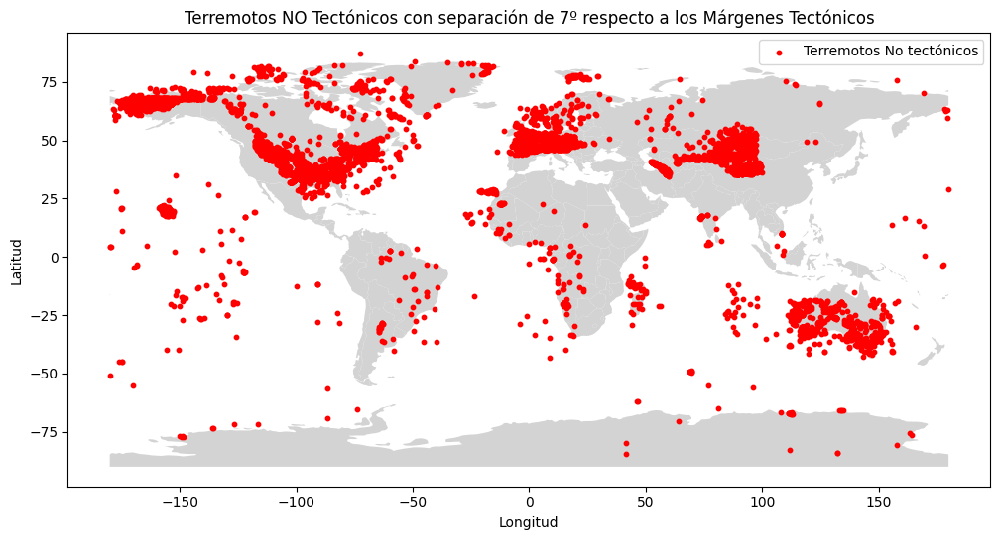

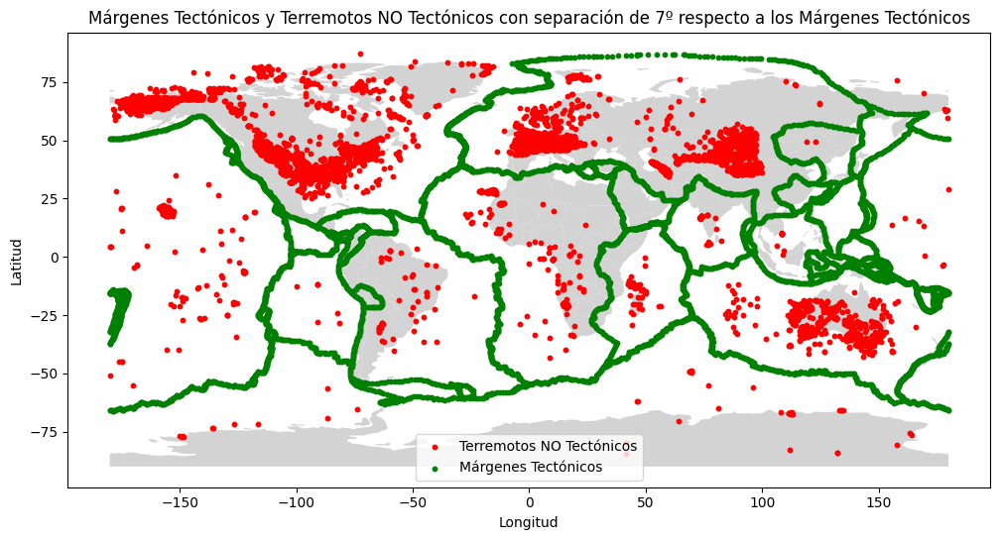

Excluidos (tectónicos):	 3048
 Terremotos no-tectónicos: 17525
El tiempo de ejecución con 7º es de 33.19596576690674 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


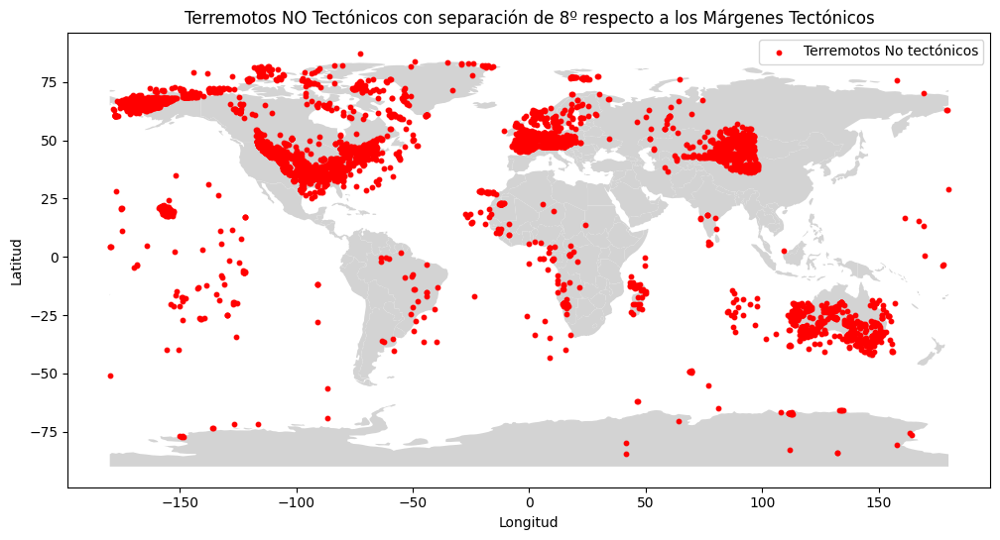

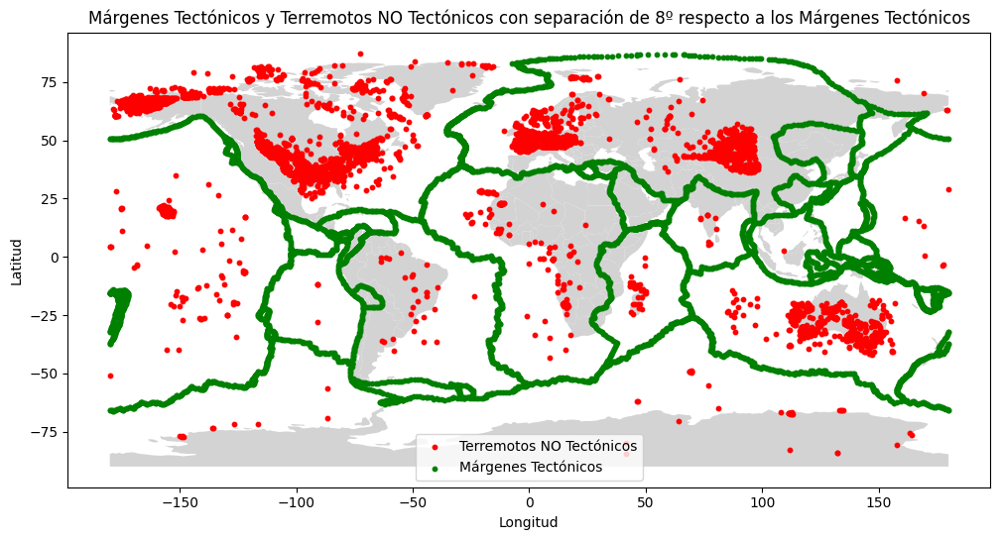

Excluidos (tectónicos):	 2250
 Terremotos no-tectónicos: 15275
El tiempo de ejecución con 8º es de 29.908963441848755 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


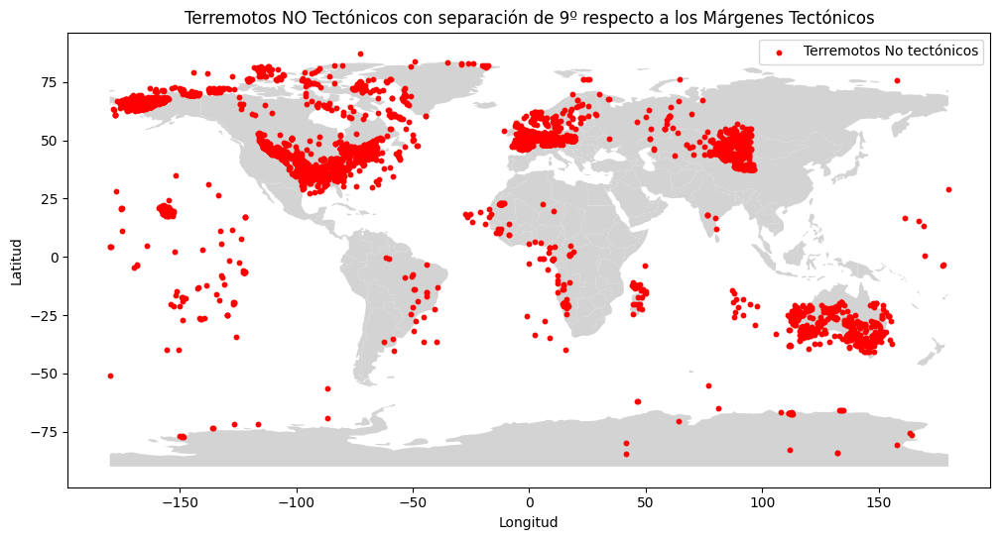

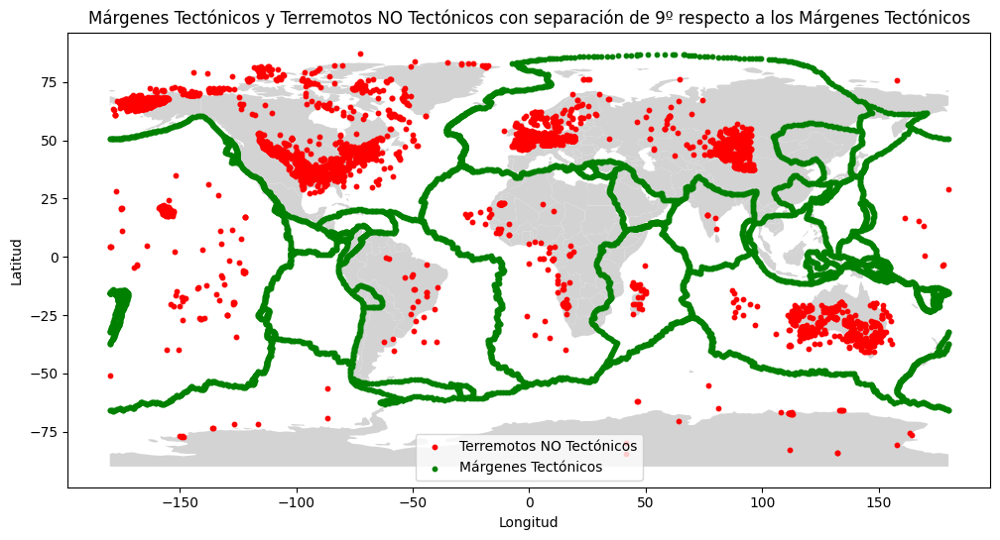

Excluidos (tectónicos):	 2079
 Terremotos no-tectónicos: 13196
El tiempo de ejecución con 9º es de 27.68331551551819 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


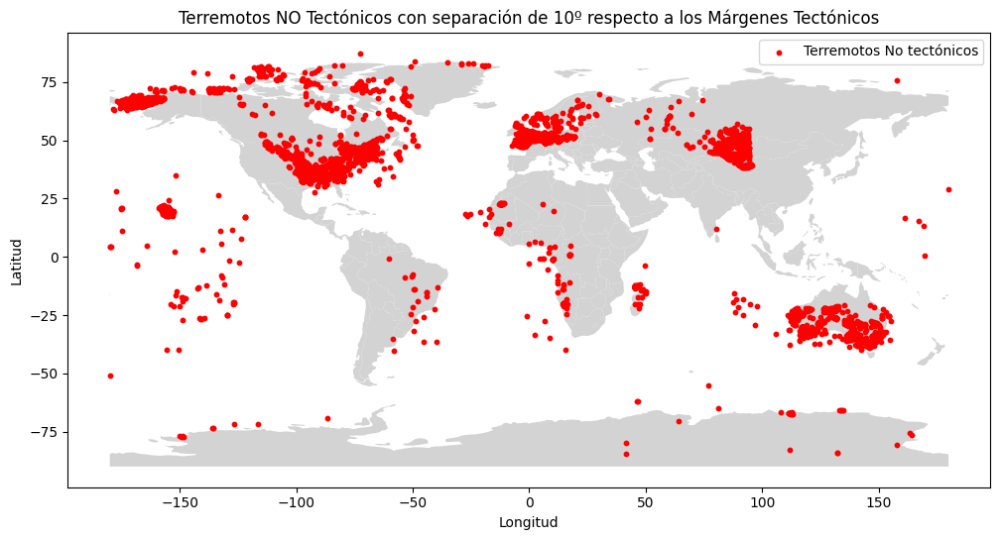

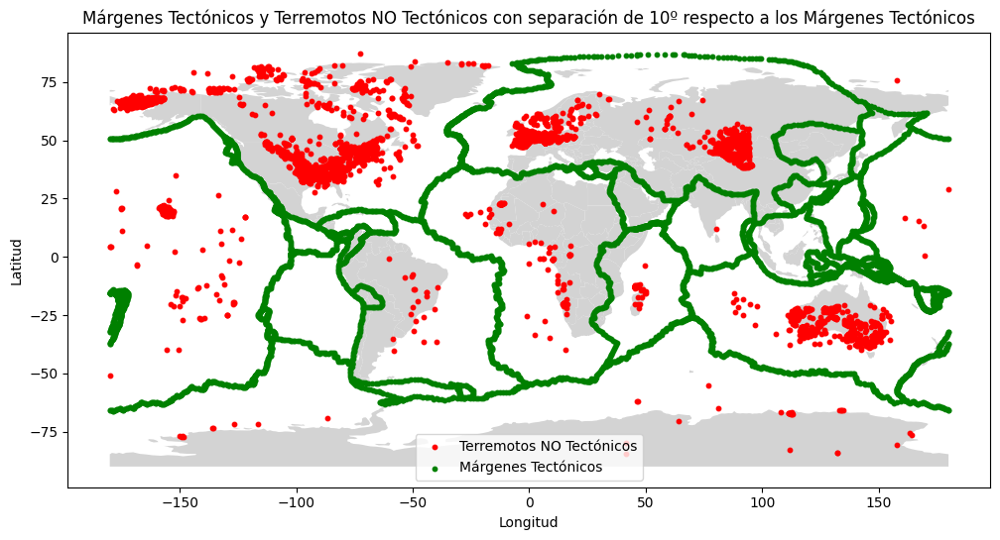

Excluidos (tectónicos):	 2219
 Terremotos no-tectónicos: 10977
El tiempo de ejecución con 10º es de 24.692086696624756 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


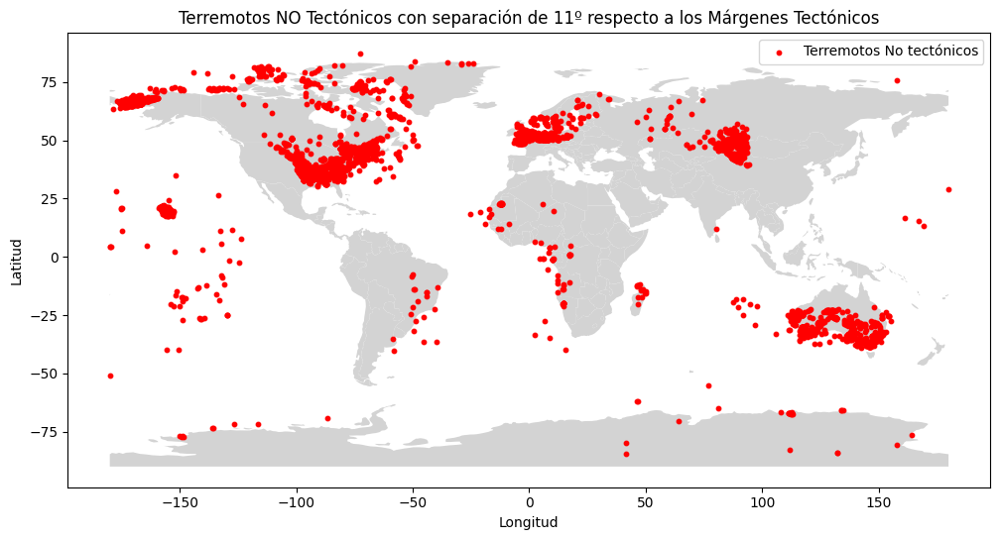

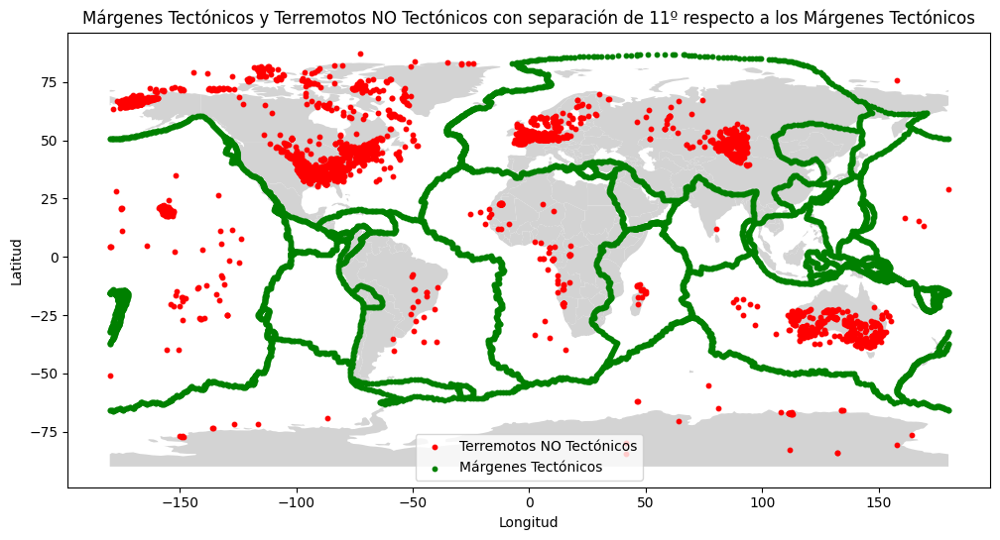

Excluidos (tectónicos):	 1662
 Terremotos no-tectónicos: 9315
El tiempo de ejecución con 11º es de 22.338890075683594 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


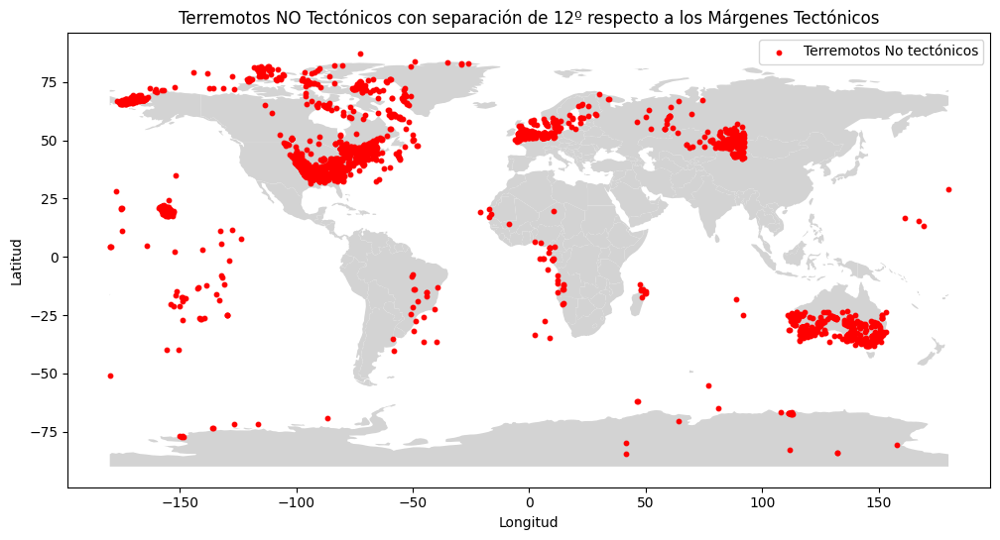

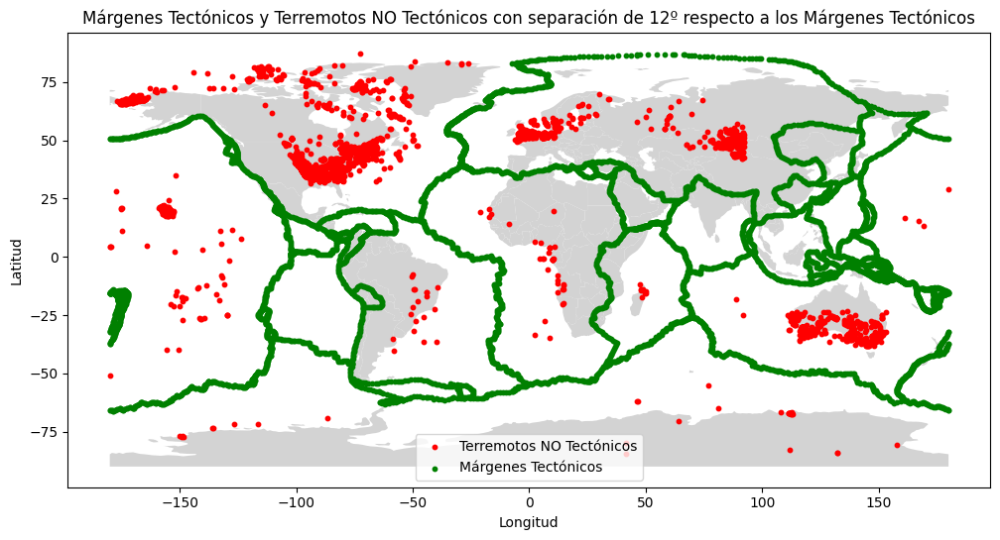

Excluidos (tectónicos):	 2934
 Terremotos no-tectónicos: 6381
El tiempo de ejecución con 12º es de 19.592057466506958 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


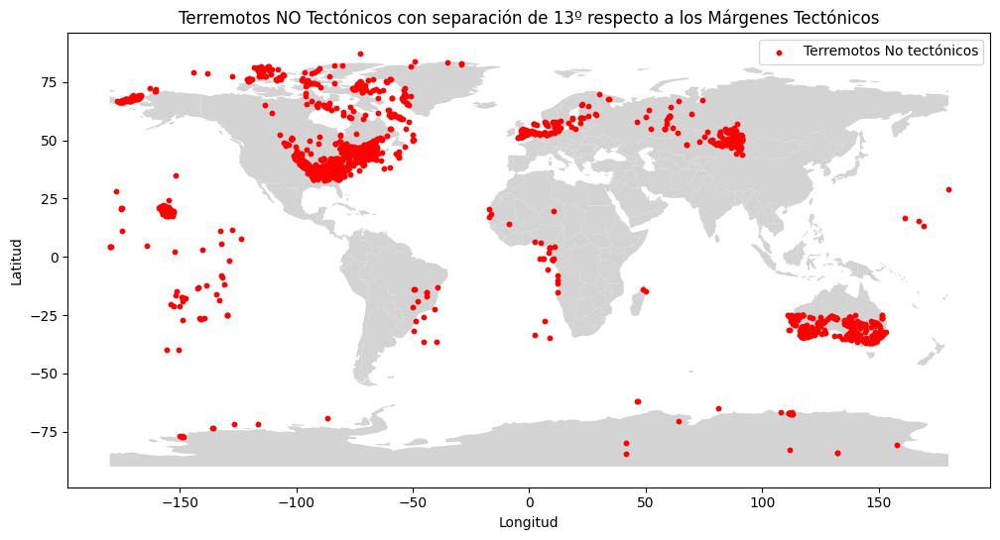

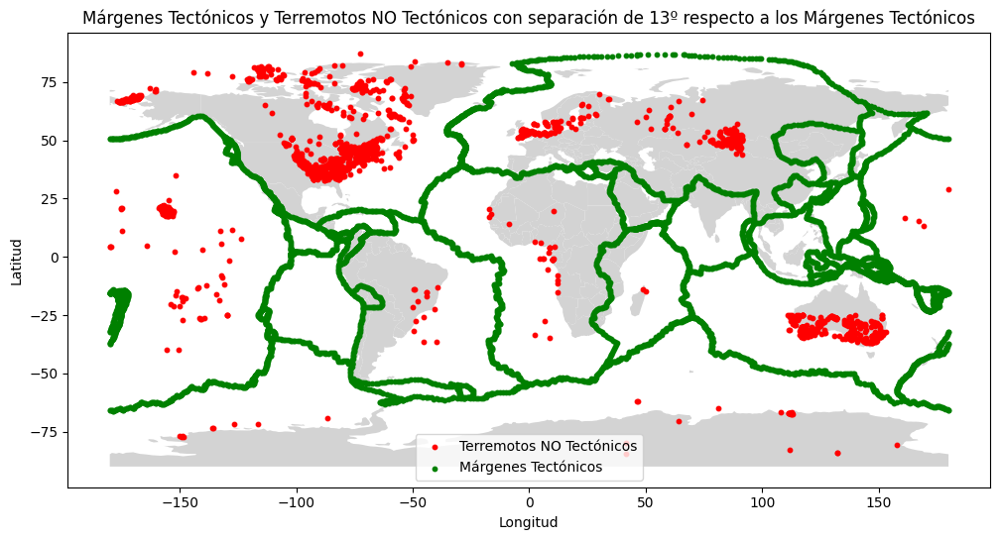

Excluidos (tectónicos):	 1089
 Terremotos no-tectónicos: 5292
El tiempo de ejecución con 13º es de 17.64747667312622 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


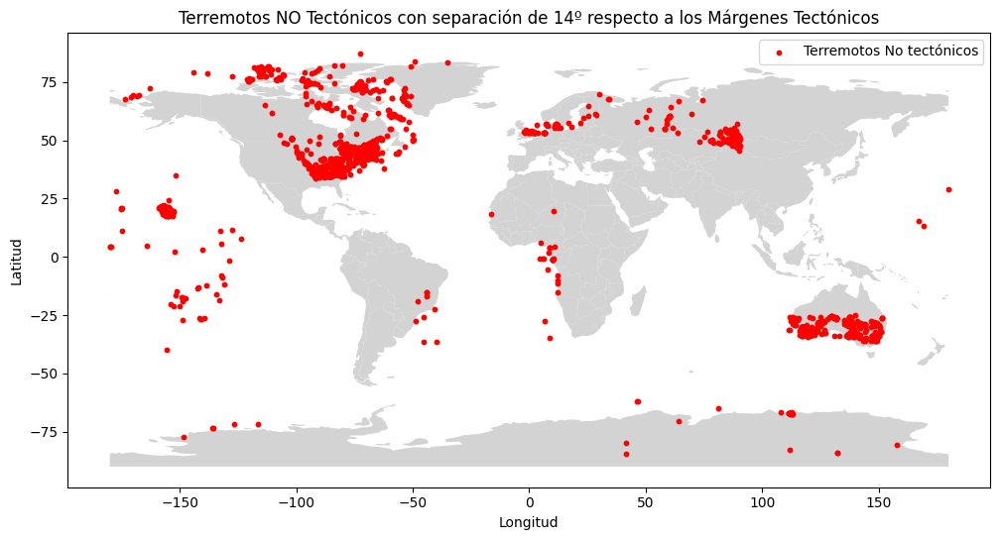

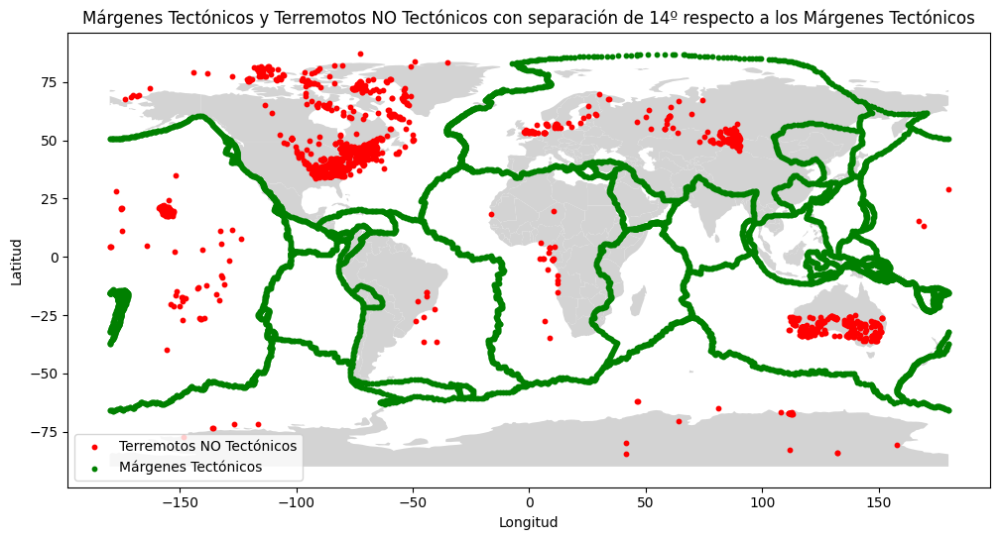

Excluidos (tectónicos):	 369
 Terremotos no-tectónicos: 4923
El tiempo de ejecución con 14º es de 17.041715145111084 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


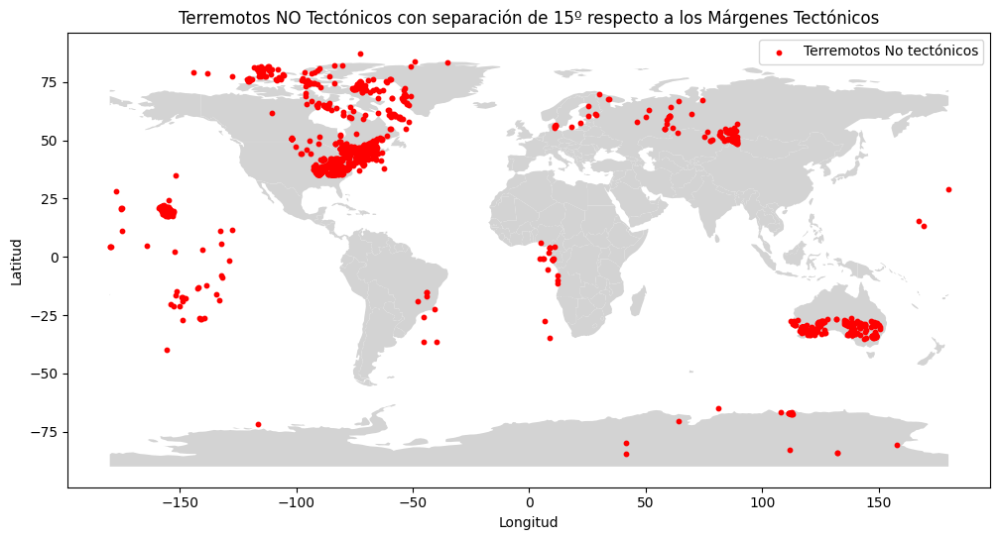

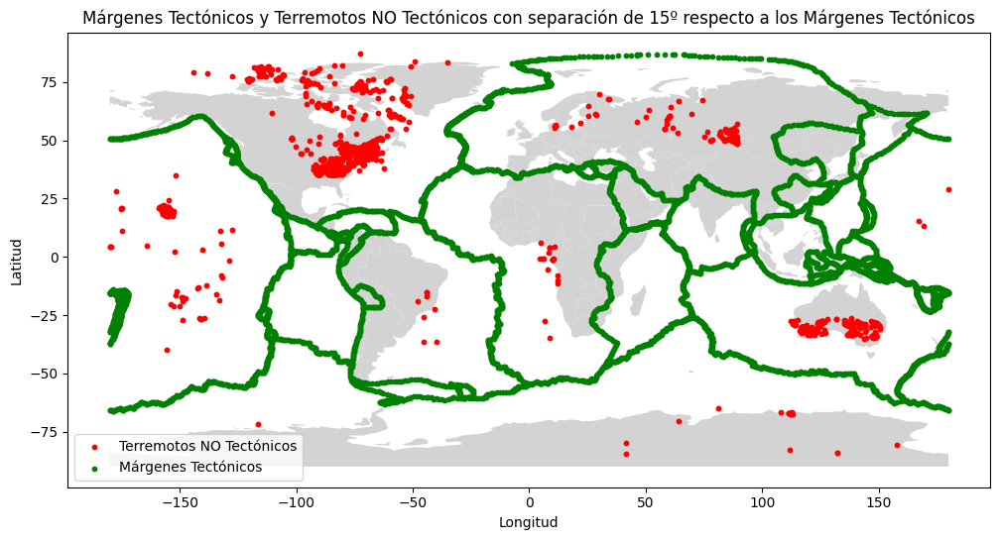

Excluidos (tectónicos):	 388
 Terremotos no-tectónicos: 4535
El tiempo de ejecución con 15º es de 16.30979347229004 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


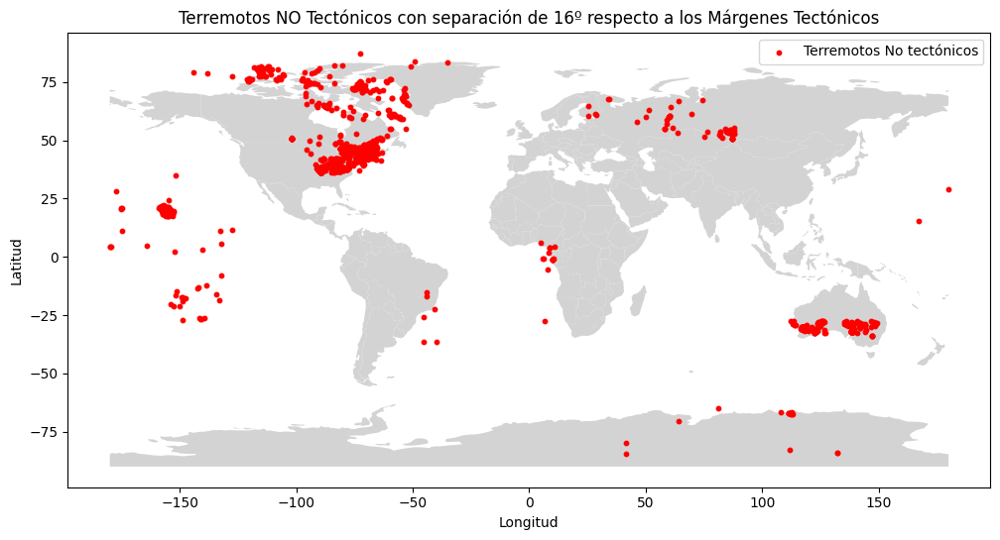

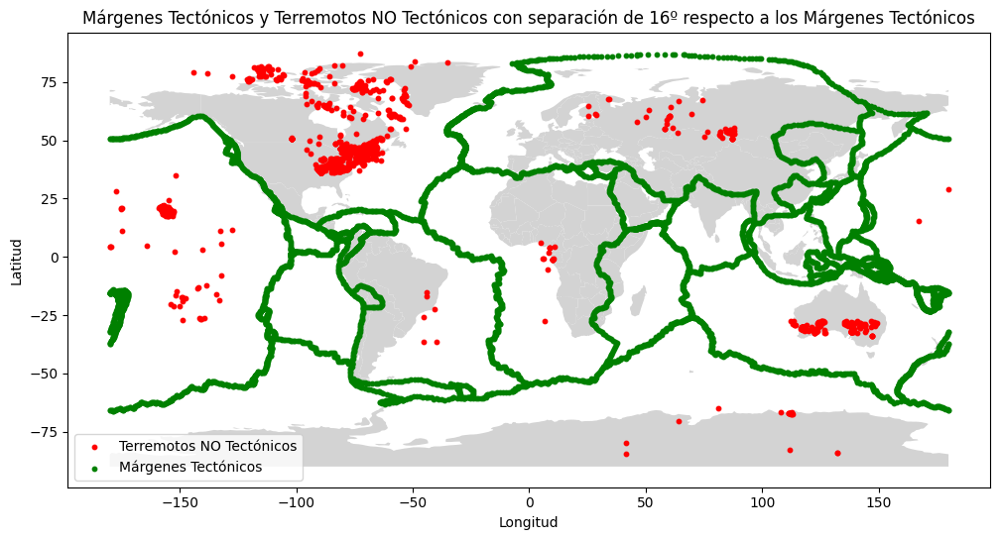

Excluidos (tectónicos):	 507
 Terremotos no-tectónicos: 4028
El tiempo de ejecución con 16º es de 15.62828540802002 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


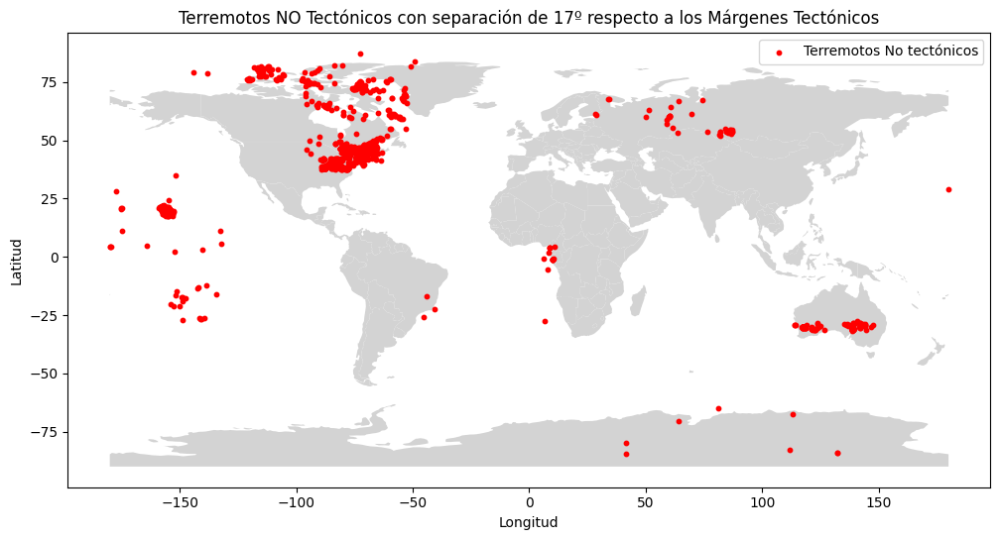

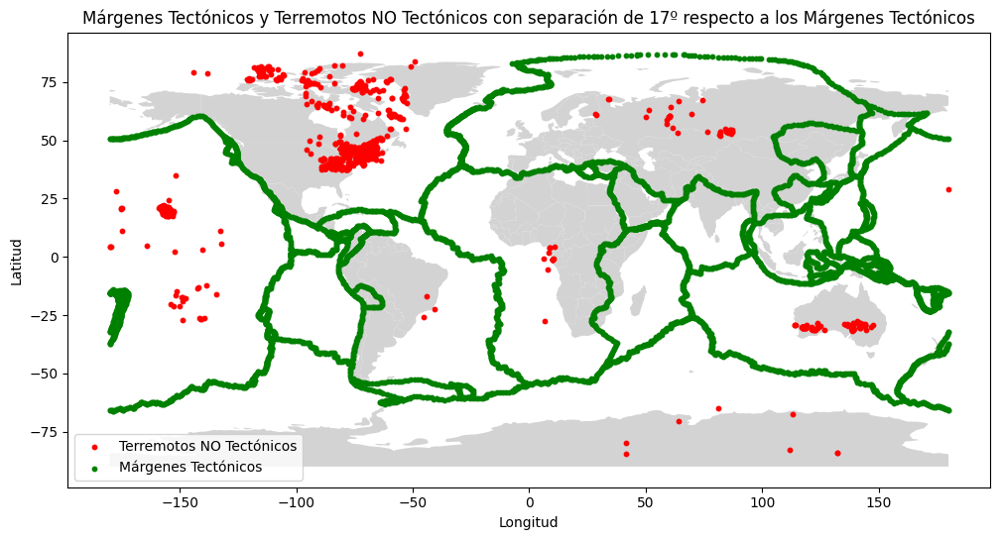

Excluidos (tectónicos):	 429
 Terremotos no-tectónicos: 3599
El tiempo de ejecución con 17º es de 15.595815658569336 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


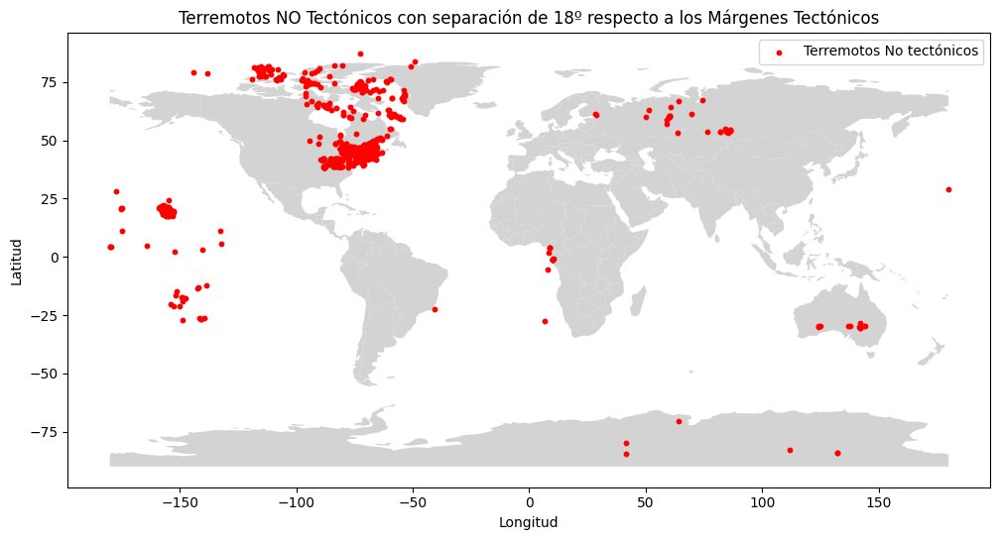

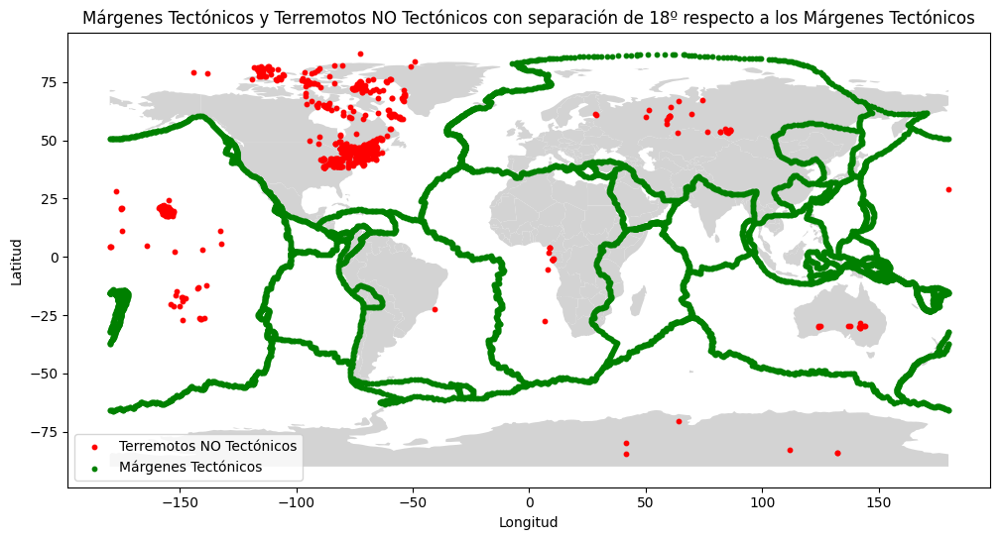

Excluidos (tectónicos):	 182
 Terremotos no-tectónicos: 3417
El tiempo de ejecución con 18º es de 14.921389102935791 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


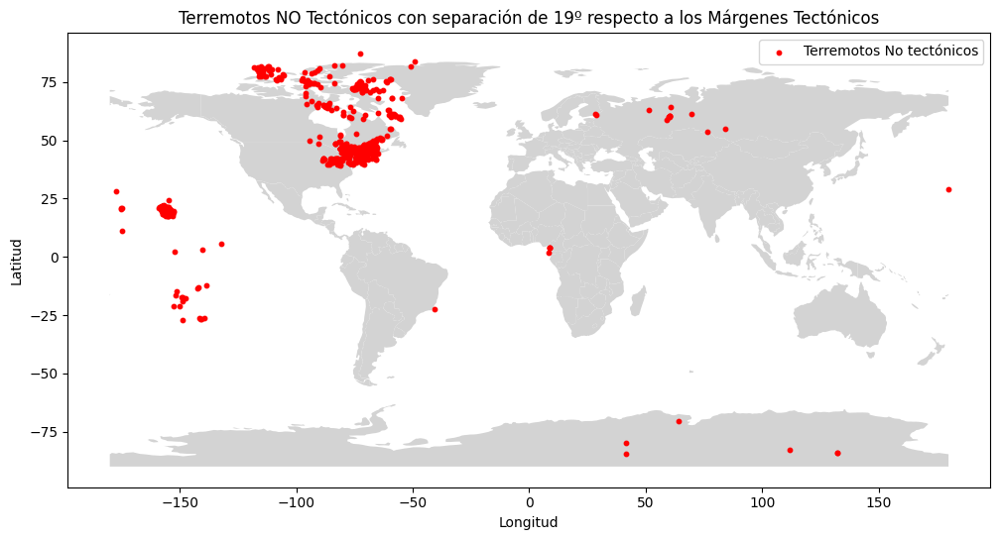

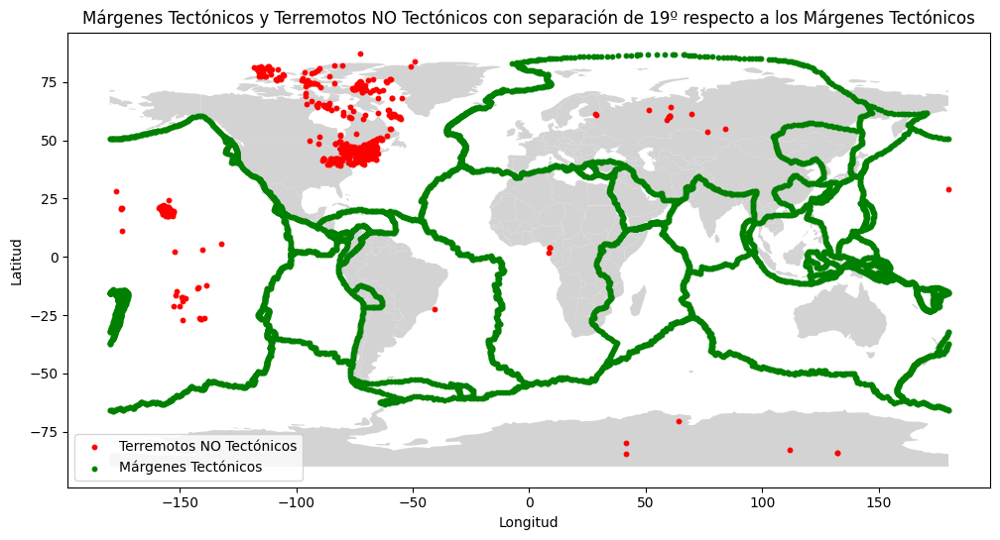

Excluidos (tectónicos):	 92
 Terremotos no-tectónicos: 3325
El tiempo de ejecución con 19º es de 15.114516258239746 s


<ipython-input-36-9bd867da11f9>:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


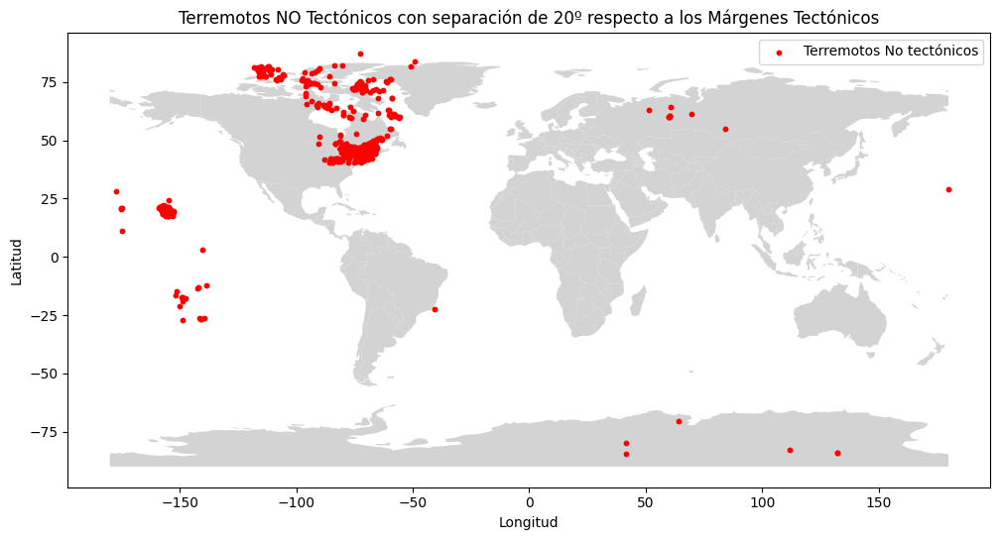

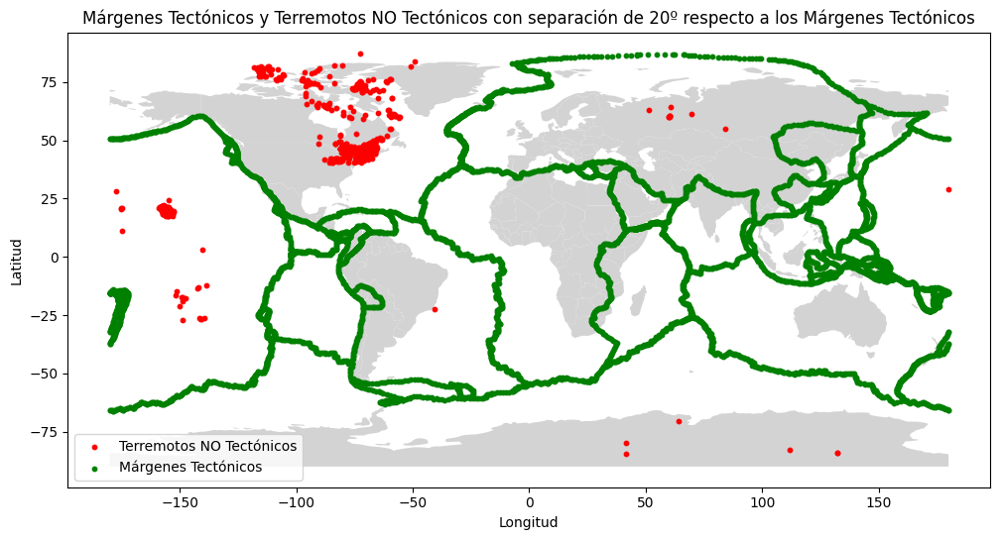

Excluidos (tectónicos):	 45
 Terremotos no-tectónicos: 3280
El tiempo de ejecución con 20º es de 14.741084098815918 s
{'Grados': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20], 'Tectonicos': [219421, 79554, 28494, 16289, 9008, 4730, 3048, 2250, 2079, 2219, 1662, 2934, 1089, 369, 388, 507, 429, 182, 92, 45], 'No-tectonicos': [158648, 79094, 50600, 34311, 25303, 20573, 17525, 15275, 13196, 10977, 9315, 6381, 5292, 4923, 4535, 4028, 3599, 3417, 3325, 3280], 'Tiempo Ejecucion': [294.41788935661316, 142.18270802497864, 89.44544005393982, 62.00074219703674, 46.631417989730835, 37.348206520080566, 33.19596576690674, 29.908963441848755, 27.68331551551819, 24.692086696624756, 22.338890075683594, 19.592057466506958, 17.64747667312622, 17.041715145111084, 16.30979347229004, 15.62828540802002, 15.595815658569336, 14.921389102935791, 15.114516258239746, 14.741084098815918]}


,Grados,Tectonicos,No-tectonicos,Tiempo Ejecucion
0,1,219421,158648,294.417889
1,2,79554,79094,142.182708
2,3,28494,50600,89.445440
3,4,16289,34311,62.000742
4,5,9008,25303,46.631418
5,6,4730,20573,37.348207
6,7,3048,17525,33.195966
7,8,2250,15275,29.908963
8,9,2079,13196,27.683316
9,10,2219,10977,24.692087


In [ ]:
# Dataframe con datos de terremotos excluidos

grados = []
si_tectonicos = []
no_tectonicos = []
time_execution = []
g = True

df_no_tectonicos = df_filtrado.copy()

for n in list(range(1,21)):

  inicio = time.time()

  si_t, no_t, df_no_tectonicos = exclusion_terremotos_tectonicos(df_no_tectonicos, df_placas, n, g)

  grados.append(n)
  si_tectonicos.append(si_t)
  no_tectonicos.append(no_t)
  g = False
  fin = time.time()
  time_execution.append(fin-inicio)
  print(f'El tiempo de ejecución con {n}º es de {fin-inicio} s')

data = {'Grados': grados,
        'Tectonicos': si_tectonicos,
        'No-tectonicos': no_tectonicos,
        'Tiempo Ejecucion': time_execution}

print(data)

df_clasificacion = pd.DataFrame(data)

df_clasificacion.to_excel(path+'/dataframes_preprocesados/terremotos_tectonicos.xlsx', index=False)

df_clasificacion.head(30)

In [ ]:
df_clasificacion.head(20)

,Grados,Tectonicos,No-tectonicos,Tiempo Ejecucion
0,1,219421,158648,294.417889
1,2,79554,79094,142.182708
2,3,28494,50600,89.445440
3,4,16289,34311,62.000742
4,5,9008,25303,46.631418
5,6,4730,20573,37.348207
6,7,3048,17525,33.195966
7,8,2250,15275,29.908963
8,9,2079,13196,27.683316
9,10,2219,10977,24.692087


En vista de las diferentes gráficas, consideramos que un valor óptimo del grado de separación se podría situar entre los 5º y los 10º. Sin embargo, viendo el dataframe, a partir de 12º ya no se detectan tantos terremotos *tectónicos*

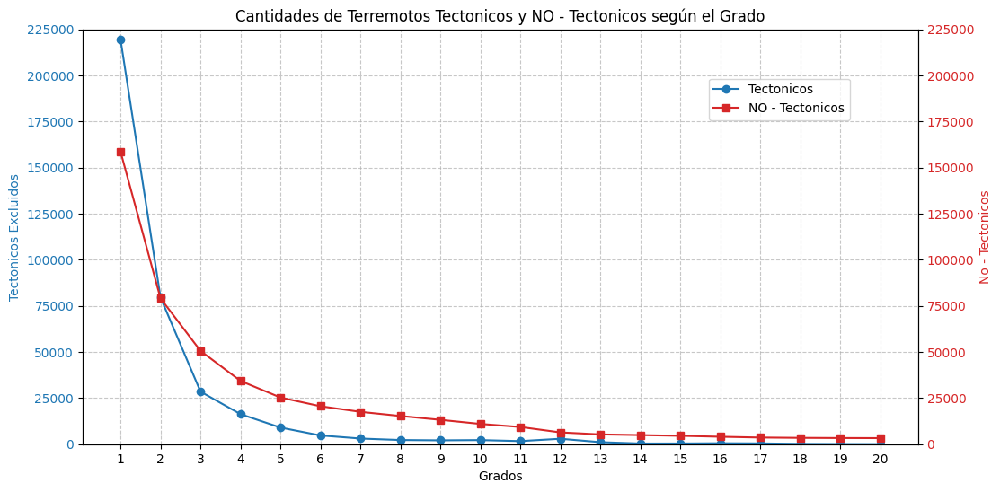

In [ ]:

# Crear la figura y los ejes con tamaño ajustado
fig, ax1 = plt.subplots(figsize=(12, 6))

# Graficar Tectonicos en azul
ax1.set_xlabel('Grados')
ax1.set_ylabel('Tectonicos Excluidos', color='tab:blue')
ax1.plot(df_clasificacion['Grados'], df_clasificacion['Tectonicos'], color='tab:blue', marker='o', label='Tectonicos')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Crear un segundo eje y para los No-tectonicos en rojo
ax2 = ax1.twinx()
ax2.set_ylabel('No - Tectonicos', color='tab:red')
ax2.plot(df_clasificacion['Grados'], df_clasificacion['No-tectonicos'], color='tab:red', marker='s', label='NO - Tectonicos')
ax2.tick_params(axis='y', labelcolor='tab:red')

# Asegurar que ambos ejes y estén en la misma escala
max_y = max(max(df_clasificacion['Tectonicos']), max(df_clasificacion['No-tectonicos']))
ax1.set_ylim(0, 225000)
ax2.set_ylim(0, 225000)

# Ajustar el eje x para mostrar todos los grados
ax1.set_xticks(df_clasificacion['Grados'])

# Agregar cuadrículas (grids) horizontales y verticales
ax1.grid(True, linestyle='--', alpha=0.7, which='both')  # Agregamos cuadrícula al eje x también

# Añadir título y leyenda
plt.title('Cantidades de Terremotos Tectonicos y NO - Tectonicos según el Grado')
fig.legend(loc="upper left", bbox_to_anchor=(0.7,0.8))


# Guardamos
plt.savefig(path + '/imagenes/Tectonicos_VS_NoTectonicos.png', bbox_inches='tight')

# Mostrar la gráfica
plt.show()

En vista a esta gráfica, un valor bueno es la separación de 7º, pues a partir de ahí la exclusión de terremotos tectónicos es bastante homogenea a la vez que conservamos una buena cantidad de terremotos No - Tectónicos.